# To make my life a bit easier...

In [1]:
def plot_sed(x, y, yerr):
    plt.clf()
    plt.errorbar(wavelength, flux, yerr=flux_err, c='red', ecolor='gray', capthick=2)
    plt.show()

In [2]:
def print_time(begin_time, end_time):
    """ 
    This function prints the time in minutes that a certain task took.
    """
    print ("--------------------------------------------------")
    print ("CPU process time: %.2f [min]" % np.round(float((end_time-start_time)/60)))
    print ("--------------------------------------------------")

In [3]:
plotpars = {'axes.labelsize': 18,
            'axes.linewidth': 1.,
            'figure.figsize': (7.,5.),
            'font.size': 12,
            'legend.frameon': True,
            'legend.framealpha': 0.85,
            'legend.edgecolor': 'black',
            'legend.loc': 'best',
            'legend.fontsize': 12,
            'mathtext.fontset': 'stixsans',
            'savefig.bbox': 'tight',
            'xtick.labelsize': 18,
            'ytick.labelsize': 18,
           }

# Packages

### General packages

In [4]:
import numpy             as np
import pandas            as pd
import matplotlib.pyplot as plt
import seaborn           as sns
import astropy.io.fits   as pf
import astropy.constants as ct
import os
import time
import scipy.interpolate as sci
import ipywidgets        as widgets

### pPXF imports

In [5]:
import ppxf.miles_util   as lib  # MILES library embedded in ppxf
import ppxf.ppxf_util    as util
import ppxf              as ppxf_module
from ppxf.ppxf           import ppxf
from ppxf.ppxf_util      import log_rebin

# Config. inputs

### Paths and files

In [6]:
seds_path    = '../../../../GAMADR3_SPECTRA/DATABASE/'
ppxf_dir     = os.path.dirname(os.path.realpath(ppxf_module.__file__))
miles_lib    = ppxf_dir+'/miles_models/Mun1.30*.fits'

In [7]:
data          = pd.read_csv('uv_redseq_psmed_oneneighbor_magphys.csv')

In [8]:
seds_list = []
for i in data['SPECID']: seds_list.append(i+'.fit')

### Constants

In [9]:
light_speed = float(str(ct.c.to('km/s')).split(' ')[0])            # selecting the numerical values 
                                                                   # (must be in km/s)
gama_resol  = 1300.

# Plot parameters (because I'm lazy)

In [10]:
plotpars = {'axes.linewidth': 1.,
            'axes.labelsize': 18,
            'xtick.labelsize': 18,
            'ytick.labelsize': 18,
            'legend.framealpha': 0.6,
            'legend.loc': 'upper right',
            'legend.fontsize': 12,
            }

In [11]:
palette      = ['#ef8a62','#f7f7f7','#67a9cf']
transparency = 0.8
lw           = 2.

# Spectral fitting

## Configuring inputs

### pPXF "fixed" parameters

In [12]:
# bounds_stars = [[], [0, 500], [], []]
# bounds_gas   = [[], [0, 500]] 
# bounds = [bounds_stars, bounds_gas]

In [13]:
# Fit (V, sig, h3, h4) moments=4 for the stars; (V, sig) moments=2 for the two gas kinematic components
moments        = [4, 2, 2]
# degree         = -1       # Additive Legendre polynomial degrees
degree         = 12        # Additive Legendre polynomial degrees
mdegree        = 12         # Multiplicative Legendre polynomial degrees
# regul_err      = 0.01     # Desired regularization error -- TODO: MUST CHECK WHY 0.013
tied_balmer    = True
limit_doublets = False
stellar_comp_w = [0]        # weight of the stellar component
balmer_comp_w  = [1]        # weight of the balmer emission lines
forbid_comp_w  = [2]        # weight of the forbidden lines
wl_min         = 3540       # MILES RANGE MIN
# wl_max         = 6750       # MILES RANGE MAX: 7409
# wl_min = 4350               # removing the bluest part of the spectra in order to mitigate noise effects
wl_max = 7409

In [14]:
new_path = 'd'+str(degree)+'m'+str(mdegree)

In [15]:
results_path = '../../LargeFilesResults/PSM_analysis/'+ new_path

#### Checking if the directory exists and, if not, creating it!

In [16]:
if not os.path.exists(results_path): os.makedirs(results_path)

### pPXF loop

In [17]:
bar = widgets.IntProgress(value=0, min=0, max=len(seds_list)+1, step=0.5, description='Running pPXF:',
                          orientation='horizontal')
display(bar)

IntProgress(value=0, description='Running pPXF:', max=139)

In [18]:
mean_age   = []
mean_metal = []
mass2light = []
ids        = []
redshifts  = []
vel_disp   = []

In [19]:
outputs_physical_header = ['CATAID', 'VEL_DISP', 'CHI2', 'VELOCITY', '<logAge>', '<[M/H]>', 'MASS2LIGHT_R']
outputs_physical = []

In [20]:
plt.rcParams.update(plotpars)

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47881      1000     0.095     0.083
 comp.  1:     47945      1000
 comp.  2:     47837        30
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01439
method = capfit; Jac calls: 19; Func calls: 426; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  7 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      9.375       9.1   47945  1000
Comp:  2       Unknown     0.2492       2.6   47837    30
Comp:  2       Unknown          0       2.5   47837    30
Comp:  2       Unknown     0.1513       1.8   47837    30
Comp:  2       Unknown     0.6775       1.2   47837    30
---------------------------------------------------------
Weighted <logAge> [yr]: 9.93
Weighted <[M/H]>: -0.00125
Weighted <logAge> [yr]: 9.93
Weighted <[M/H]>: -0.00125
M/L_r: 1.1
Current $\chi^2$: 0.0144
Ela

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


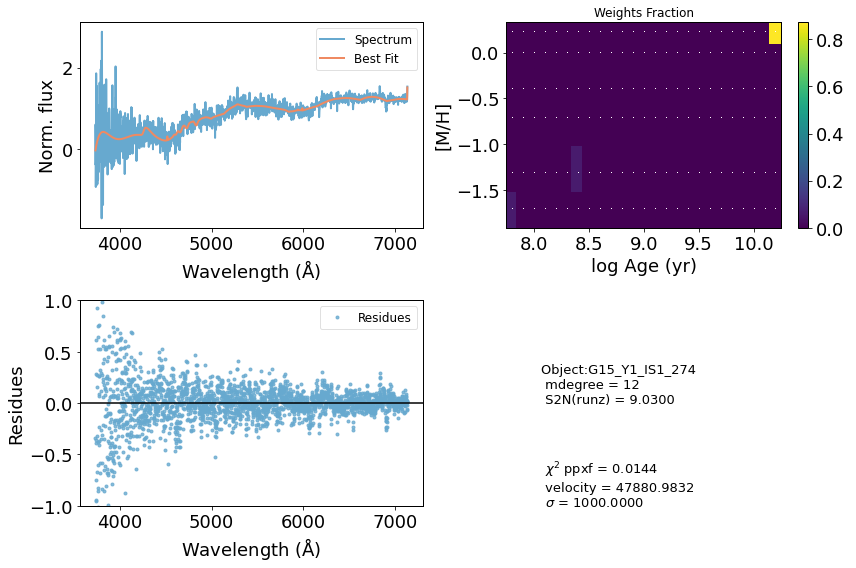

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44084       515     0.027     0.016
 comp.  1:     44174       612
 comp.  2:     44248       105
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.007008
method = capfit; Jac calls: 14; Func calls: 320; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.972       9.4   44174   612
Comp:  2       Unknown          0       3.3   44248   105
Comp:  2       Unknown          0       3.3   44248   105
Comp:  2       Unknown     0.3713       2.8   44248   105
Comp:  2       Unknown     0.3241         2   44248   105
---------------------------------------------------------
Weighted <logAge> [yr]: 7.8
Weighted <[M/H]>: -1.71
Weighted <logAge> [yr]: 7.8
Weighted <[M/H]>: -1.71
M/L_r: 0.1626
Current $\chi^2$: 0.0070
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


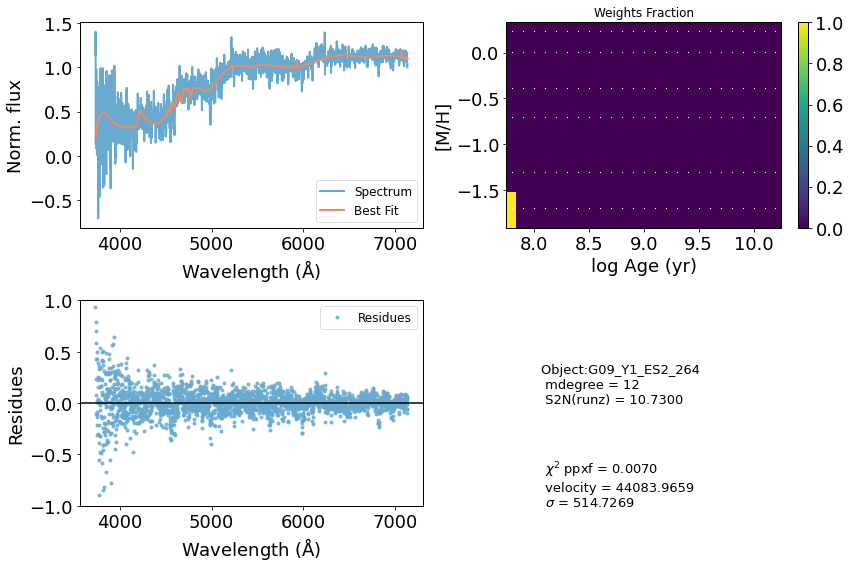

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38061       180     0.000     0.000
 comp.  1:     38061       180
 comp.  2:     38061       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.008871
method = capfit; Jac calls: 1; Func calls: 27; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.2   38061   180
Comp:  2       Unknown          0       7.4   38061   180
Comp:  2       Unknown          0       7.4   38061   180
Comp:  2       Unknown          0       3.5   38061   180
Comp:  2       Unknown          0       1.9   38061   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.8
Weighted <[M/H]>: -1.71
Weighted <logAge> [yr]: 7.8
Weighted <[M/H]>: -1.71
M/L_r: 0.1626
Current $\chi^2$: 0.0089
Elapsed ti

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


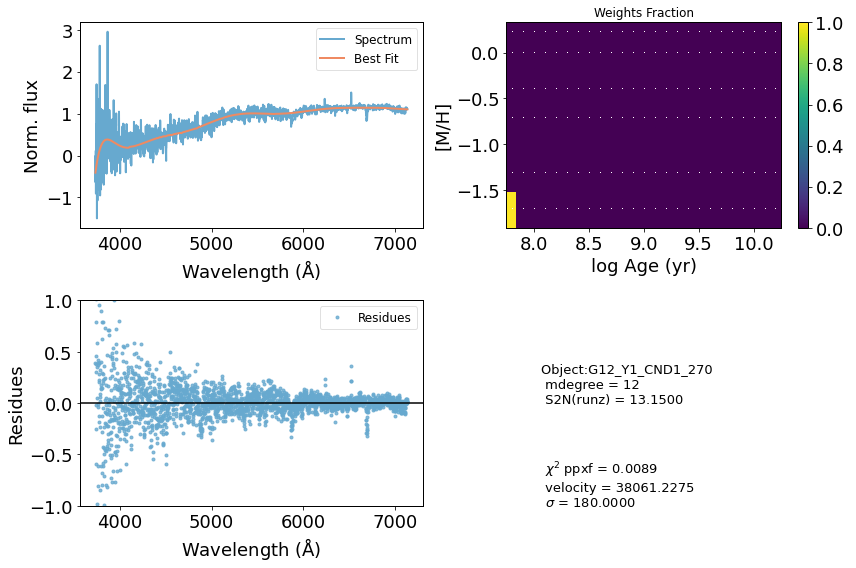

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38823      1000    -0.024    -0.015
 comp.  1:     38929       814
 comp.  2:     38997       178
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01587
method = capfit; Jac calls: 14; Func calls: 314; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.128       7.4   38929   814
Comp:  2       Unknown          0       6.8   38997   178
Comp:  2       Unknown          0       6.8   38997   178
Comp:  2       Unknown          0       3.5   38997   178
Comp:  2       Unknown     0.2536       2.1   38997   178
---------------------------------------------------------
Weighted <logAge> [yr]: 9.97
Weighted <[M/H]>: 0.211
Weighted <logAge> [yr]: 9.97
Weighted <[M/H]>: 0.211
M/L_r: 4.519
Current $\chi^2$: 0.0159
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


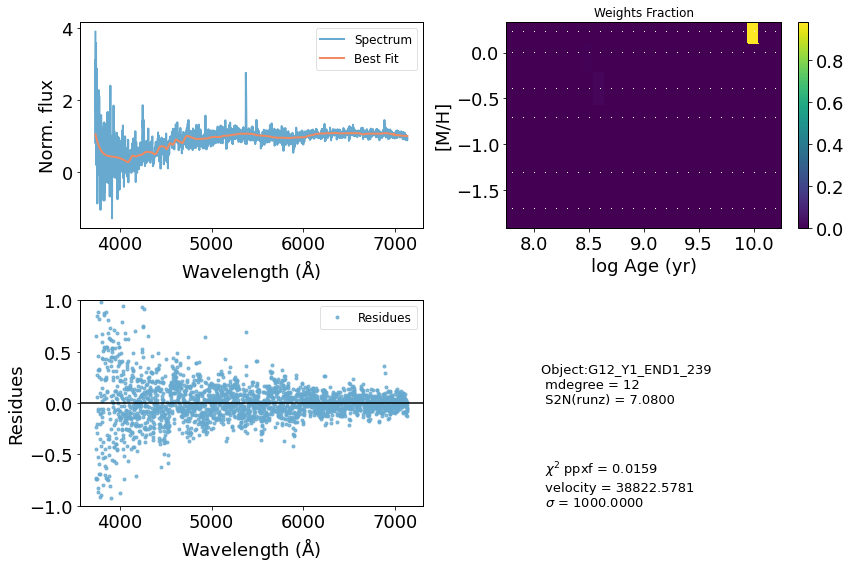

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     66626      1000     0.025     0.042
 comp.  1:     67204      1000
 comp.  2:     67101        14
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01171
method = capfit; Jac calls: 10; Func calls: 232; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      9.375        10   67204  1000
Comp:  2       Unknown          0       2.1   67101    14
Comp:  2       Unknown          0       2.1   67101    14
Comp:  2       Unknown     0.1731       1.5   67101    14
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
M/L_r: 4.816
Current $\chi^2$: 0.0117
Elapsed time in PPXF: 0.76 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


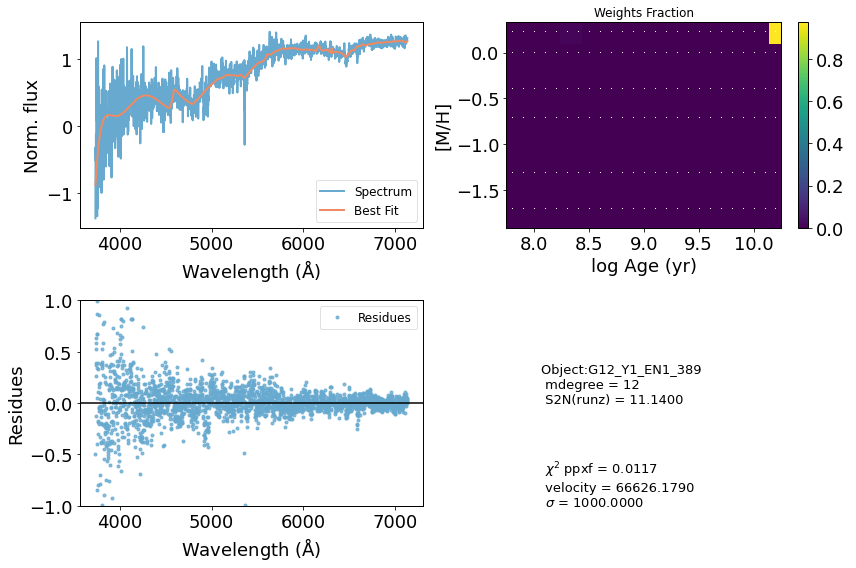

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     34935       864    -0.005     0.010
 comp.  1:     34638       139
 comp.  2:     34477       146
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.02602
method = capfit; Jac calls: 23; Func calls: 513; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      0.248       2.5   34638   139
Comp:  2       Unknown          0         6   34477   146
Comp:  2       Unknown          0         6   34477   146
Comp:  2       Unknown     0.1424       3.4   34477   146
Comp:  2       Unknown     0.9749       1.8   34477   146
Comp:  2       Unknown     0.4701       1.6   34477   146
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.206
Weighted <logAge> [yr]: 10.1
Weighted <[

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


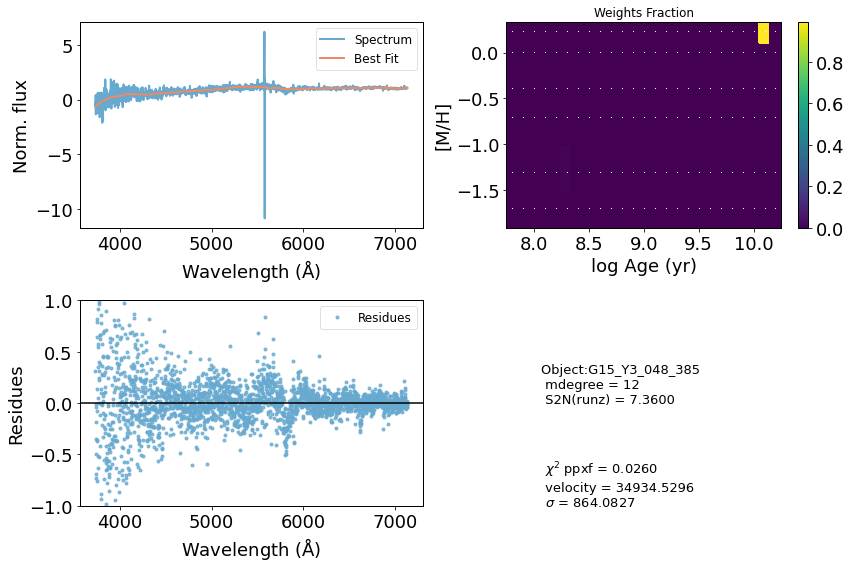

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56701      1000    -0.127    -0.050
 comp.  1:     57891      1000
 comp.  2:     58829       335
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01902
method = capfit; Jac calls: 24; Func calls: 535; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.912        11   57891  1000
Comp:  2       Unknown     0.8094        11   58829   335
Comp:  2       Unknown     0.5606        11   58829   335
Comp:  2       Unknown          0       3.7   58829   335
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
M/L_r: 5.703
Current $\chi^2$: 0.0190
Elapsed time in PPXF: 1.90 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


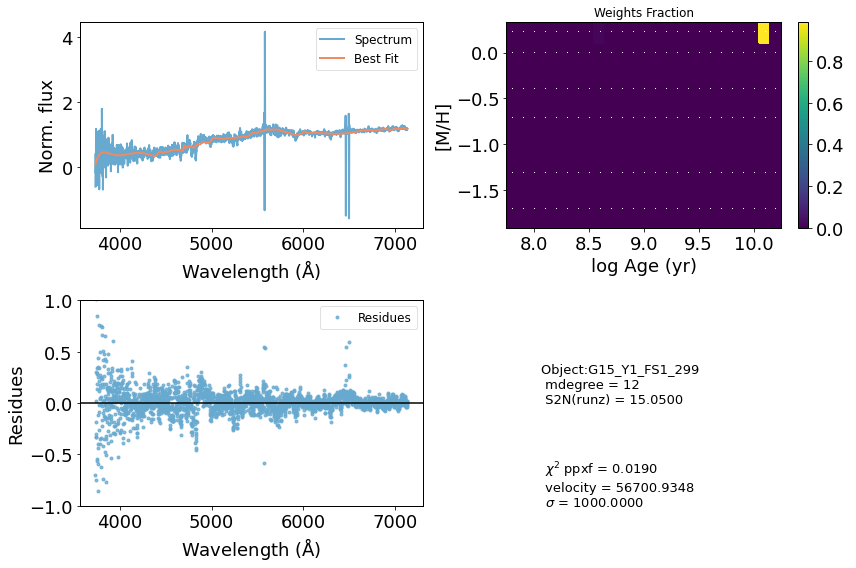

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49012      1000    -0.108     0.140
 comp.  1:     49473      1000
 comp.  2:     50586       941
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.03223
method = capfit; Jac calls: 19; Func calls: 429; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      19.66       8.3   49473  1000
Comp:  2       Unknown          0        55   50586   941
Comp:  2       Unknown      7.697        55   50586   941
Comp:  2       Unknown          0       5.5   50586   941
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.219
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.219
M/L_r: 7.777
Current $\chi^2$: 0.0322
Elapsed time in PPXF: 1.32 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


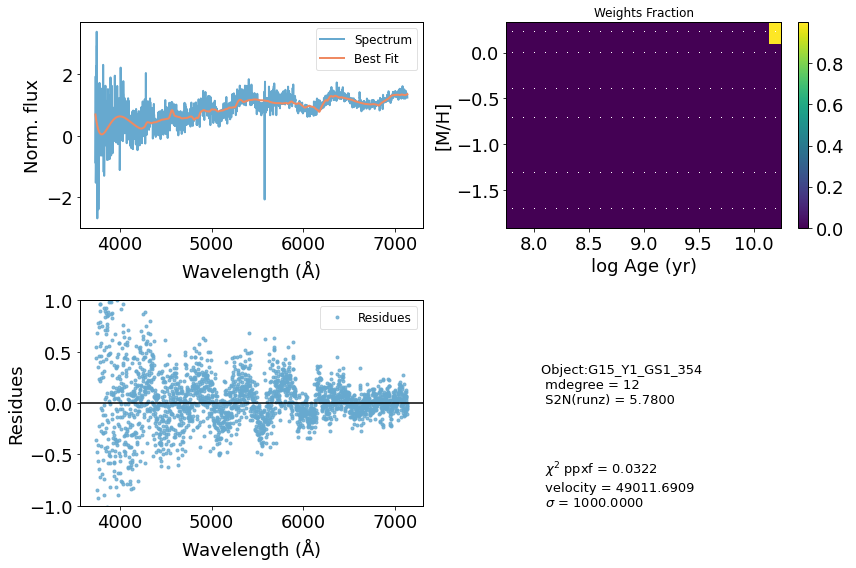

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52927       180     0.000     0.000
 comp.  1:     52927       180
 comp.  2:     52927       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.379
method = capfit; Jac calls: 1; Func calls: 30; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.9   52927   180
Comp:  2       Unknown      5.554        11   52927   180
Comp:  2       Unknown          0        11   52927   180
Comp:  2       Unknown          0       1.9   52927   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
M/L_r: 5.992
Current $\chi^2$: 0.3790
Elapsed time in PPXF: 0.11 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


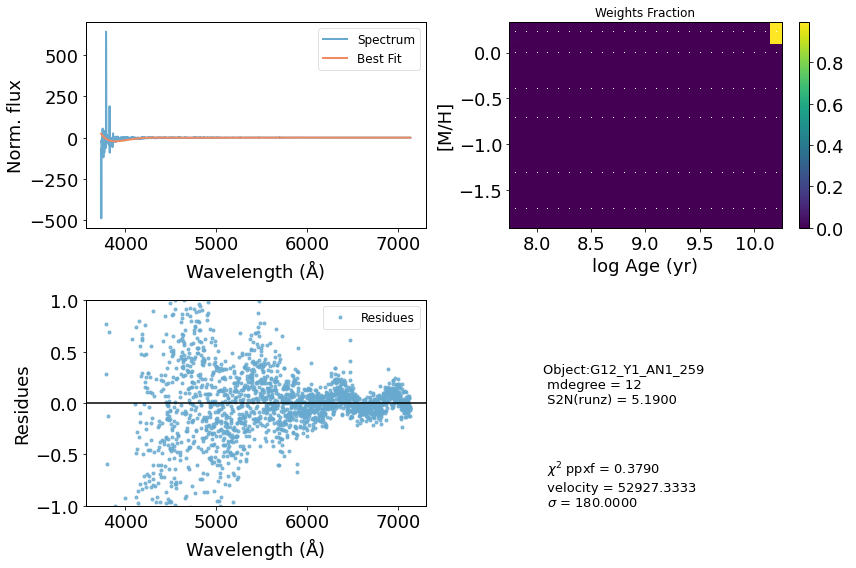

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45519       580     0.006     0.009
 comp.  1:     46129      1000
 comp.  2:     45715       186
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005734
method = capfit; Jac calls: 17; Func calls: 382; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.171        10   46129  1000
Comp:  2       Unknown     0.2271       6.2   45715   186
Comp:  2       Unknown          0       6.2   45715   186
Comp:  2       Unknown     0.5589       3.7   45715   186
Comp:  2       Unknown          0       2.4   45715   186
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.183
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.183
M/L_r: 3.516
Current $\chi^2$: 0.0057
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


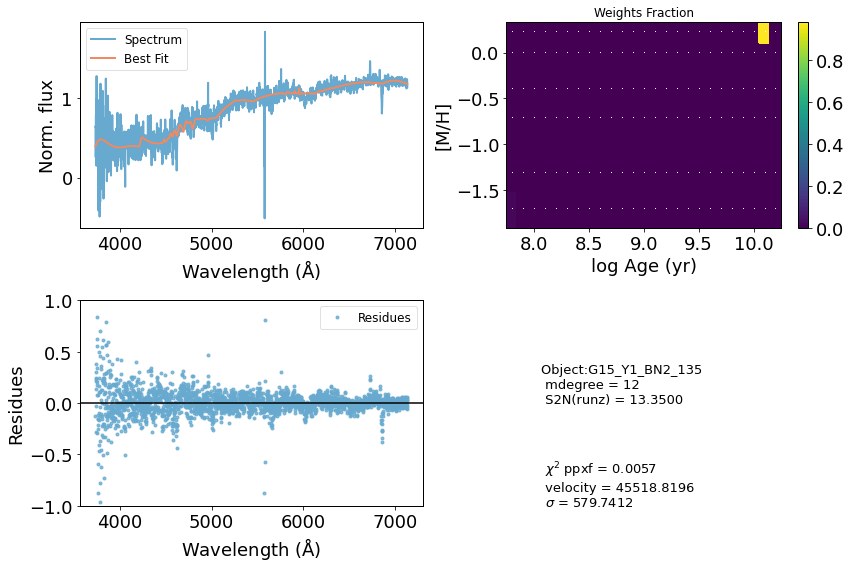

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41650       609    -0.045     0.031
 comp.  1:     41671       909
 comp.  2:     41506       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.009392
method = capfit; Jac calls: 11; Func calls: 251; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.467       6.7   41671   909
Comp:  2       Unknown          0       7.7   41506   180
Comp:  2       Unknown    0.09223       8.4   41506   180
Comp:  2       Unknown          0       3.1   41506   180
Comp:  2       Unknown          0       1.6   41506   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.204
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.204
M/L_r: 4.702
Current $\chi^2$: 0.0094
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


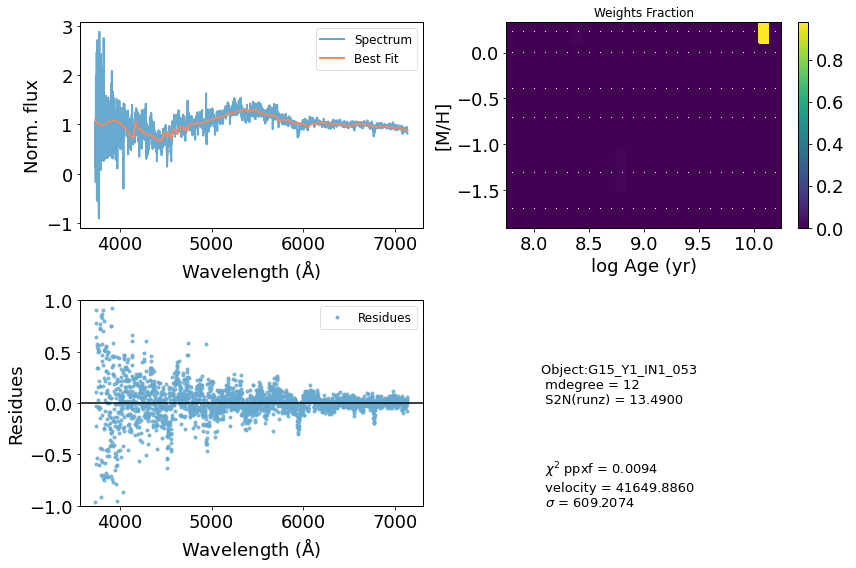

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49463         1    -0.003    -0.004
 comp.  1:     49482       296
 comp.  2:     50762      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.017
method = capfit; Jac calls: 17; Func calls: 379; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.983       4.2   49482   296
Comp:  2       Unknown          0        53   50762  1000
Comp:  2       Unknown    0.06676        53   50762  1000
Comp:  2       Unknown      4.649       6.2   50762  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 8.13
Weighted <[M/H]>: -1.54
Weighted <logAge> [yr]: 8.13
Weighted <[M/H]>: -1.54
M/L_r: 0.1866
Current $\chi^2$: 0.0170
Elapsed time in PPXF: 1.34 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


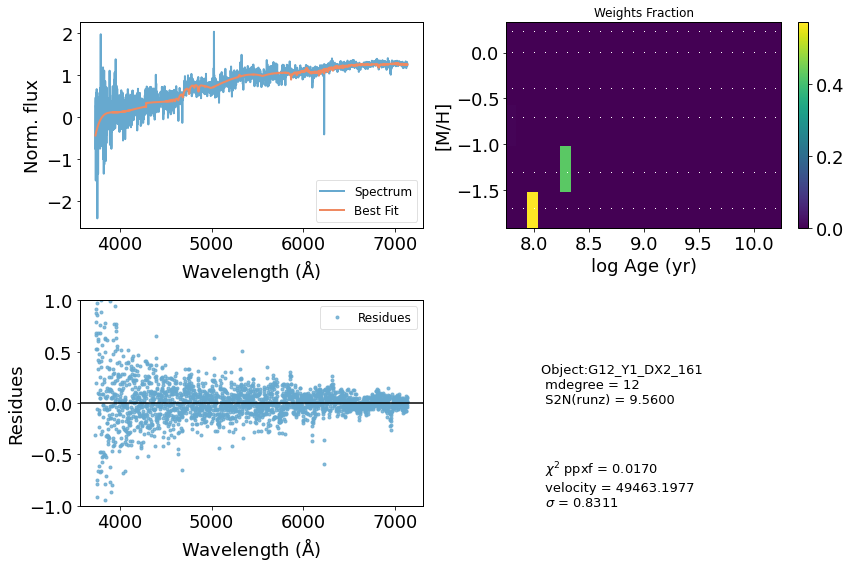

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     31048       364    -0.004    -0.001
 comp.  1:     31486        98
 comp.  2:     31806       130
Gas Reddening E(B-V): 2.937
chi2/DOF: 0.005763
method = capfit; Jac calls: 11; Func calls: 249; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4206       1.7   31486    98
Comp:  2       Unknown       0.15       5.2   31806   130
Comp:  2       Unknown          0       5.1   31806   130
Comp:  2       Unknown          0       3.6   31806   130
Comp:  2       Unknown          0       3.2   31806   130
Comp:  2       Unknown     0.4113         2   31806   130
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.0804
Weighted <logAge> [yr]: 10.2
Weighted <

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


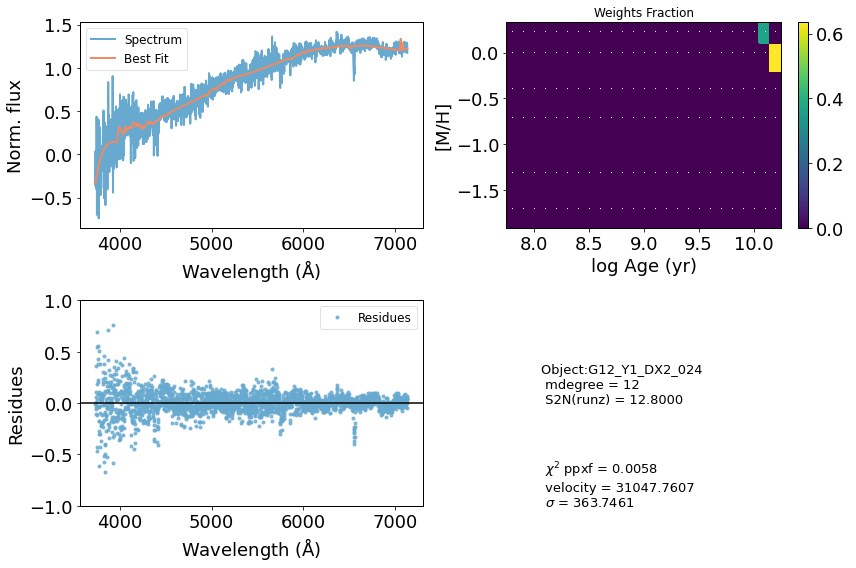

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44250       307    -0.002    -0.004
 comp.  1:     44231       179
 comp.  2:     44157       572
Gas Reddening E(B-V): 0.899
chi2/DOF: 0.03128
method = capfit; Jac calls: 8; Func calls: 184; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.7   44231   179
Comp:  2       Unknown          0        24   44157   572
Comp:  2       Unknown       0.48        24   44157   572
Comp:  2       Unknown      3.498       5.7   44157   572
Comp:  2       Unknown     0.8433       3.6   44157   572
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.187
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.187
M/L_r: 4.543
Current $\chi^2$: 0.0313
Elapsed t

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


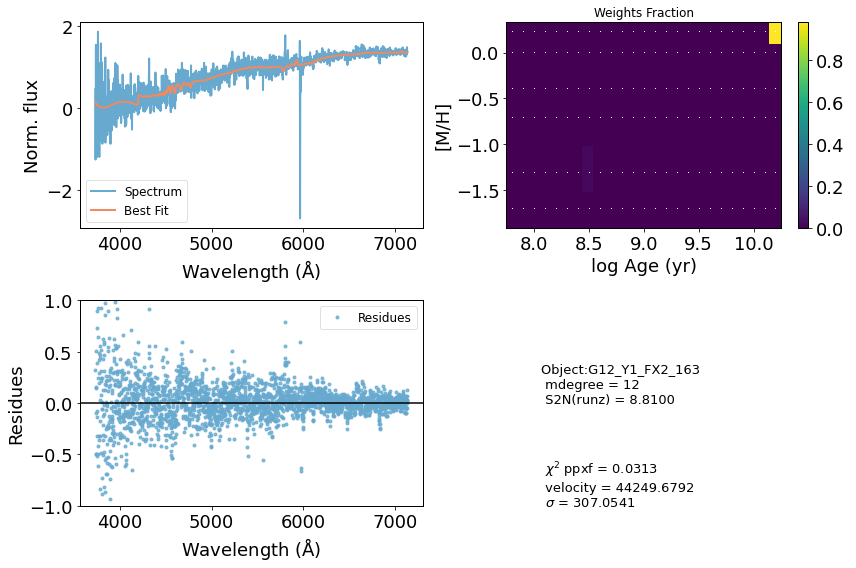

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50280      1000    -0.115     0.070
 comp.  1:     49621      1000
 comp.  2:     52572      1000
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01491
method = capfit; Jac calls: 25; Func calls: 560; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.464       8.7   49621  1000
Comp:  2       Unknown      4.561        48   52572  1000
Comp:  2       Unknown      4.355        48   52572  1000
Comp:  2       Unknown          0       6.2   52572  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.218
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.218
M/L_r: 6.567
Current $\chi^2$: 0.0149
Elapsed time in PPXF: 1.82 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


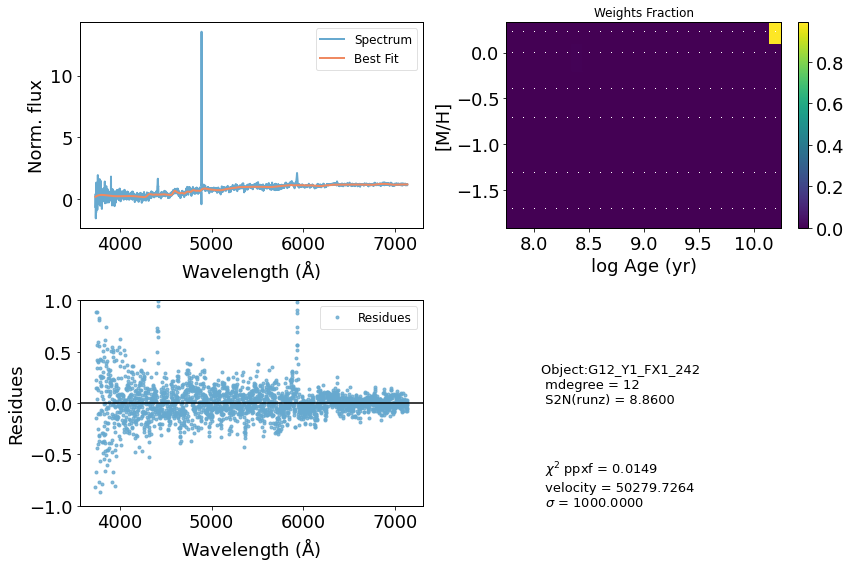

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     55615       841    -0.063    -0.066
 comp.  1:     55854      1000
 comp.  2:     56521        31
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01011
method = capfit; Jac calls: 10; Func calls: 228; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      22.18        11   55854  1000
Comp:  2       Unknown          0       2.4   56521    31
Comp:  2       Unknown     0.9334       2.5   56521    31
Comp:  2       Unknown    0.02418       1.5   56521    31
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.158
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.158
M/L_r: 2.351
Current $\chi^2$: 0.0101
Elapsed time in PPXF: 0.80 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


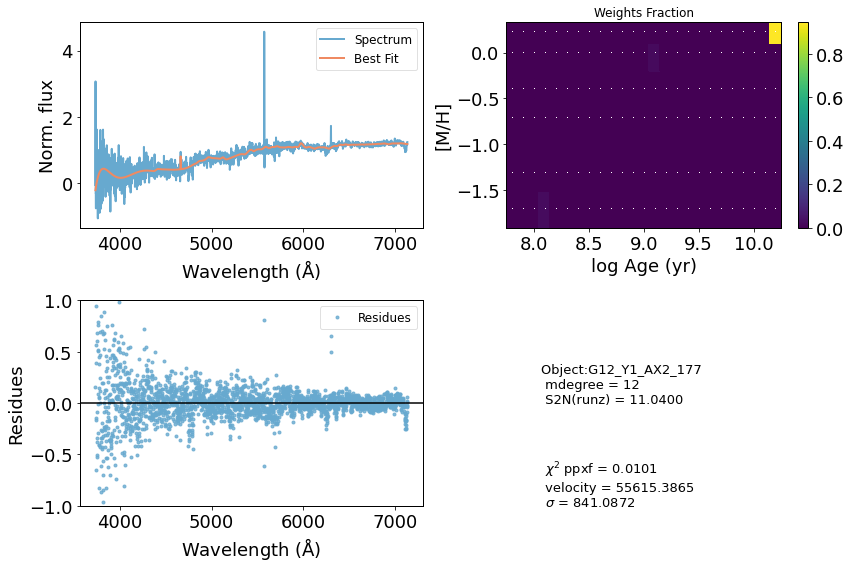

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43869         1    -0.001    -0.003
 comp.  1:     43937       621
 comp.  2:     43890       206
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01661
method = capfit; Jac calls: 10; Func calls: 228; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      17.91       8.7   43937   621
Comp:  2       Unknown          0       5.5   43890   206
Comp:  2       Unknown      1.412       5.5   43890   206
Comp:  2       Unknown          0         4   43890   206
Comp:  2       Unknown     0.1882       2.9   43890   206
---------------------------------------------------------
Weighted <logAge> [yr]: 7.8
Weighted <[M/H]>: -1.71
Weighted <logAge> [yr]: 7.8
Weighted <[M/H]>: -1.71
M/L_r: 0.1626
Current $\chi^2$: 0.0166
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


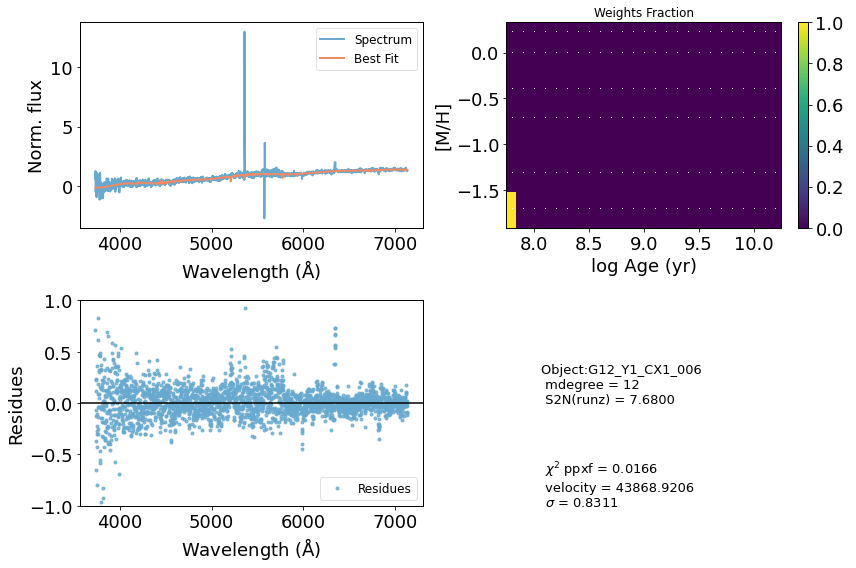

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50734       265    -0.008     0.006
 comp.  1:     50910       180
 comp.  2:     50702       253
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006985
method = capfit; Jac calls: 7; Func calls: 161; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown    0.09823       3.9   50910   180
Comp:  2       Unknown          0       6.9   50702   253
Comp:  2       Unknown      1.064       6.7   50702   253
Comp:  2       Unknown      1.144       3.7   50702   253
---------------------------------------------------------
Weighted <logAge> [yr]: 9.94
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 9.94
Weighted <[M/H]>: 0.22
M/L_r: 1.695
Current $\chi^2$: 0.0070
Elapsed time in PPXF: 0.50 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


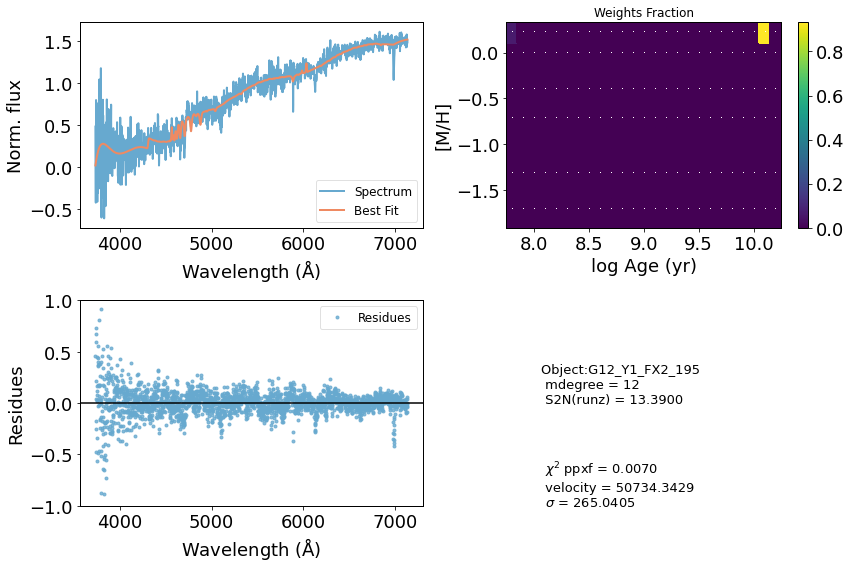

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[SII]6716' '[SII]6731' '[OIII]5007_d'
 '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     22541       267    -0.001     0.047
 comp.  1:     22655       366
 comp.  2:     22939       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.00624
method = capfit; Jac calls: 8; Func calls: 185; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 158
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.284       5.1   22655   366
Comp:  2       Unknown      1.424       8.8   22939   180
Comp:  2       Unknown          0       8.5   22939   180
Comp:  2       Unknown          0       1.7   22939   180
Comp:  2       Unknown    0.04004       1.8   22939   180
Comp:  2       Unknown          0       5.3   22939   180
Comp:  2       Unknown          0       2.1   22939   180
Comp:  2       Unknown          0       2.3   22939   180
------------------------------------

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


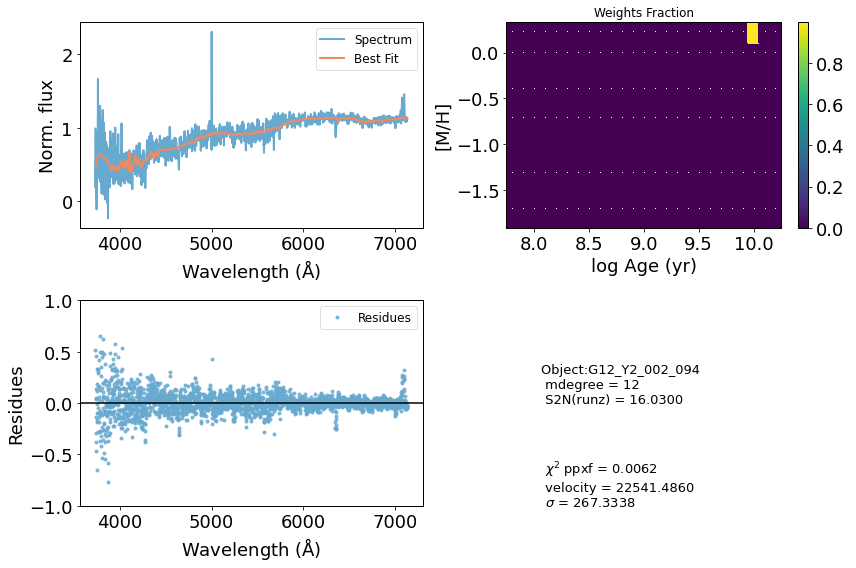

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48376      1000     0.108     0.130
 comp.  1:     48177       108
 comp.  2:     48402      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.007038
method = capfit; Jac calls: 17; Func calls: 382; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5785       3.4   48177   108
Comp:  2       Unknown          0        50   48402  1000
Comp:  2       Unknown          0        50   48402  1000
Comp:  2       Unknown      3.033       6.7   48402  1000
Comp:  2       Unknown       1.71       5.9   48402  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 8.3
Weighted <[M/H]>: -1.71
Weighted <logAge> [yr]: 8.3
Weighted <[M/H]>: -1.71
M/L_r: 0.1444
Current $\chi^2$: 0.0070
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


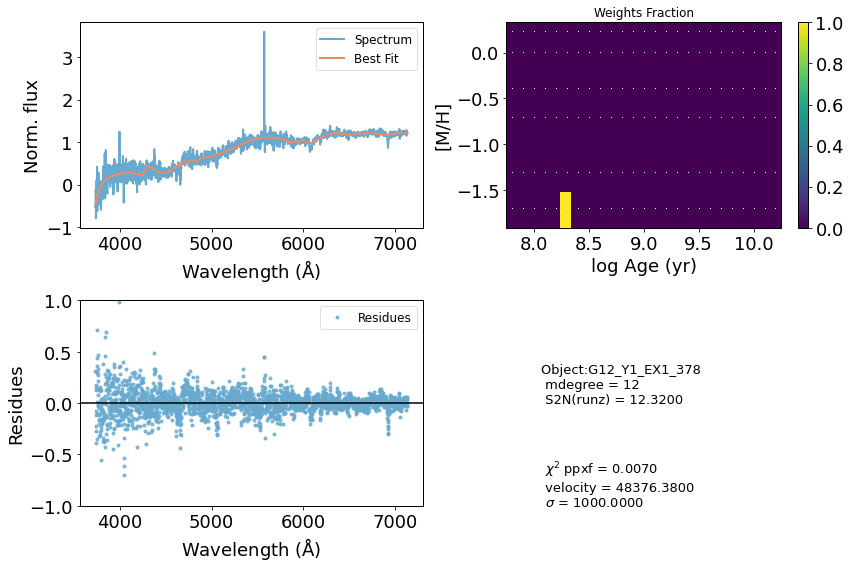

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50827      1000     0.015     0.146
 comp.  1:     50840       124
 comp.  2:     51065       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.007441
method = capfit; Jac calls: 15; Func calls: 337; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3395         3   50840   124
Comp:  2       Unknown          0       4.5   51065   180
Comp:  2       Unknown          0       4.4   51065   180
Comp:  2       Unknown          0       3.1   51065   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.2
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.2
M/L_r: 3.463
Current $\chi^2$: 0.0074
Elapsed time in PPXF: 0.99 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


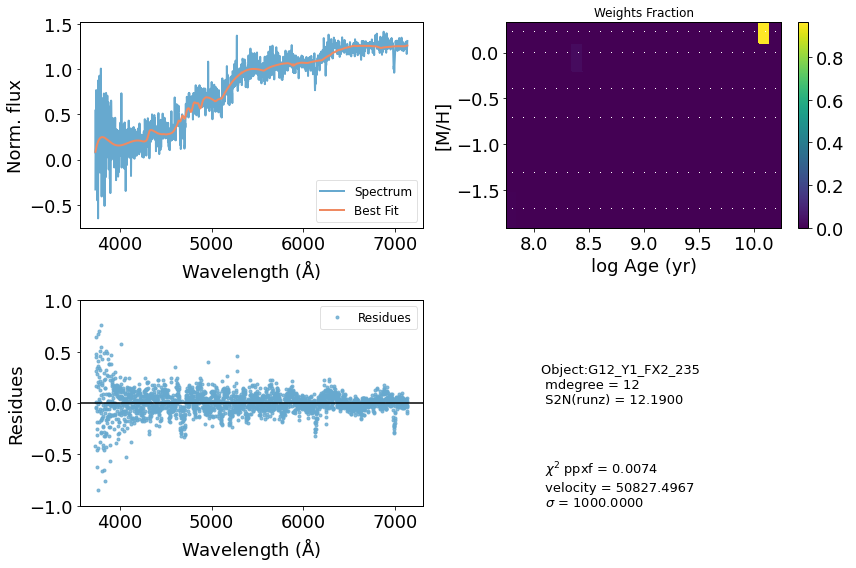

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     72288      1000     0.066     0.245
 comp.  1:     72299       423
 comp.  2:     72978         7
Gas Reddening E(B-V): 5.460
chi2/DOF: 0.01819
method = capfit; Jac calls: 13; Func calls: 293; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       1.93       3.2   72299   423
Comp:  2       Unknown     0.7302       2.1   72978     7
Comp:  2       Unknown    0.02606         2   72978     7
Comp:  2       Unknown          0       1.2   72978     7
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.108
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.108
M/L_r: 4.612
Current $\chi^2$: 0.0182
Elapsed time in PPXF: 0.90 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


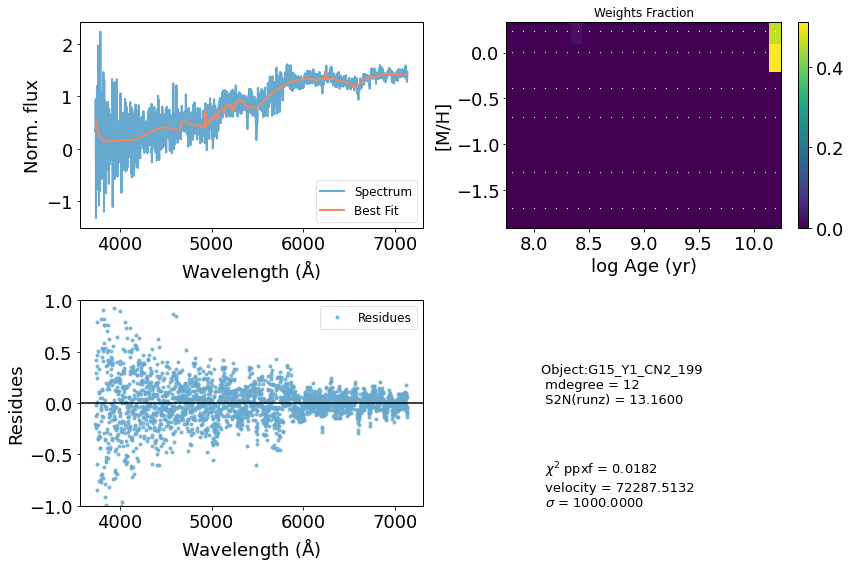

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46399       412     0.000     0.003
 comp.  1:     46315        15
 comp.  2:     46240         8
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.00525
method = capfit; Jac calls: 10; Func calls: 228; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  8 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.1666       1.9   46315    15
Comp:  2       Unknown     0.3101       2.7   46240     8
Comp:  2       Unknown     0.2626       2.7   46240     8
Comp:  2       Unknown     0.2269       1.8   46240     8
Comp:  2       Unknown     0.1977       1.1   46240     8
---------------------------------------------------------
Weighted <logAge> [yr]: 8.44
Weighted <[M/H]>: 0.129
Weighted <logAge> [yr]: 8.44
Weighted <[M/H]>: 0.129
M/L_r: 0.2791
Current $\chi^2$: 0.0053
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


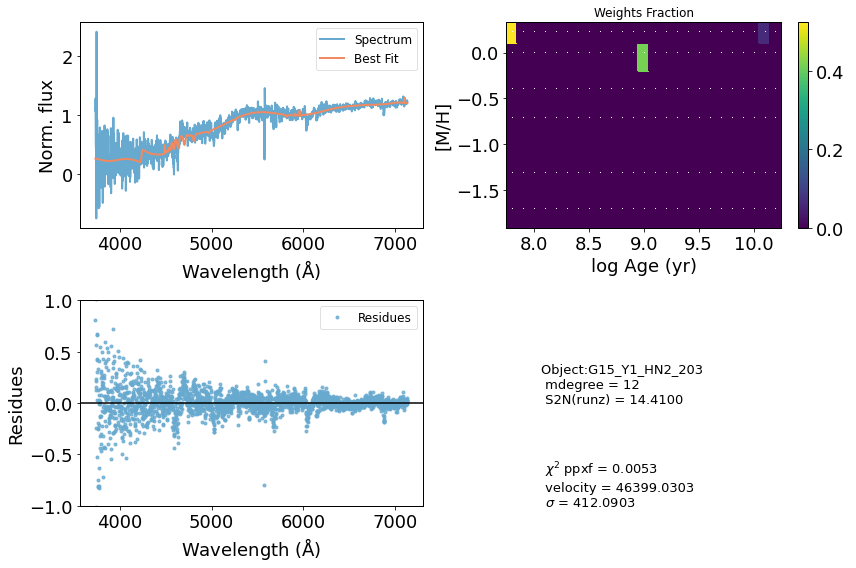

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59235       941    -0.016     0.017
 comp.  1:     59914      1000
 comp.  2:     60257      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01743
method = capfit; Jac calls: 17; Func calls: 384; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      8.767        11   59914  1000
Comp:  2       Unknown          0        46   60257  1000
Comp:  2       Unknown          0        46   60257  1000
Comp:  2       Unknown      8.301       6.2   60257  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
M/L_r: 8.088
Current $\chi^2$: 0.0174
Elapsed time in PPXF: 1.16 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


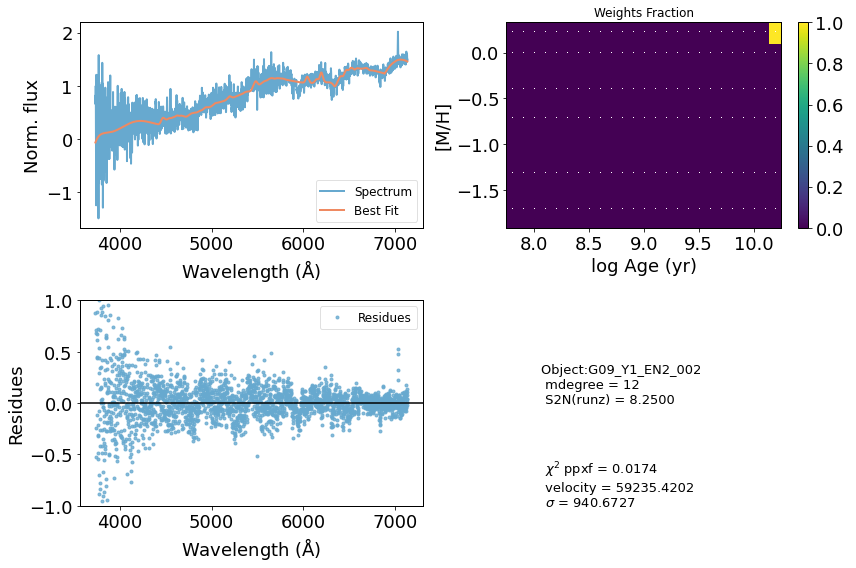

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35142       239     0.050     0.049
 comp.  1:     35127       359
 comp.  2:     34998       271
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005394
method = capfit; Jac calls: 6; Func calls: 143; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.168       4.7   35127   359
Comp:  2       Unknown          0       9.5   34998   271
Comp:  2       Unknown          0       9.4   34998   271
Comp:  2       Unknown    0.07993       4.3   34998   271
Comp:  2       Unknown      0.362         3   34998   271
Comp:  2       Unknown     0.4109       2.6   34998   271
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


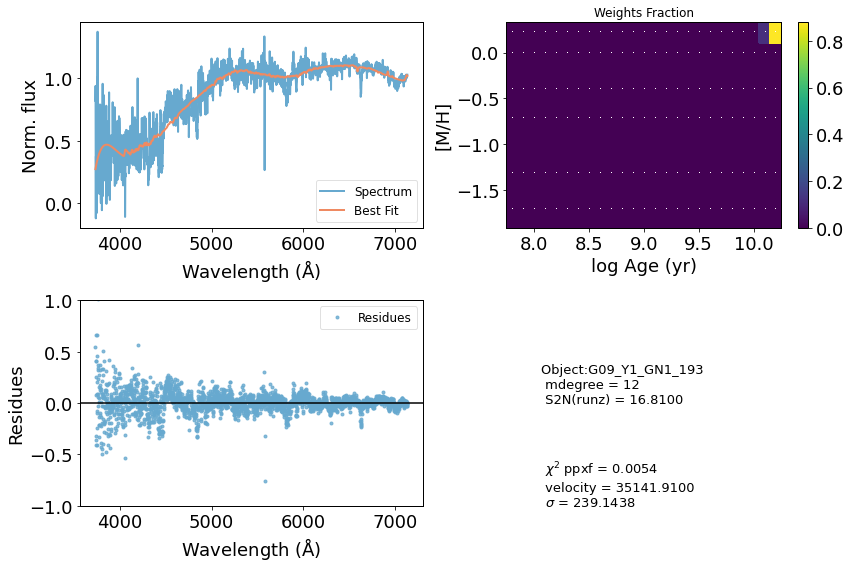

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46097       946     0.004     0.041
 comp.  1:     46138        78
 comp.  2:     46156        35
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01006
method = capfit; Jac calls: 16; Func calls: 357; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  7 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.189       2.8   46138    78
Comp:  2       Unknown     0.3784       2.5   46156    35
Comp:  2       Unknown     0.2118       2.5   46156    35
Comp:  2       Unknown     0.1412       1.9   46156    35
Comp:  2       Unknown     0.3901         1   46156    35
---------------------------------------------------------
Weighted <logAge> [yr]: 8.22
Weighted <[M/H]>: -1.43
Weighted <logAge> [yr]: 8.22
Weighted <[M/H]>: -1.43
M/L_r: 0.1918
Current $\chi^2$: 0.0101
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


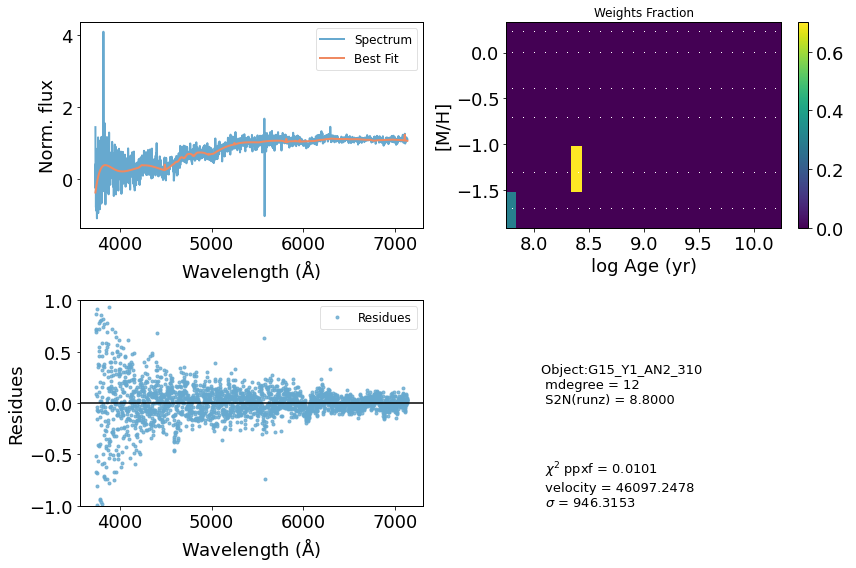

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35667       676     0.002    -0.001
 comp.  1:     35681      1000
 comp.  2:     36470       153
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.0675
method = capfit; Jac calls: 14; Func calls: 315; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       12.4       9.1   35681  1000
Comp:  2       Unknown          0       5.4   36470   153
Comp:  2       Unknown          0       5.4   36470   153
Comp:  2       Unknown     0.8188         4   36470   153
Comp:  2       Unknown          0       2.5   36470   153
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.212
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.212
M/L_r: 5.532
Current $\chi^2$: 0.0675
Elapsed t

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


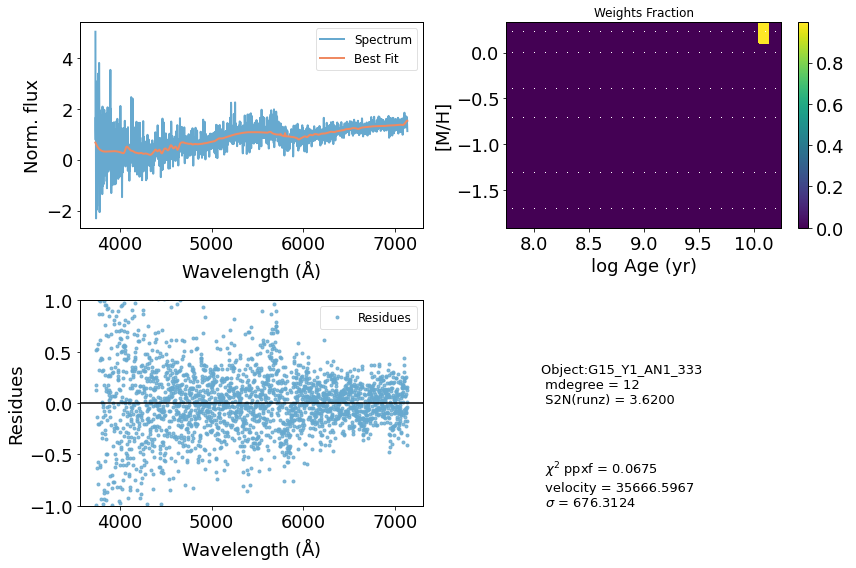

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46054       290    -0.002    -0.002
 comp.  1:     46303       494
 comp.  2:     46158       355
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005291
method = capfit; Jac calls: 15; Func calls: 335; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       8.13       8.1   46303   494
Comp:  2       Unknown          0        11   46158   355
Comp:  2       Unknown     0.3217        11   46158   355
Comp:  2       Unknown       0.75       4.5   46158   355
Comp:  2       Unknown          0       3.5   46158   355
---------------------------------------------------------
Weighted <logAge> [yr]: 8.17
Weighted <[M/H]>: -1.46
Weighted <logAge> [yr]: 8.17
Weighted <[M/H]>: -1.46
M/L_r: 0.1876
Current $\chi^2$: 0.0053
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


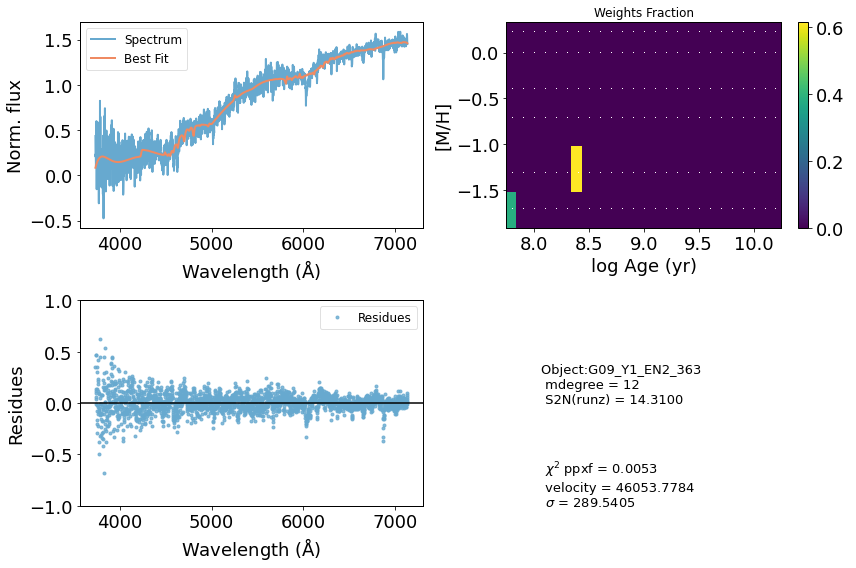

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41841       316     0.002     0.002
 comp.  1:     41573       215
 comp.  2:     41268         1
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01561
method = capfit; Jac calls: 13; Func calls: 292; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.621       3.8   41573   215
Comp:  2       Unknown     0.2245         3   41268     1
Comp:  2       Unknown     0.6369         3   41268     1
Comp:  2       Unknown          0       1.9   41268     1
Comp:  2       Unknown          0         1   41268     1
---------------------------------------------------------
Weighted <logAge> [yr]: 8.25
Weighted <[M/H]>: -1.41
Weighted <logAge> [yr]: 8.25
Weighted <[M/H]>: -1.41
M/L_r: 0.1948
Current $\chi^2$: 0.0156
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


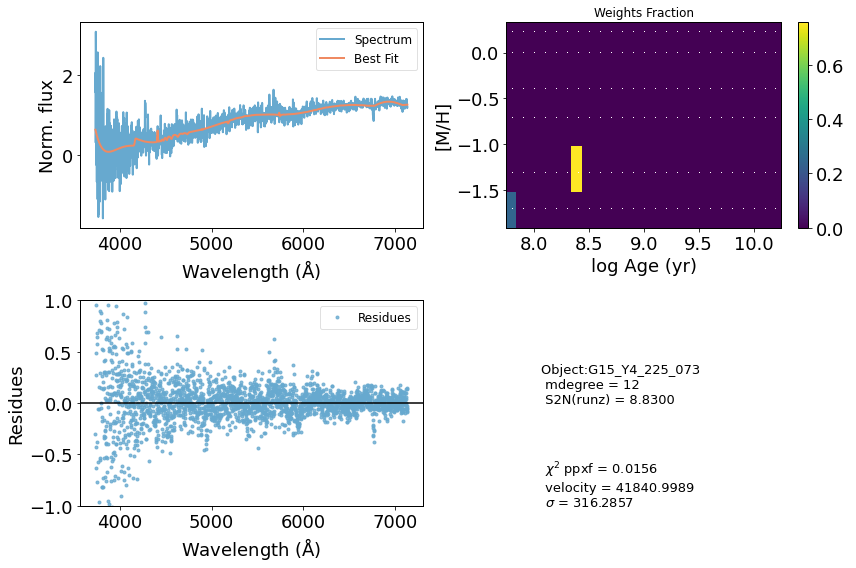

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[SII]6716' '[SII]6731' '[OIII]5007_d'
 '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     26585       232    -0.001    -0.004
 comp.  1:     28135      1000
 comp.  2:     26862       133
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01144
method = capfit; Jac calls: 18; Func calls: 401; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 158
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.484       9.3   28135  1000
Comp:  2       Unknown      2.579        11   26862   133
Comp:  2       Unknown          0        11   26862   133
Comp:  2       Unknown          0       1.5   26862   133
Comp:  2       Unknown          0       1.5   26862   133
Comp:  2       Unknown     0.4059       3.5   26862   133
Comp:  2       Unknown          0       1.9   26862   133
Comp:  2       Unknown          0       2.2   26862   133
------------------------------------

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


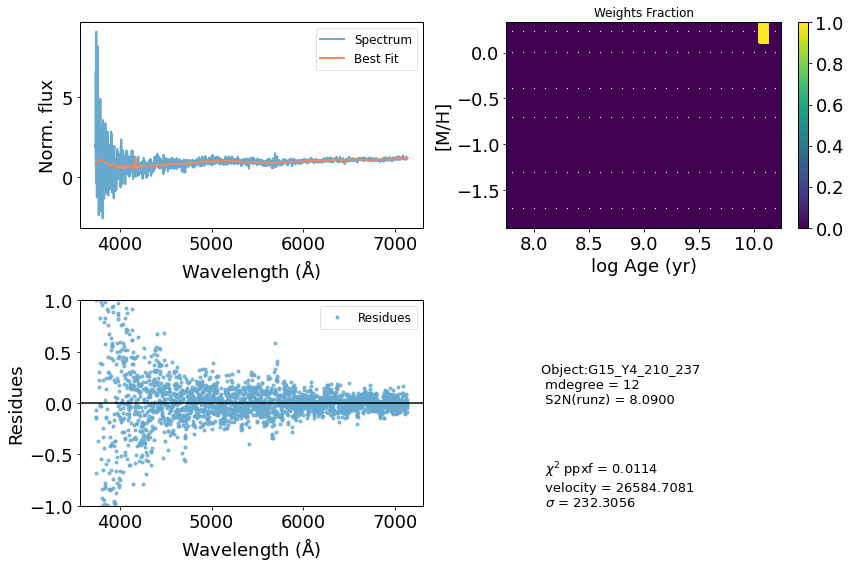

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36426      1000     0.026     0.035
 comp.  1:     34493       284
 comp.  2:     34519       158
Gas Reddening E(B-V): 2.360
chi2/DOF: 0.00869
method = capfit; Jac calls: 18; Func calls: 405; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4489       2.2   34493   284
Comp:  2       Unknown          0       6.3   34519   158
Comp:  2       Unknown          0       6.3   34519   158
Comp:  2       Unknown   0.003448       3.7   34519   158
Comp:  2       Unknown          0       2.3   34519   158
Comp:  2       Unknown     0.6164       1.9   34519   158
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.215
Weighted <logAge> [yr]: 10.2
Weighted <[M

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


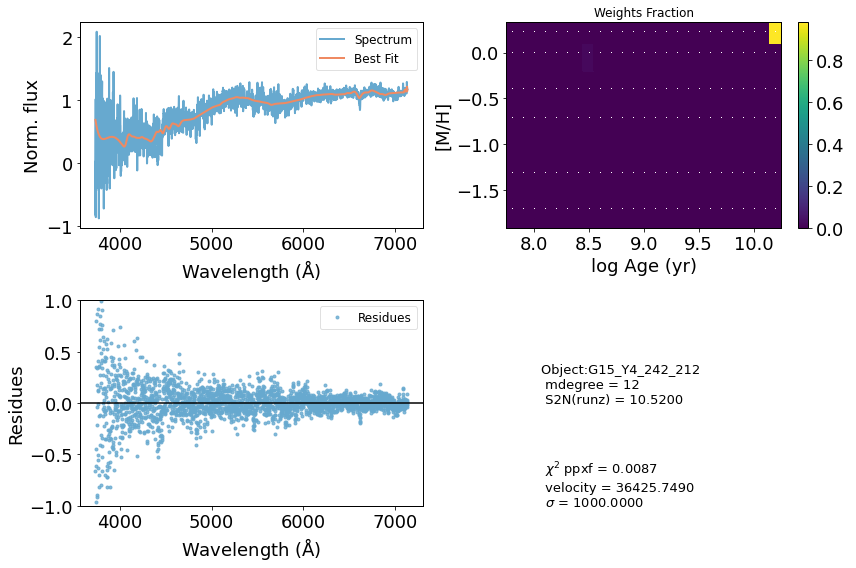

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     76679       387     0.001     0.000
 comp.  1:     77173       790
 comp.  2:     77519       264
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.08346
method = capfit; Jac calls: 12; Func calls: 269; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      19.02       9.1   77173   790
Comp:  2       Unknown          0       6.2   77519   264
Comp:  2       Unknown          0       6.3   77519   264
Comp:  2       Unknown      2.749         3   77519   264
---------------------------------------------------------
Weighted <logAge> [yr]: 8.69
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 8.69
Weighted <[M/H]>: 0.22
M/L_r: 0.5611
Current $\chi^2$: 0.0835
Elapsed time in PPXF: 0.78 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


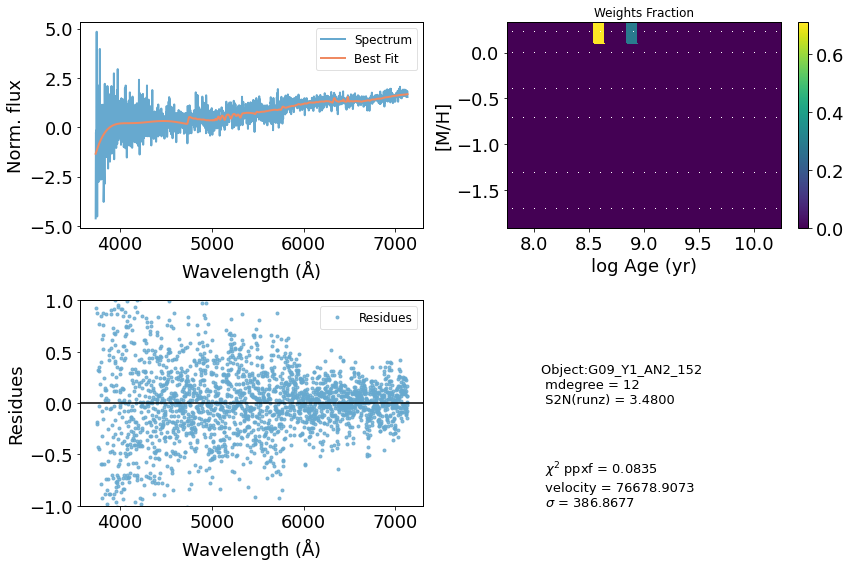

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51221       450     0.002     0.000
 comp.  1:     50957      1000
 comp.  2:     51720       187
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01392
method = capfit; Jac calls: 12; Func calls: 272; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      10.08       8.9   50957  1000
Comp:  2       Unknown          0       6.1   51720   187
Comp:  2       Unknown      2.018       6.2   51720   187
Comp:  2       Unknown     0.5955       2.8   51720   187
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.172
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.172
M/L_r: 3.161
Current $\chi^2$: 0.0139
Elapsed time in PPXF: 1.07 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


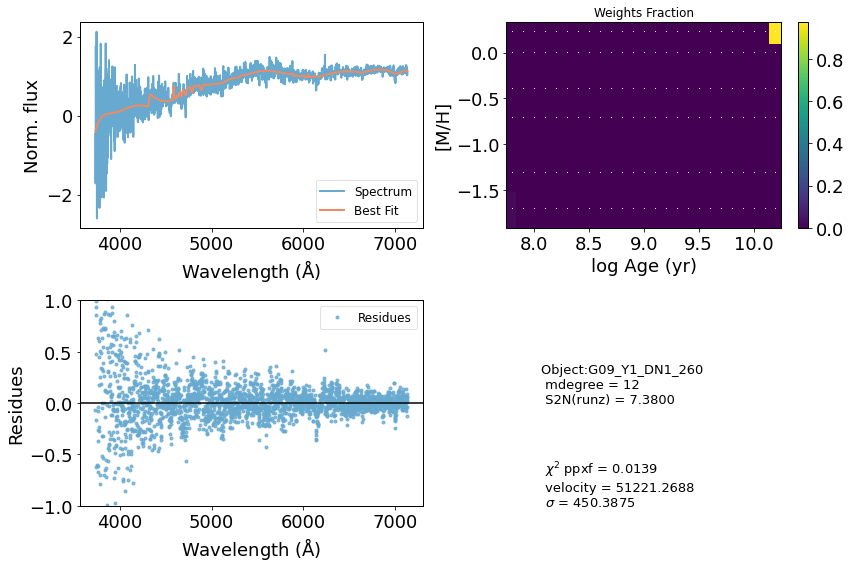

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54704       250    -0.005     0.004
 comp.  1:     54571       814
 comp.  2:     54957         6
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01333
method = capfit; Jac calls: 8; Func calls: 182; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      14.98        11   54571   814
Comp:  2       Unknown          0         2   54957     6
Comp:  2       Unknown     0.6598       2.1   54957     6
Comp:  2       Unknown     0.1744       1.6   54957     6
---------------------------------------------------------
Weighted <logAge> [yr]: 8.24
Weighted <[M/H]>: -0.31
Weighted <logAge> [yr]: 8.24
Weighted <[M/H]>: -0.31
M/L_r: 0.2487
Current $\chi^2$: 0.0133
Elapsed time in PPXF: 0.63 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


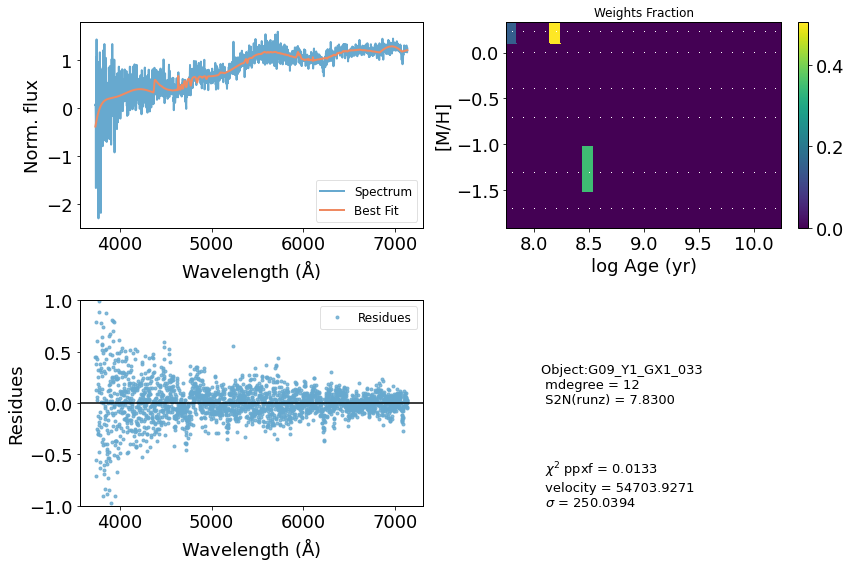

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53260       415    -0.034    -0.067
 comp.  1:     53296       669
 comp.  2:     53675       188
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004413
method = capfit; Jac calls: 8; Func calls: 184; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      8.785       9.8   53296   669
Comp:  2       Unknown          0       4.3   53675   188
Comp:  2       Unknown          0       4.3   53675   188
Comp:  2       Unknown     0.2878       2.9   53675   188
---------------------------------------------------------
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.21
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.21
M/L_r: 3.36
Current $\chi^2$: 0.0044
Elapsed time in PPXF: 0.68 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


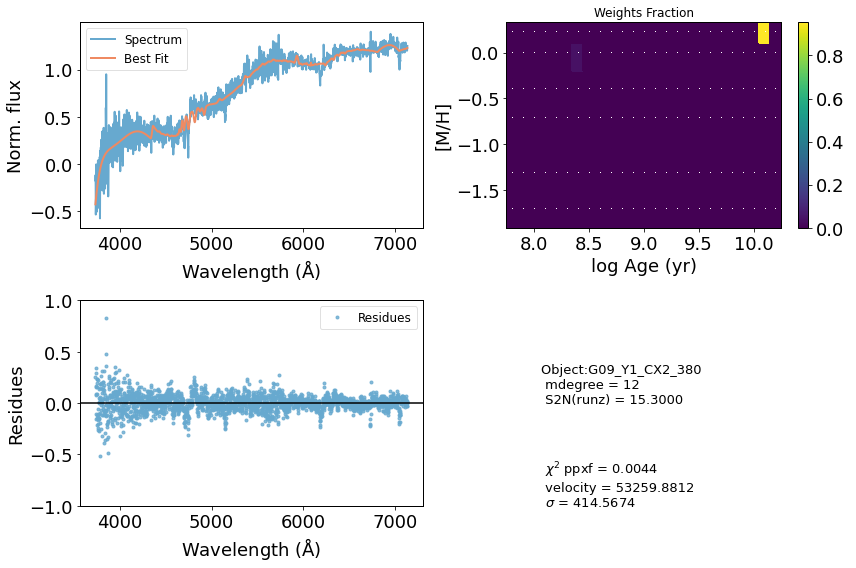

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56140       612    -0.001     0.085
 comp.  1:     56533      1000
 comp.  2:     56819       187
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006462
method = capfit; Jac calls: 9; Func calls: 206; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      16.56        12   56533  1000
Comp:  2       Unknown          0       4.8   56819   187
Comp:  2       Unknown     0.3838       4.8   56819   187
Comp:  2       Unknown    0.01719       2.9   56819   187
---------------------------------------------------------
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.22
M/L_r: 3.733
Current $\chi^2$: 0.0065
Elapsed time in PPXF: 0.77 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


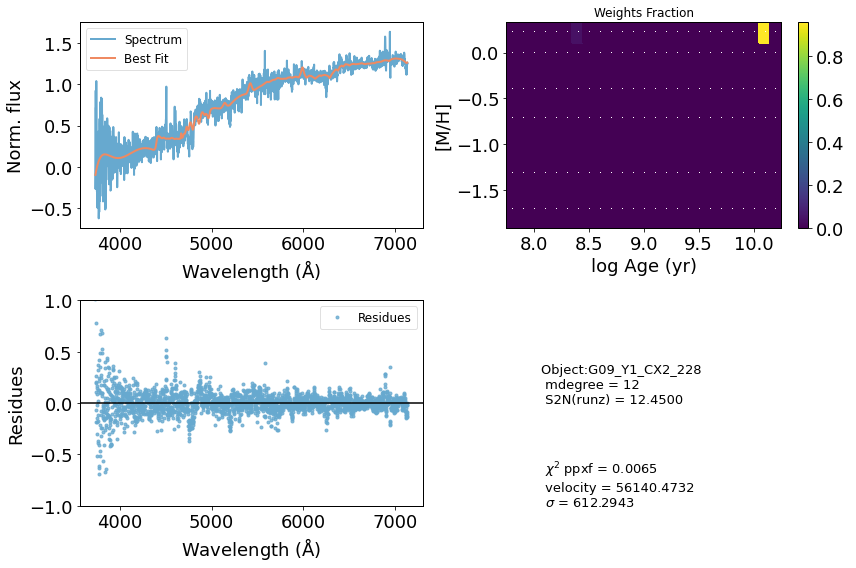

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     75272      1000     0.041     0.039
 comp.  1:     75147       624
 comp.  2:     75173        58
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.04069
method = capfit; Jac calls: 18; Func calls: 405; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      7.017       8.5   75147   624
Comp:  2       Unknown     0.1402       2.1   75173    58
Comp:  2       Unknown     0.8125       2.1   75173    58
Comp:  2       Unknown     0.4807       1.4   75173    58
---------------------------------------------------------
Weighted <logAge> [yr]: 9.18
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 9.18
Weighted <[M/H]>: 0.22


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


M/L_r: 1.091
Current $\chi^2$: 0.0407
Elapsed time in PPXF: 1.49 [min]


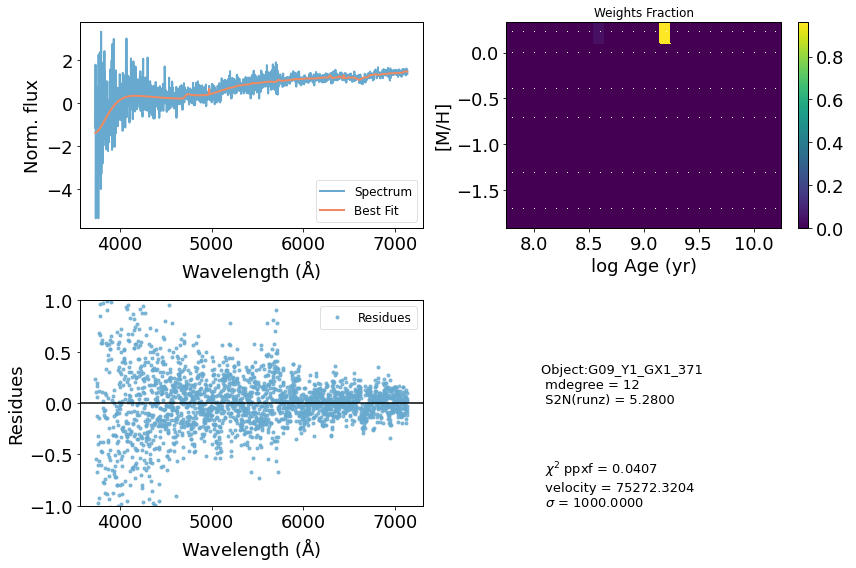

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[SII]6716' '[SII]6731' '[OIII]5007_d'
 '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     18119       294     0.000    -0.003
 comp.  1:     20243       174
 comp.  2:     20414        68
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004427
method = capfit; Jac calls: 70; Func calls: 1555; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 158
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9469       4.5   20243   174
Comp:  2       Unknown          0       7.2   20414    68
Comp:  2       Unknown    0.06022       7.2   20414    68
Comp:  2       Unknown          0       1.4   20414    68
Comp:  2       Unknown     0.1955       1.4   20414    68
Comp:  2       Unknown          0       2.3   20414    68
Comp:  2       Unknown          0       1.7   20414    68
Comp:  2       Unknown    0.04267       1.9   20414    68
---------------------------------

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


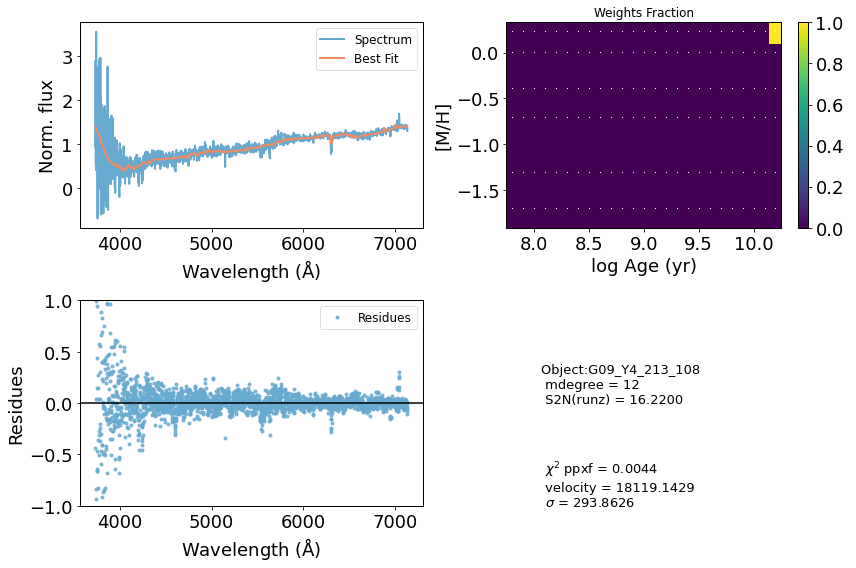

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47861       970     0.147     0.171
 comp.  1:     47662      1000
 comp.  2:     45680      1000
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004776
method = capfit; Jac calls: 18; Func calls: 404; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      19.59        16   47662  1000
Comp:  2       Unknown          0        40   45680  1000
Comp:  2       Unknown          0        40   45680  1000
Comp:  2       Unknown      1.224       7.7   45680  1000
Comp:  2       Unknown      3.093       9.7   45680  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.165
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.165
M/L_r: 3.527
Current $\chi^2$: 0.0048
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


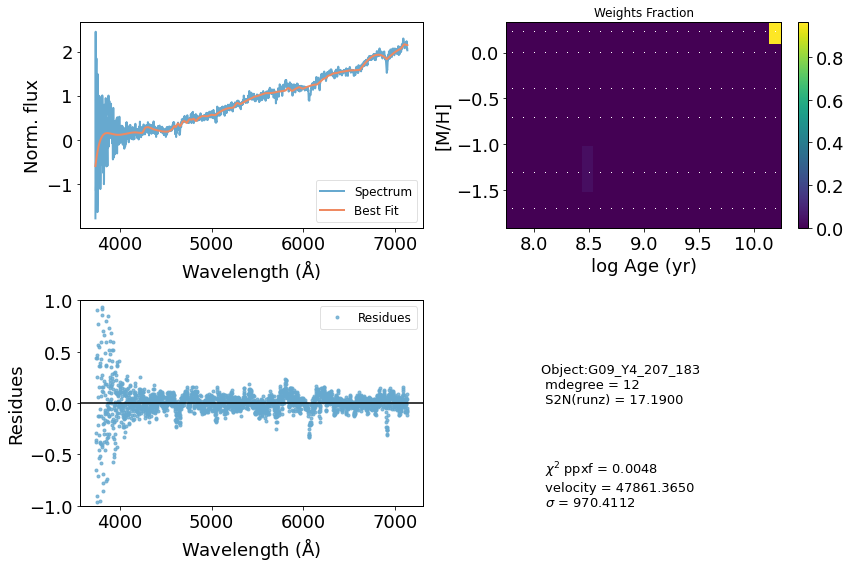

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39515      1000     0.099     0.071
 comp.  1:     38512       180
 comp.  2:     38750       390
Gas Reddening E(B-V): 0.054
chi2/DOF: 0.00663
method = capfit; Jac calls: 21; Func calls: 475; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.3   38512   180
Comp:  2       Unknown          0        22   38750   390
Comp:  2       Unknown          0        22   38750   390
Comp:  2       Unknown          0       5.5   38750   390
Comp:  2       Unknown     0.5163       3.7   38750   390
---------------------------------------------------------
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.148
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.148
M/L_r: 2.425
Current $\chi^2$: 0.0066
Elapsed time

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


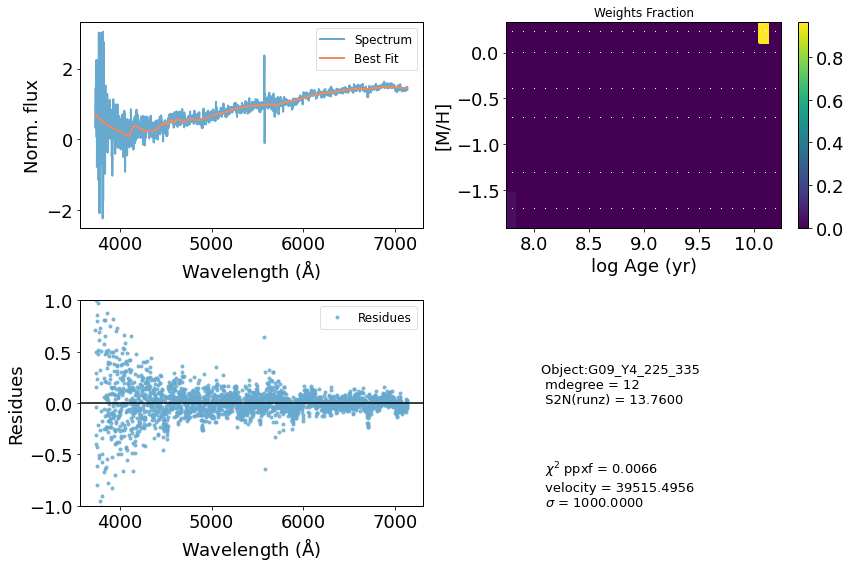

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44553      1000     0.012     0.001
 comp.  1:     44084      1000
 comp.  2:     43457       384
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.03076
method = capfit; Jac calls: 33; Func calls: 736; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      8.227       8.5   44084  1000
Comp:  2       Unknown          0        17   43457   384
Comp:  2       Unknown          0        17   43457   384
Comp:  2       Unknown          0       4.3   43457   384
Comp:  2       Unknown     0.6585       2.6   43457   384
---------------------------------------------------------
Weighted <logAge> [yr]: 8.32
Weighted <[M/H]>: -1.37
Weighted <logAge> [yr]: 8.32
Weighted <[M/H]>: -1.37
M/L_r: 0.2005
Current $\chi^2$: 0.0308
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


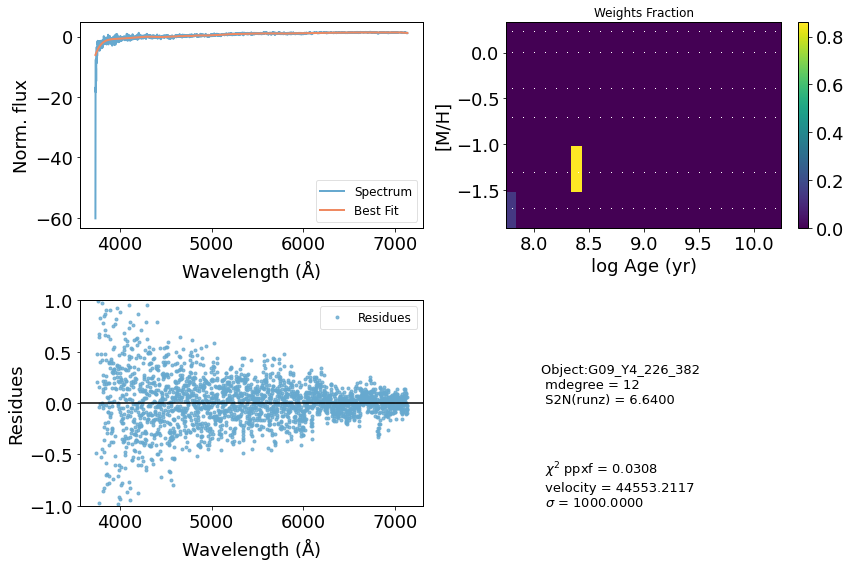

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59977      1000    -0.012    -0.007
 comp.  1:     60625      1000
 comp.  2:     61306       432
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.02012
method = capfit; Jac calls: 22; Func calls: 492; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      10.58       9.8   60625  1000
Comp:  2       Unknown          0        16   61306   432
Comp:  2       Unknown      2.371        16   61306   432
Comp:  2       Unknown    0.04034       3.6   61306   432
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
M/L_r: 6.858
Current $\chi^2$: 0.0201
Elapsed time in PPXF: 1.85 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


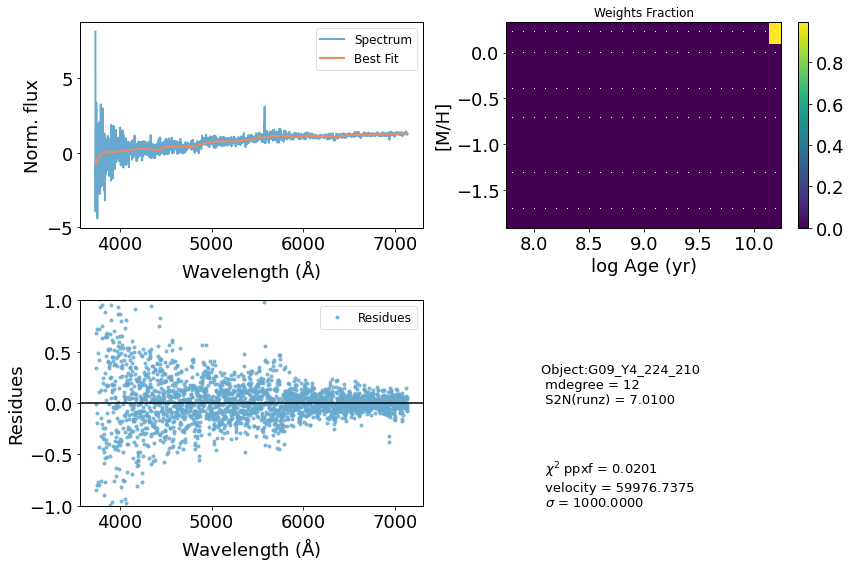

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43939      1000     0.148    -0.069
 comp.  1:     43991      1000
 comp.  2:     42651       154
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005383
method = capfit; Jac calls: 23; Func calls: 512; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      11.17       8.5   43991  1000
Comp:  2       Unknown          0       5.2   42651   154
Comp:  2       Unknown          0       5.2   42651   154
Comp:  2       Unknown     0.3203       3.1   42651   154
Comp:  2       Unknown     0.1383       1.9   42651   154
---------------------------------------------------------
Weighted <logAge> [yr]: 8.01
Weighted <[M/H]>: -1.57
Weighted <logAge> [yr]: 8.01
Weighted <[M/H]>: -1.57
M/L_r: 0.1754
Current $\chi^2$: 0.0054
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


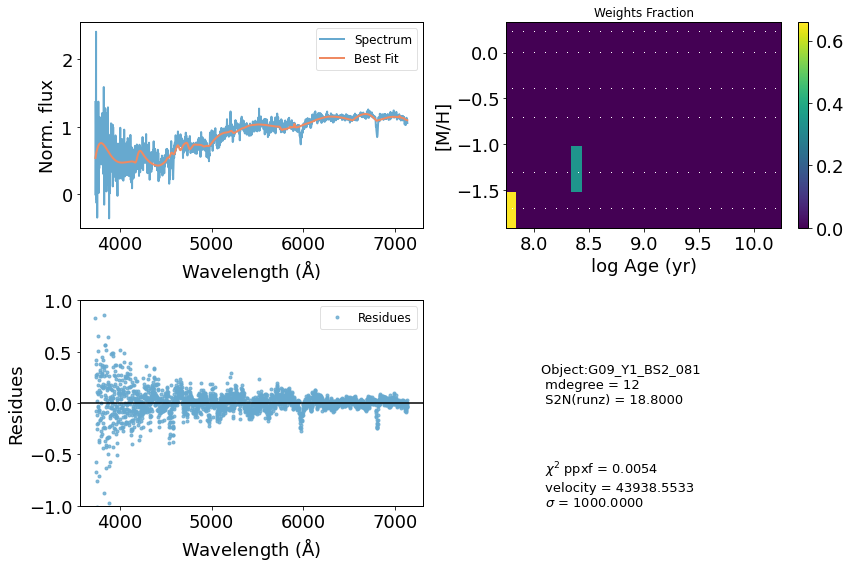

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47353       487    -0.000     0.001
 comp.  1:     47843      1000
 comp.  2:     46803       907
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.008708
method = capfit; Jac calls: 13; Func calls: 293; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.473       9.5   47843  1000
Comp:  2       Unknown          0        49   46803   907
Comp:  2       Unknown          0        49   46803   907
Comp:  2       Unknown      2.841       6.7   46803   907
Comp:  2       Unknown     0.5112       4.6   46803   907
---------------------------------------------------------
Weighted <logAge> [yr]: 8.3
Weighted <[M/H]>: -1.38
Weighted <logAge> [yr]: 8.3
Weighted <[M/H]>: -1.38
M/L_r: 0.199
Current $\chi^2$: 0.0087
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


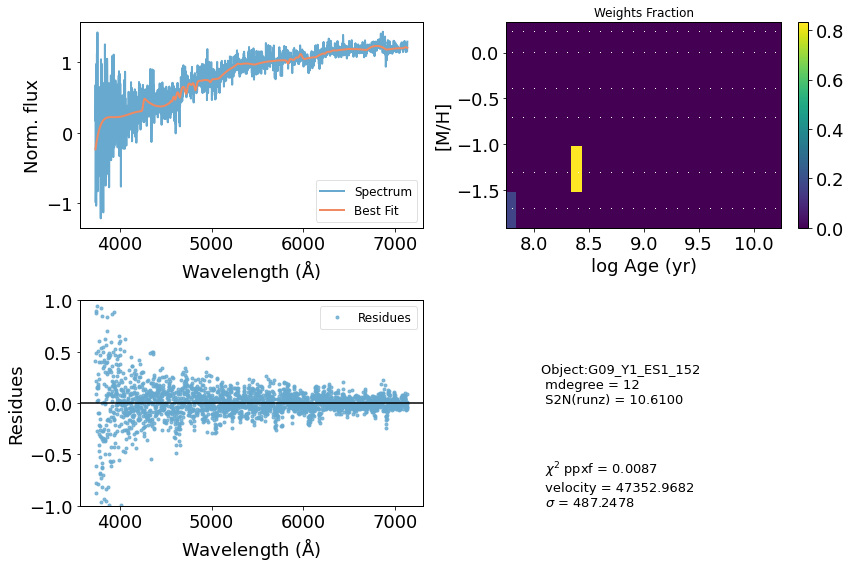

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     68244       350     0.001    -0.002
 comp.  1:     69114       158
 comp.  2:     69082       115
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.009771
method = capfit; Jac calls: 25; Func calls: 559; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7073       4.1   69114   158
Comp:  2       Unknown     0.5052       3.2   69082   115
Comp:  2       Unknown          0       3.1   69082   115
Comp:  2       Unknown     0.4499         2   69082   115
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.219
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.219
M/L_r: 4.314
Current $\chi^2$: 0.0098
Elapsed time in PPXF: 1.93 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


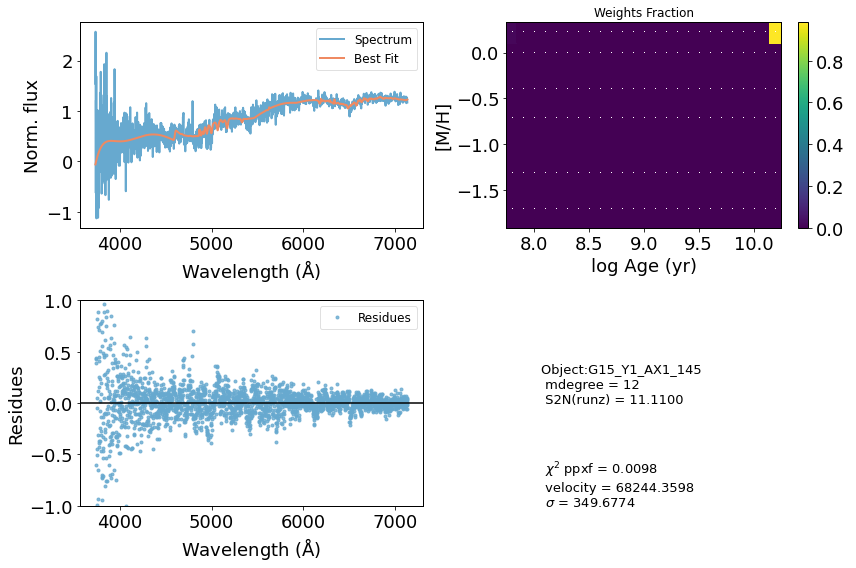

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[SII]6716' '[SII]6731' '[OIII]5007_d'
 '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     25776       276    -0.001     0.002
 comp.  1:     25620       595
 comp.  2:     25945       213
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005251
method = capfit; Jac calls: 18; Func calls: 402; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  9 / 158
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.625       7.5   25620   595
Comp:  2       Unknown      1.155       8.4   25945   213
Comp:  2       Unknown     0.3825       8.4   25945   213
Comp:  2       Unknown          0       2.2   25945   213
Comp:  2       Unknown     0.1751       2.1   25945   213
Comp:  2       Unknown     0.8456       4.8   25945   213
Comp:  2       Unknown     0.3215       2.6   25945   213
Comp:  2       Unknown          0       2.8   25945   213
-----------------------------------

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


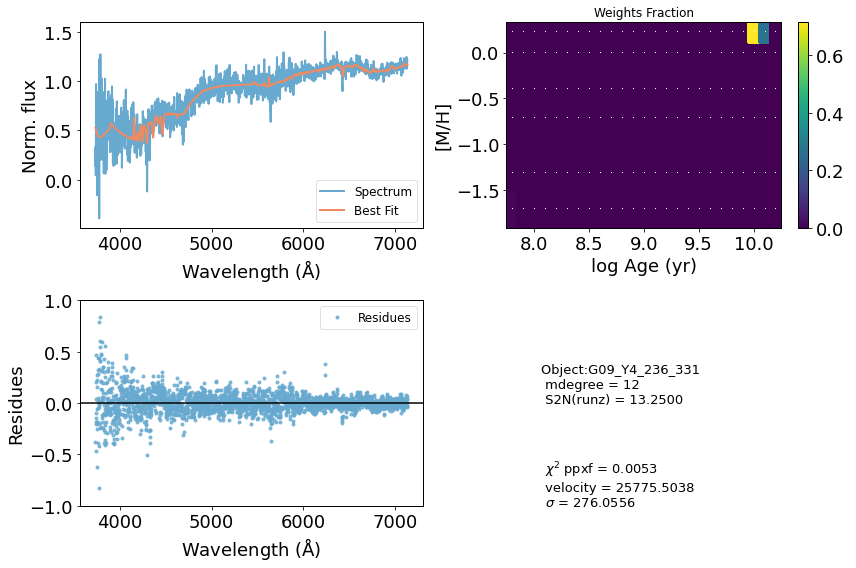

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     70763       802    -0.045    -0.100
 comp.  1:     70762      1000
 comp.  2:     71889      1000
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01054
method = capfit; Jac calls: 22; Func calls: 495; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       75.3        10   70762  1000
Comp:  2       Unknown          0        43   71889  1000
Comp:  2       Unknown      3.532        43   71889  1000
Comp:  2       Unknown      7.333       6.3   71889  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 7.82
Weighted <[M/H]>: -0.123
Weighted <logAge> [yr]: 7.82
Weighted <[M/H]>: -0.123
M/L_r: 0.1591
Current $\chi^2$: 0.0105
Elapsed time in PPXF: 1.84 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


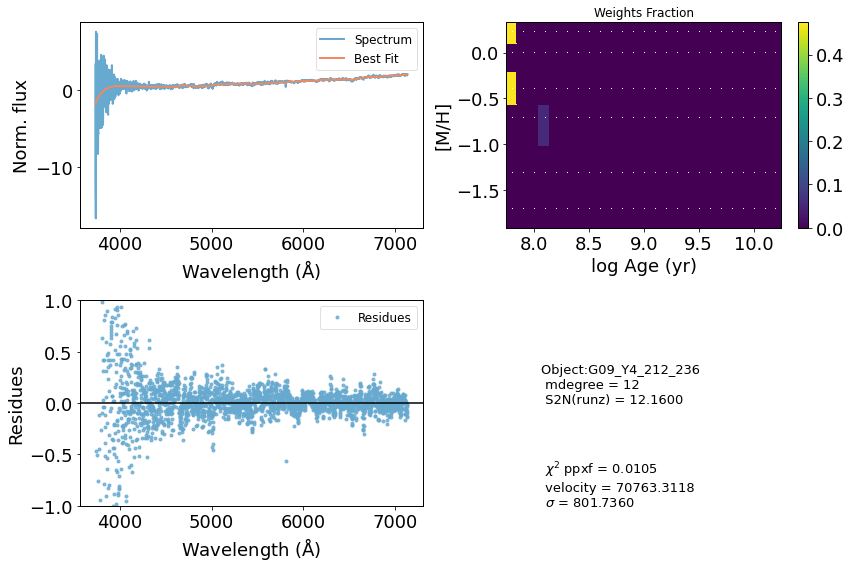

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53133       638     0.009     0.040
 comp.  1:     53270      1000
 comp.  2:     53685       301
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01109
method = capfit; Jac calls: 13; Func calls: 293; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      14.96       9.4   53270  1000
Comp:  2       Unknown          0        10   53685   301
Comp:  2       Unknown     0.4082        10   53685   301
Comp:  2       Unknown          0         3   53685   301
---------------------------------------------------------
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.0833
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.0833
M/L_r: 1.942
Current $\chi^2$: 0.0111
Elapsed time in PPXF: 0.94 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


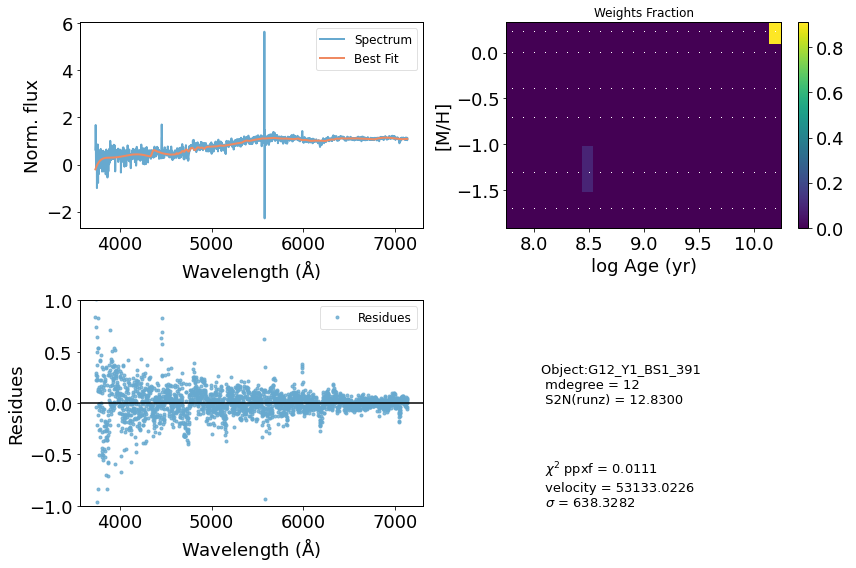

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     42806       717    -0.000     0.002
 comp.  1:     42859       313
 comp.  2:     42771       104
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.02192
method = capfit; Jac calls: 14; Func calls: 314; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.063       4.9   42859   313
Comp:  2       Unknown          0       4.9   42771   104
Comp:  2       Unknown     0.9628         5   42771   104
Comp:  2       Unknown     0.7061       2.5   42771   104
Comp:  2       Unknown     0.2111       1.6   42771   104
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
M/L_r: 3.751
Current $\chi^2$: 0.0219
Elapsed ti

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


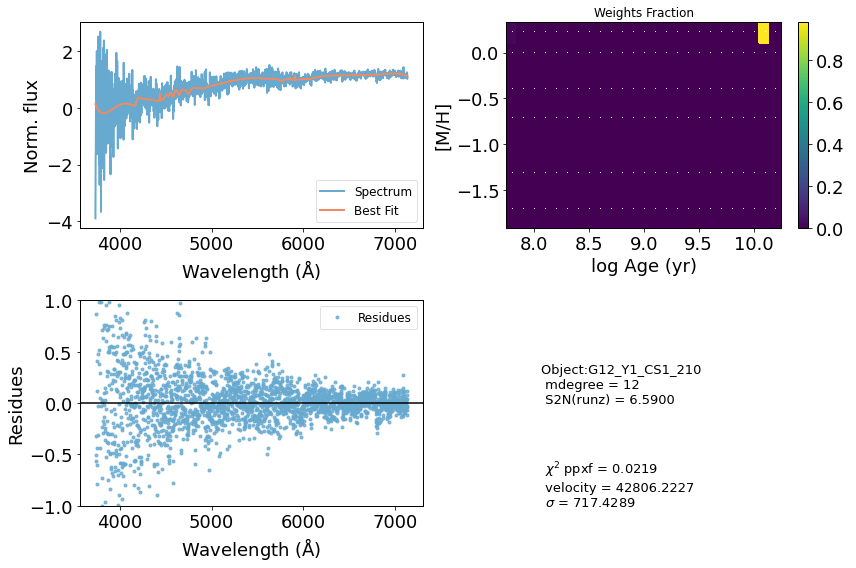

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     30884       665     0.014     0.013
 comp.  1:     30424       180
 comp.  2:     30346        71
Gas Reddening E(B-V): 5.033
chi2/DOF: 0.01381
method = capfit; Jac calls: 6; Func calls: 141; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  1 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       1.4   30424   180
Comp:  2       Unknown          0       4.3   30346    71
Comp:  2       Unknown     0.5823       4.5   30346    71
Comp:  2       Unknown          0         3   30346    71
Comp:  2       Unknown     0.2606       1.4   30346    71
Comp:  2       Unknown       0.25       1.1   30346    71
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M/H

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


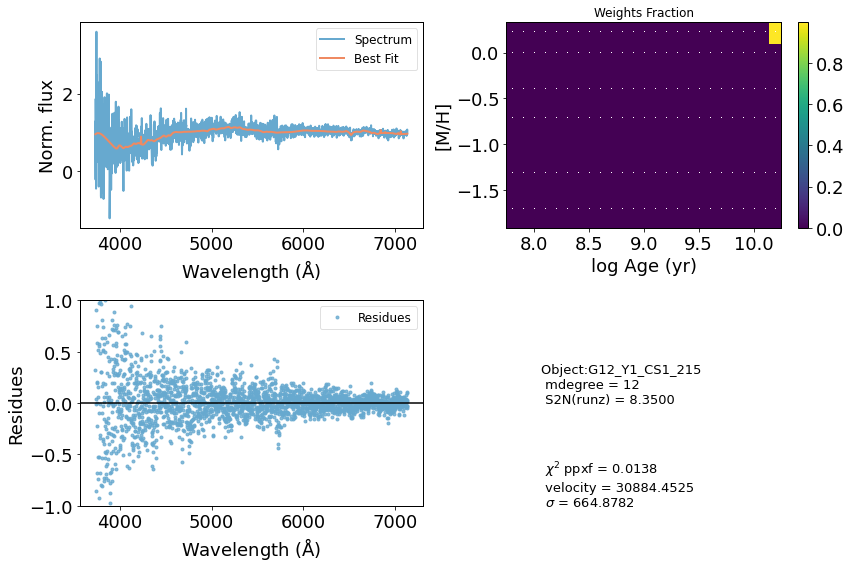

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     74679       748    -0.007     0.143
 comp.  1:     75145       956
 comp.  2:     75272       180
Gas Reddening E(B-V): 1.799
chi2/DOF: 0.008713
method = capfit; Jac calls: 8; Func calls: 186; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      19.16       8.7   75145   956
Comp:  2       Unknown          0       4.3   75272   180
Comp:  2       Unknown    0.04818       4.3   75272   180
Comp:  2       Unknown          0       2.6   75272   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.28
Weighted <[M/H]>: -0.213
Weighted <logAge> [yr]: 8.28
Weighted <[M/H]>: -0.213
M/L_r: 0.2775
Current $\chi^2$: 0.0087
Elapsed time in PPXF: 0.55 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


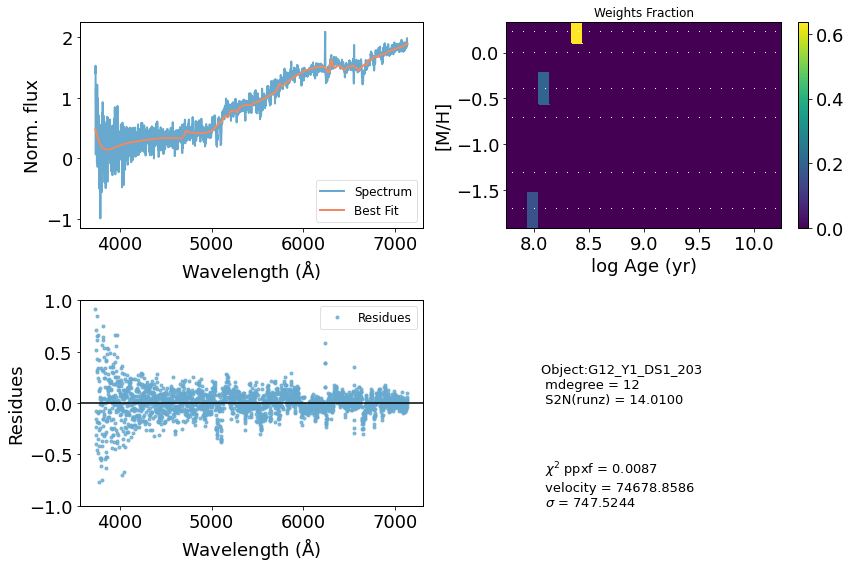

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     58462       517     0.003    -0.005
 comp.  1:     58696      1000
 comp.  2:     59084       160
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01555
method = capfit; Jac calls: 15; Func calls: 335; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  7 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      22.96        11   58696  1000
Comp:  2       Unknown     0.7452       4.2   59084   160
Comp:  2       Unknown          0       4.1   59084   160
Comp:  2       Unknown     0.5666       2.8   59084   160
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.162
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.162
M/L_r: 3
Current $\chi^2$: 0.0156
Elapsed time in PPXF: 1.06 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


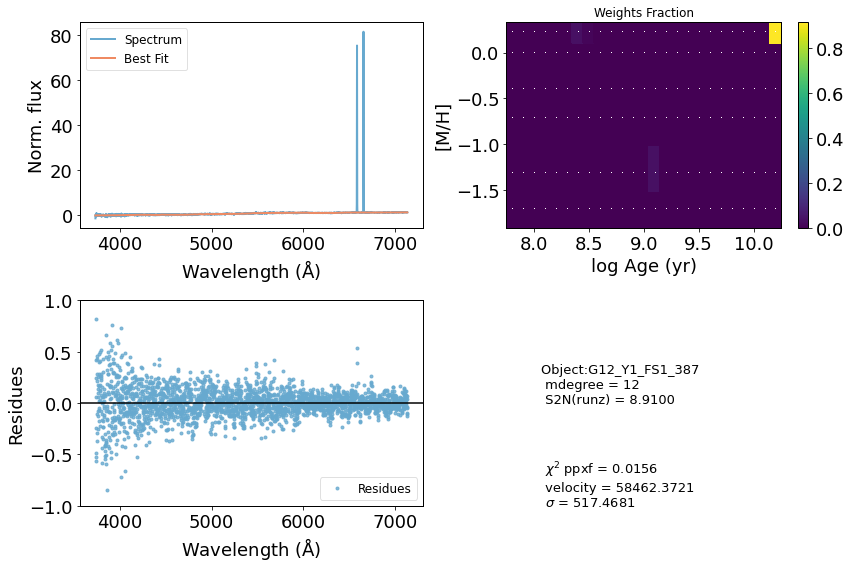

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46273      1000     0.165     0.097
 comp.  1:     46055       615
 comp.  2:     45998       148
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01047
method = capfit; Jac calls: 26; Func calls: 583; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.072       6.5   46055   615
Comp:  2       Unknown       1.49       5.3   45998   148
Comp:  2       Unknown          0       5.1   45998   148
Comp:  2       Unknown      1.288       2.9   45998   148
Comp:  2       Unknown     0.2884       1.9   45998   148
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.142
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.142
M/L_r: 2.401
Current $\chi^2$: 0.0105
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


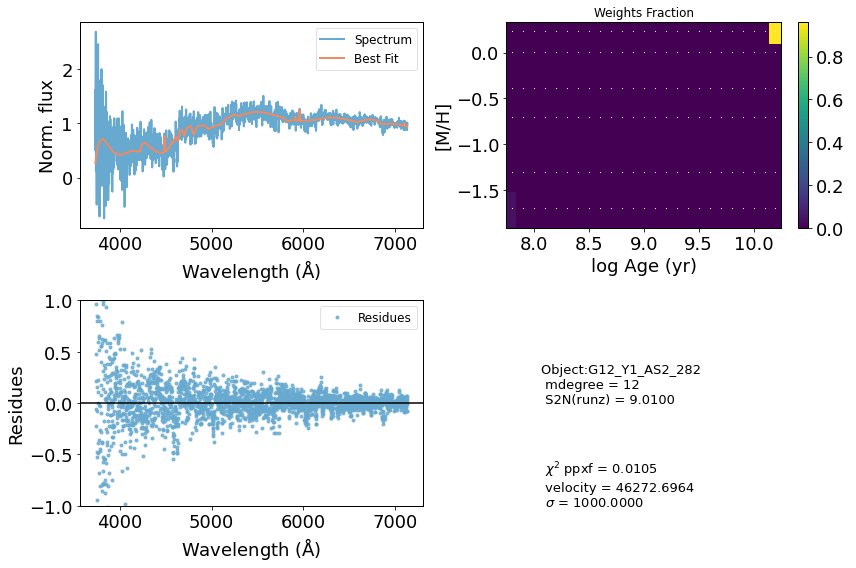

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53815       560    -0.007     0.034
 comp.  1:     53935      1000
 comp.  2:     54265       186
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006498
method = capfit; Jac calls: 12; Func calls: 273; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  7 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      11.32        12   53935  1000
Comp:  2       Unknown    0.03904       5.9   54265   186
Comp:  2       Unknown     0.5286       5.9   54265   186
Comp:  2       Unknown     0.4265       2.8   54265   186
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: 0.0151
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: 0.0151
M/L_r: 1.029
Current $\chi^2$: 0.0065
Elapsed time in PPXF: 0.84 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


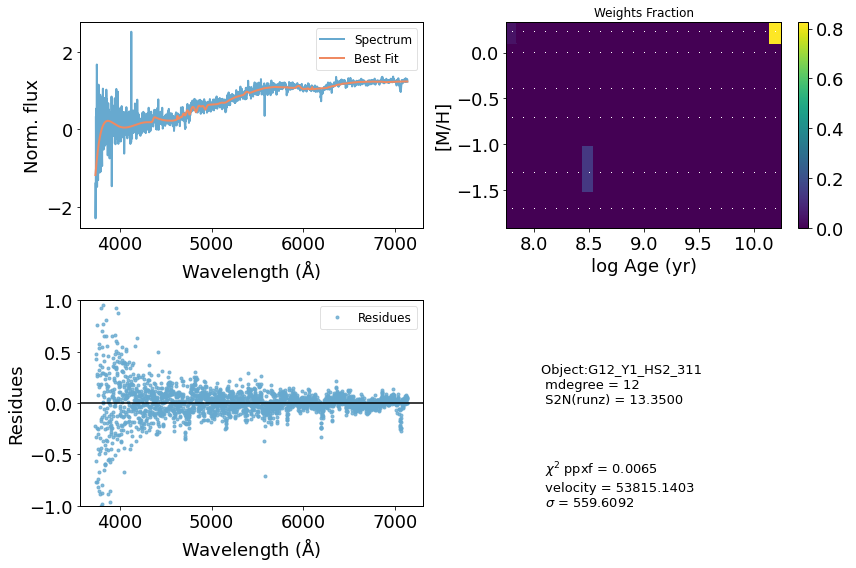

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37221       393    -0.066    -0.018
 comp.  1:     38794       950
 comp.  2:     39067         1
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005609
method = capfit; Jac calls: 12; Func calls: 275; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.957         9   38794   950
Comp:  2       Unknown          0       2.5   39067     1
Comp:  2       Unknown          0       2.6   39067     1
Comp:  2       Unknown    0.09995         2   39067     1
Comp:  2       Unknown     0.1341       1.2   39067     1
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
M/L_r: 6.703
Current $\chi^2$: 0.0056
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


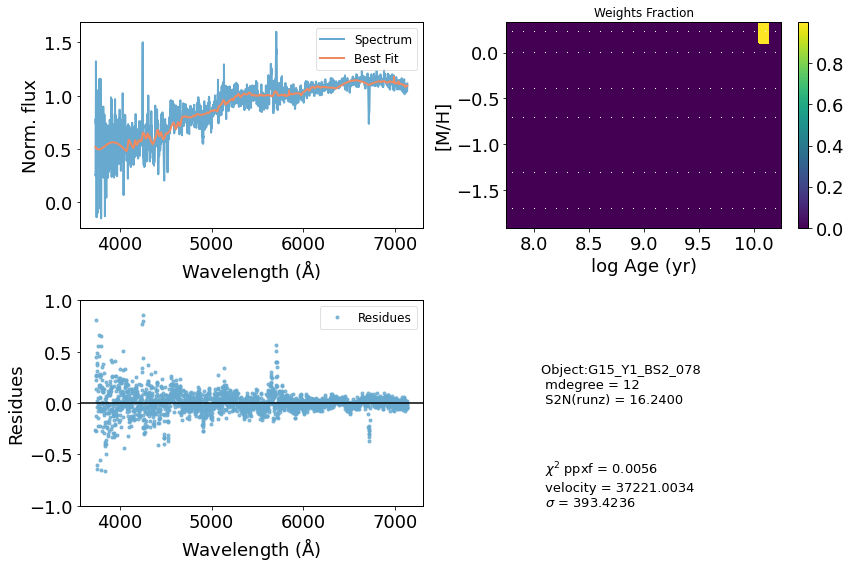

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     52250       679    -0.013    -0.026
 comp.  1:     52470      1000
 comp.  2:     53599       863
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01106
method = capfit; Jac calls: 15; Func calls: 339; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      14.88       7.1   52470  1000
Comp:  2       Unknown          0        57   53599   863
Comp:  2       Unknown          0        57   53599   863
Comp:  2       Unknown      2.312       5.2   53599   863
---------------------------------------------------------
Weighted <logAge> [yr]: 9.91
Weighted <[M/H]>: 0.123
Weighted <logAge> [yr]: 9.91
Weighted <[M/H]>: 0.123
M/L_r: 2.251
Current $\chi^2$: 0.0111
Elapsed time in PPXF: 1.18 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


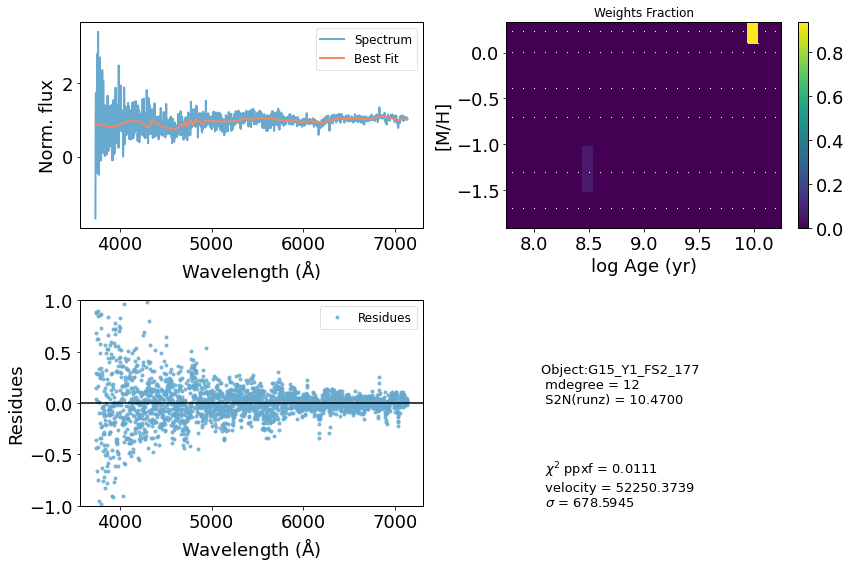

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51303       315    -0.009    -0.007
 comp.  1:     51653       180
 comp.  2:     51600       172
Gas Reddening E(B-V): 10.000
chi2/DOF: 0.02494
method = capfit; Jac calls: 13; Func calls: 292; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       1.4   51653   180
Comp:  2       Unknown     0.2655       6.9   51600   172
Comp:  2       Unknown      1.645       6.8   51600   172
Comp:  2       Unknown     0.9872       2.3   51600   172
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.207
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.207
M/L_r: 5.606
Current $\chi^2$: 0.0249
Elapsed time in PPXF: 0.98 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


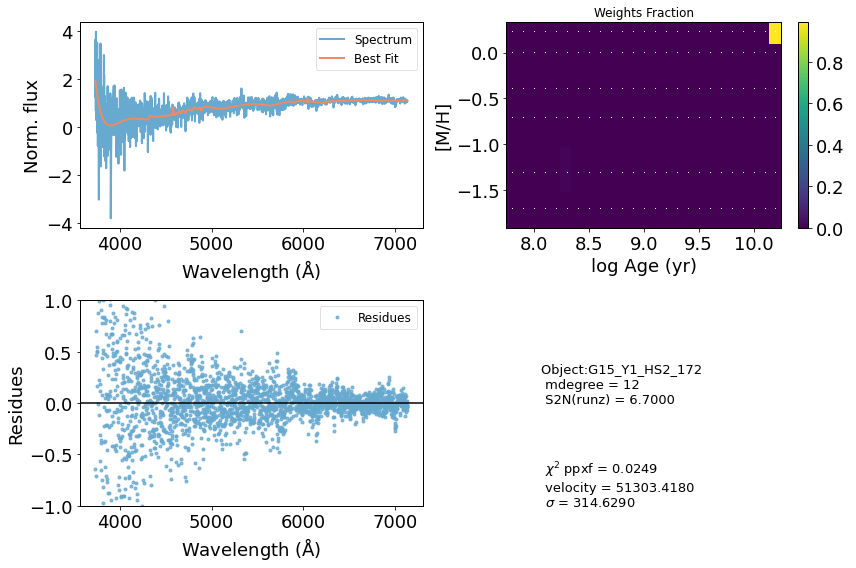

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45429       288     0.018    -0.025
 comp.  1:     45560       404
 comp.  2:     45766        98
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.009681
method = capfit; Jac calls: 9; Func calls: 206; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       3.05       4.2   45560   404
Comp:  2       Unknown          0       5.7   45766    98
Comp:  2       Unknown       1.62         6   45766    98
Comp:  2       Unknown     0.2518       2.2   45766    98
Comp:  2       Unknown    0.05084       1.2   45766    98
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.209
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.209
M/L_r: 5.85
Current $\chi^2$: 0.0097
Elapsed t

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


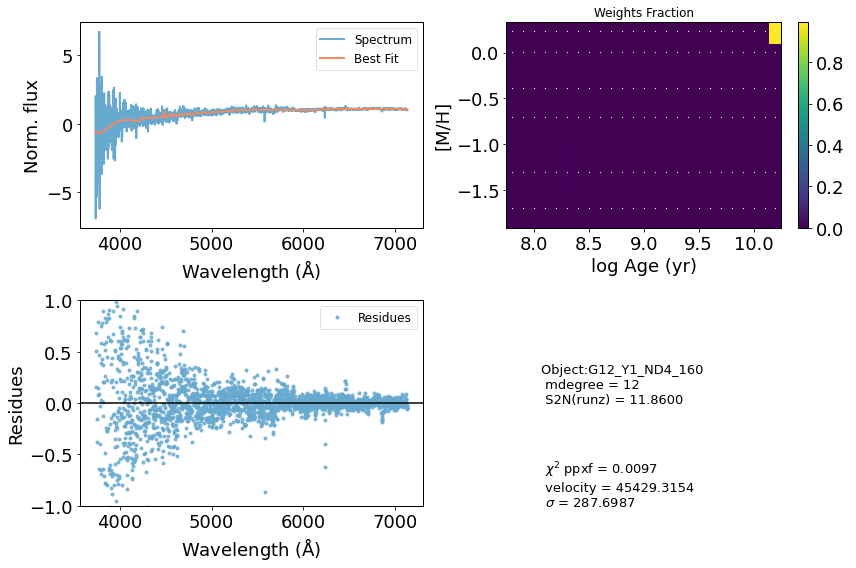

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50049      1000     0.185    -0.033
 comp.  1:     49395       429
 comp.  2:     49203       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01025
method = capfit; Jac calls: 16; Func calls: 357; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.987       5.7   49395   429
Comp:  2       Unknown          0       5.7   49203   180
Comp:  2       Unknown          0       5.7   49203   180
Comp:  2       Unknown          0       2.7   49203   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.5
Weighted <[M/H]>: -1.31
Weighted <logAge> [yr]: 8.5
Weighted <[M/H]>: -1.31
M/L_r: 0.2456
Current $\chi^2$: 0.0103
Elapsed time in PPXF: 1.04 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


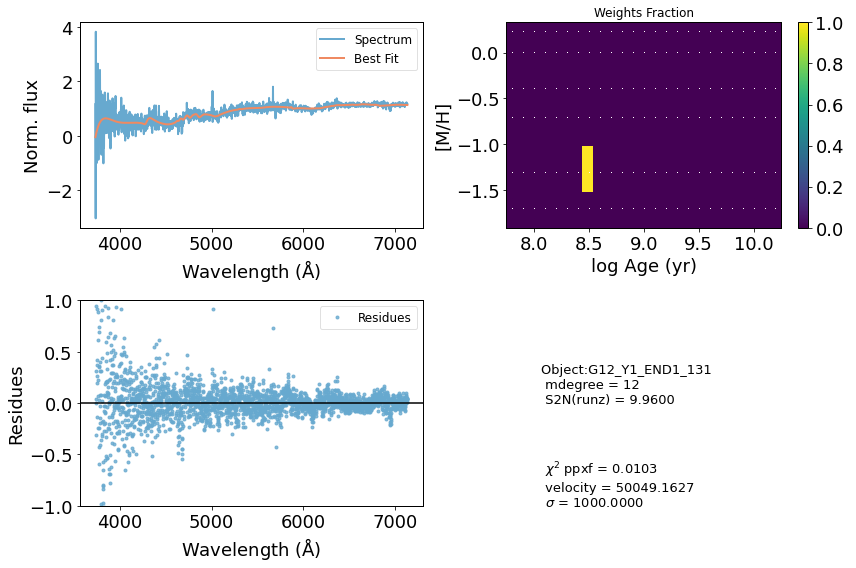

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54833       495    -0.049     0.018
 comp.  1:     54944       876
 comp.  2:     55534       136
Gas Reddening E(B-V): 0.173
chi2/DOF: 0.01134
method = capfit; Jac calls: 13; Func calls: 294; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       18.5       9.8   54944   876
Comp:  2       Unknown          0       3.9   55534   136
Comp:  2       Unknown     0.2187       3.9   55534   136
Comp:  2       Unknown     0.0314       2.1   55534   136
---------------------------------------------------------
Weighted <logAge> [yr]: 9.98
Weighted <[M/H]>: 0.193
Weighted <logAge> [yr]: 9.98
Weighted <[M/H]>: 0.193
M/L_r: 2.594
Current $\chi^2$: 0.0113
Elapsed time in PPXF: 1.02 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


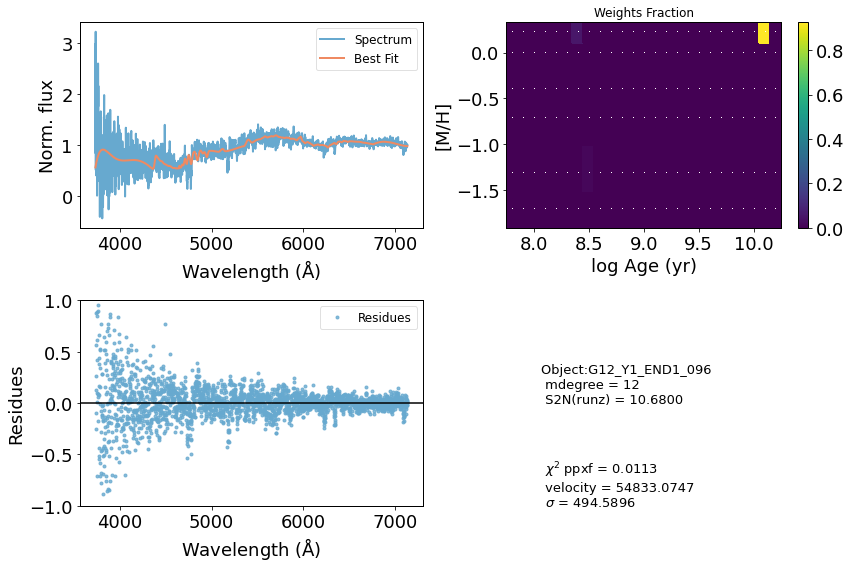

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54571       505    -0.005    -0.003
 comp.  1:     54620       995
 comp.  2:     54960       158
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006704
method = capfit; Jac calls: 11; Func calls: 250; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      24.42        12   54620   995
Comp:  2       Unknown          0       3.7   54960   158
Comp:  2       Unknown    0.09991       3.7   54960   158
Comp:  2       Unknown          0       2.7   54960   158
---------------------------------------------------------
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: 0.00234
Weighted <logAge> [yr]: 9.86
Weighted <[M/H]>: 0.00234
M/L_r: 1.279
Current $\chi^2$: 0.0067
Elapsed time in PPXF: 0.84 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


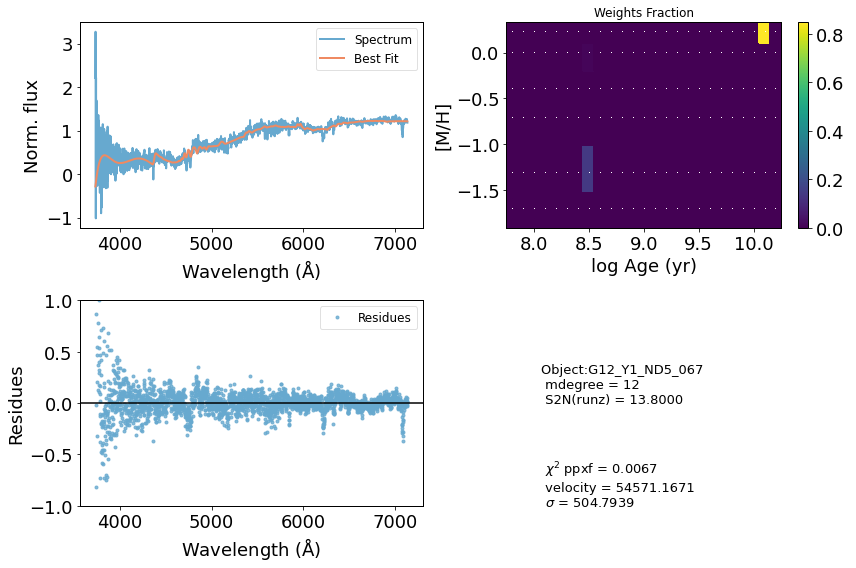

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41673       180     0.000     0.000
 comp.  1:     41673       180
 comp.  2:     41673       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.00934
method = capfit; Jac calls: 1; Func calls: 30; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8396       3.1   41673   180
Comp:  2       Unknown          0        10   41673   180
Comp:  2       Unknown      1.085        10   41673   180
Comp:  2       Unknown     0.4341       3.5   41673   180
Comp:  2       Unknown          0       1.7   41673   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
M/L_r: 8.088
Current $\chi^2$: 0.0093
Elapsed time

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


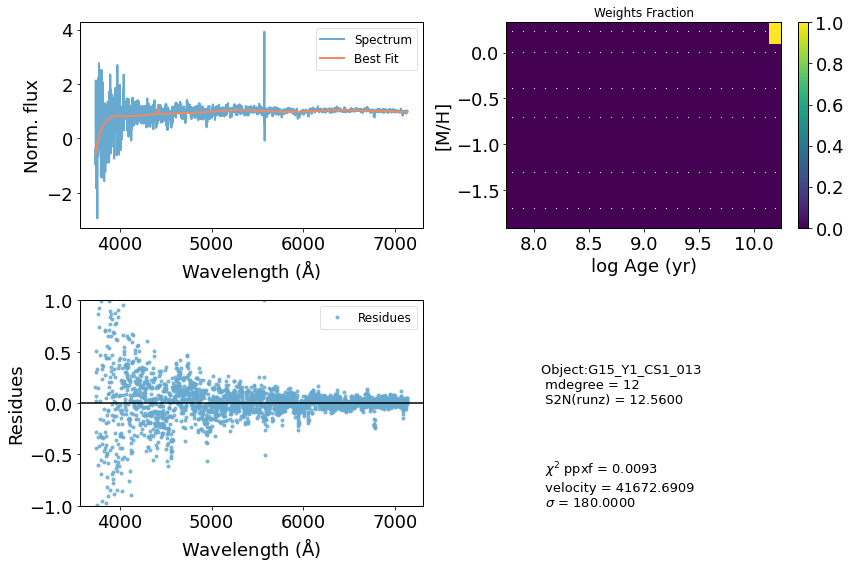

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     75339      1000     0.014    -0.021
 comp.  1:     74820        56
 comp.  2:     74456       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.0267
method = capfit; Jac calls: 14; Func calls: 314; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.315       2.8   74820    56
Comp:  2       Unknown          0       4.9   74456   180
Comp:  2       Unknown          0       4.9   74456   180
Comp:  2       Unknown          0         2   74456   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
M/L_r: 4.308
Current $\chi^2$: 0.0267
Elapsed time in PPXF: 0.96 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


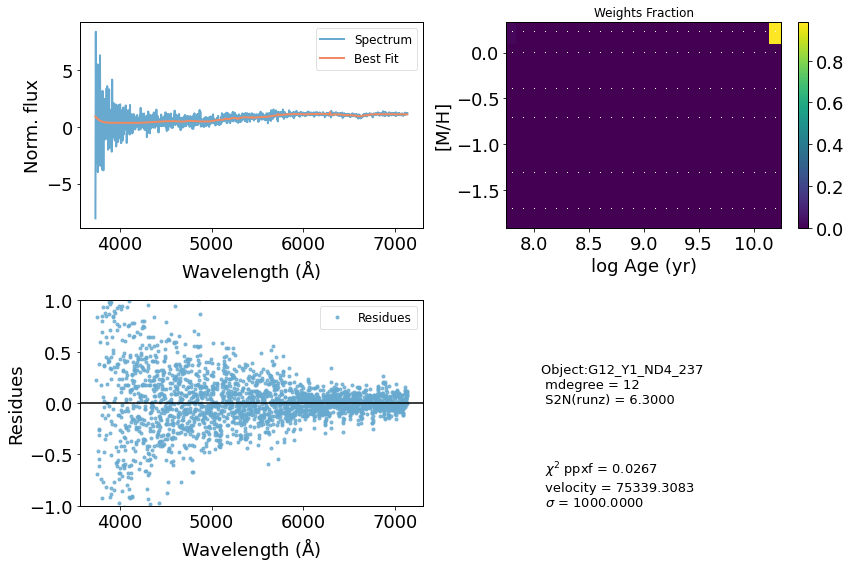

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59986      1000    -0.226     0.005
 comp.  1:     60775      1000
 comp.  2:     60539       268
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006641
method = capfit; Jac calls: 11; Func calls: 252; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      10.64        11   60775  1000
Comp:  2       Unknown    0.01623        10   60539   268
Comp:  2       Unknown     0.4181       9.9   60539   268
Comp:  2       Unknown     0.4686       3.2   60539   268
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
M/L_r: 6.695
Current $\chi^2$: 0.0066
Elapsed time in PPXF: 0.84 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


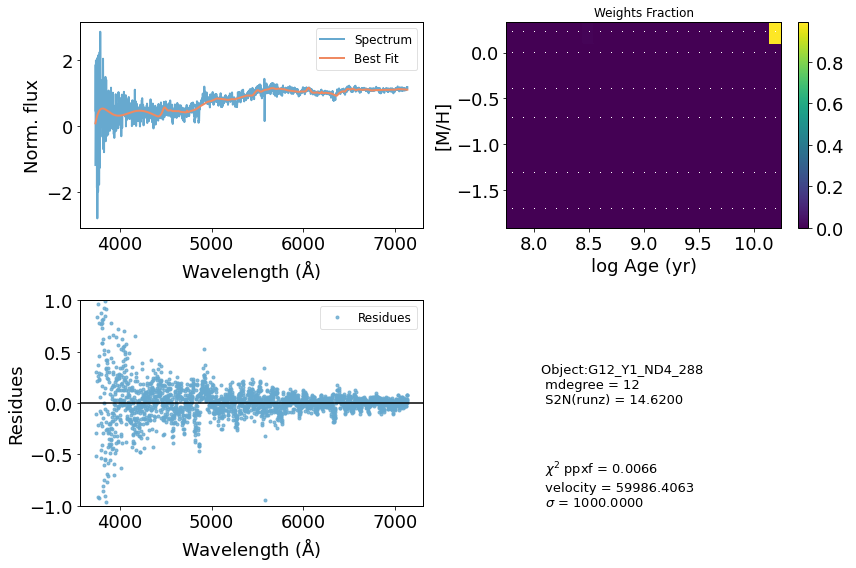

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50297        82    -0.006     0.001
 comp.  1:     50541       290
 comp.  2:     50300        81
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.0102
method = capfit; Jac calls: 6; Func calls: 140; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.791       6.1   50541   290
Comp:  2       Unknown          0       2.7   50300    81
Comp:  2       Unknown    0.06853       2.7   50300    81
Comp:  2       Unknown     0.1562       2.3   50300    81
---------------------------------------------------------
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: 0.0834
Weighted <logAge> [yr]: 9.89
Weighted <[M/H]>: 0.0834
M/L_r: 1.377
Current $\chi^2$: 0.0102
Elapsed time in PPXF: 0.41 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


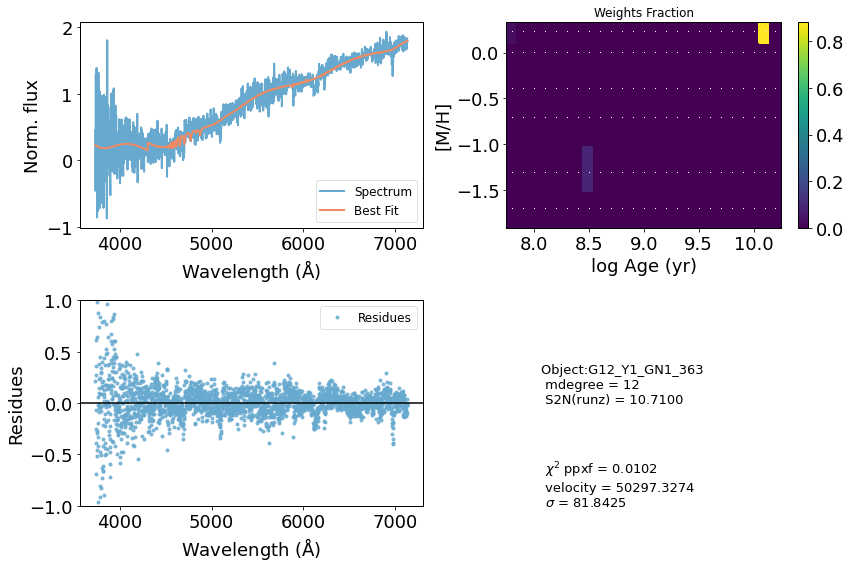

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50883        74     0.004    -0.001
 comp.  1:     50953       180
 comp.  2:     51035        68
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01426
method = capfit; Jac calls: 9; Func calls: 203; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  7 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0         4   50953   180
Comp:  2       Unknown     0.2703       2.8   51035    68
Comp:  2       Unknown          0       2.7   51035    68
Comp:  2       Unknown       0.17         2   51035    68
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: 0.0927
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: 0.0927
M/L_r: 2.556
Current $\chi^2$: 0.0143
Elapsed time in PPXF: 0.70 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


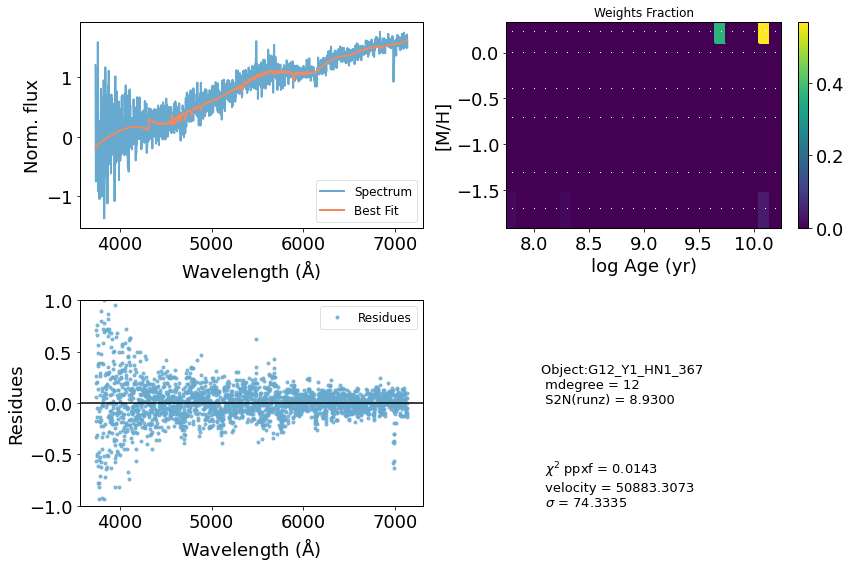

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     67594       493    -0.000     0.000
 comp.  1:     68588        43
 comp.  2:     68726        64
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01845
method = capfit; Jac calls: 14; Func calls: 318; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3656       2.6   68588    43
Comp:  2       Unknown     0.6532       2.4   68726    64
Comp:  2       Unknown          0       2.5   68726    64
Comp:  2       Unknown     0.1877       1.7   68726    64
---------------------------------------------------------
Weighted <logAge> [yr]: 9.24
Weighted <[M/H]>: -0.336
Weighted <logAge> [yr]: 9.24
Weighted <[M/H]>: -0.336
M/L_r: 0.7653
Current $\chi^2$: 0.0185
Elapsed time in PPXF: 1.08 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


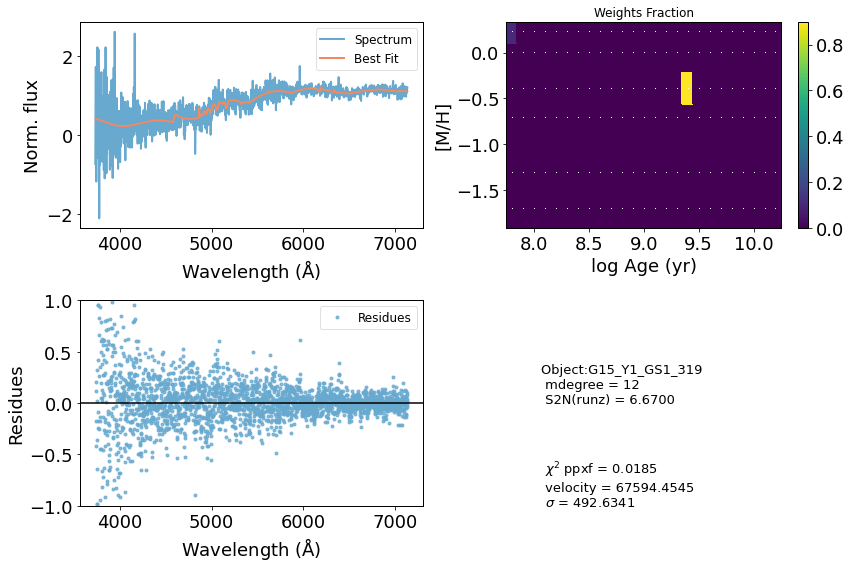

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     62282      1000    -0.043     0.016
 comp.  1:     62056      1000
 comp.  2:     65920       952
Gas Reddening E(B-V): 6.734
chi2/DOF: 0.06884
method = capfit; Jac calls: 36; Func calls: 803; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      12.71       4.5   62056  1000
Comp:  2       Unknown          0        51   65920   952
Comp:  2       Unknown      9.209        51   65920   952
Comp:  2       Unknown          0       4.7   65920   952
---------------------------------------------------------
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: -1.71
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: -1.71
M/L_r: 2.465
Current $\chi^2$: 0.0688
Elapsed time in PPXF: 3.03 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


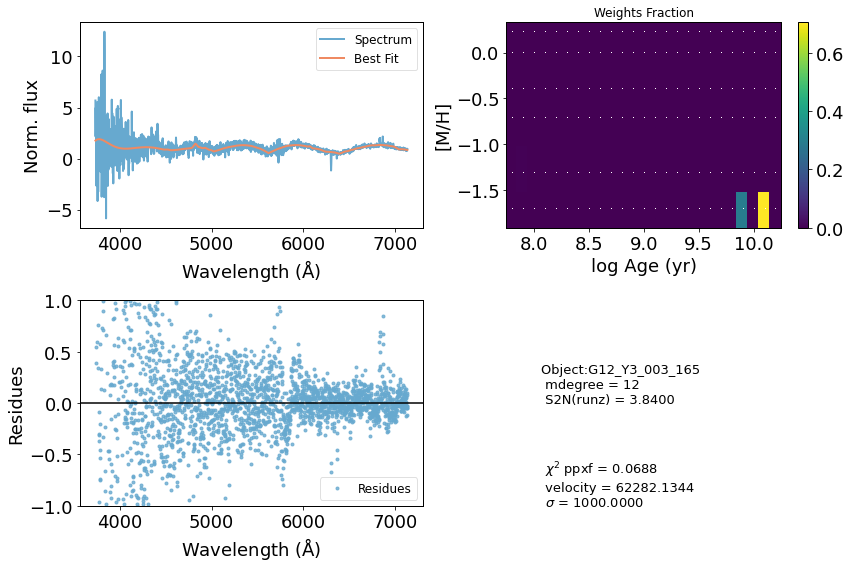

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47267       372    -0.004     0.004
 comp.  1:     47288      1000
 comp.  2:     47312       220
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006104
method = capfit; Jac calls: 11; Func calls: 251; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       7.57       9.1   47288  1000
Comp:  2       Unknown     0.5998       7.1   47312   220
Comp:  2       Unknown          0       6.9   47312   220
Comp:  2       Unknown     0.1539       3.2   47312   220
Comp:  2       Unknown    0.07336       2.4   47312   220
---------------------------------------------------------
Weighted <logAge> [yr]: 7.95
Weighted <[M/H]>: -1.61
Weighted <logAge> [yr]: 7.95
Weighted <[M/H]>: -1.61
M/L_r: 0.1714
Current $\chi^2$: 0.0061
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


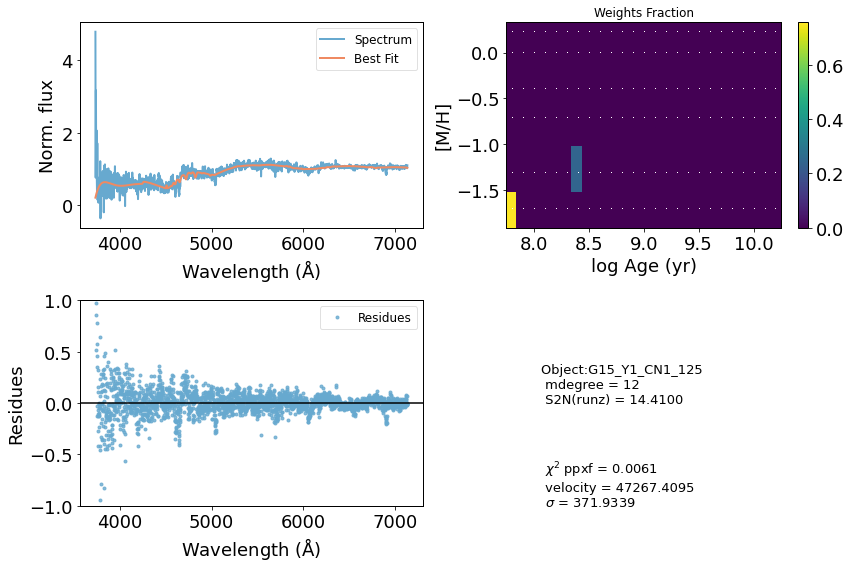

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     33339      1000    -0.013     0.021
 comp.  1:     35055       177
 comp.  2:     34944       101
Gas Reddening E(B-V): 0.169
chi2/DOF: 0.006809
method = capfit; Jac calls: 12; Func calls: 270; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.3   35055   177
Comp:  2       Unknown          0       3.9   34944   101
Comp:  2       Unknown          0       3.9   34944   101
Comp:  2       Unknown     0.5848       3.2   34944   101
Comp:  2       Unknown          0         2   34944   101
Comp:  2       Unknown          0       1.8   34944   101
---------------------------------------------------------
Weighted <logAge> [yr]: 9.65
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 9.65
Weighted <[M

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


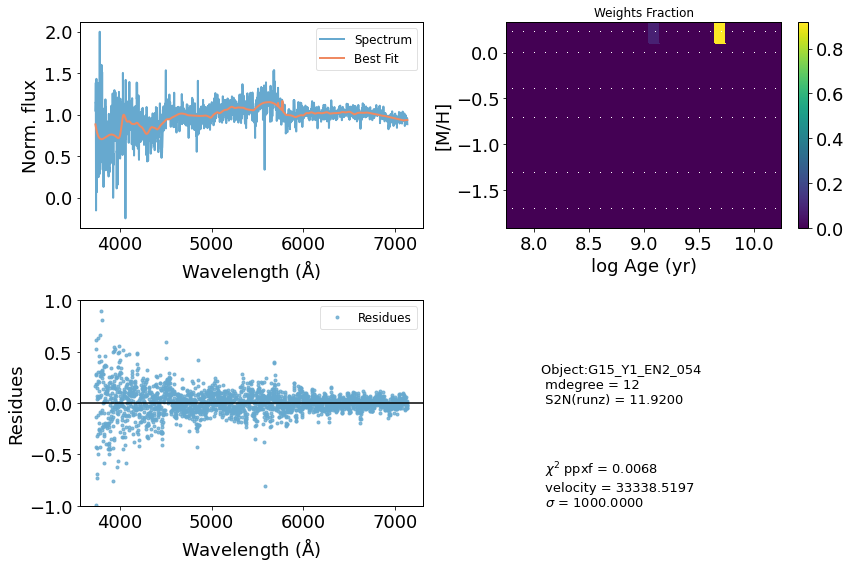

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39993       610     0.026     0.009
 comp.  1:     39618      1000
 comp.  2:     39882       407
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005481
method = capfit; Jac calls: 15; Func calls: 337; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.312         9   39618  1000
Comp:  2       Unknown          0        15   39882   407
Comp:  2       Unknown          0        15   39882   407
Comp:  2       Unknown     0.5515       5.2   39882   407
Comp:  2       Unknown     0.2854       3.3   39882   407
---------------------------------------------------------
Weighted <logAge> [yr]: 8.2
Weighted <[M/H]>: -1.48
Weighted <logAge> [yr]: 8.2
Weighted <[M/H]>: -1.48
M/L_r: 0.1996
Current $\chi^2$: 0.0055
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


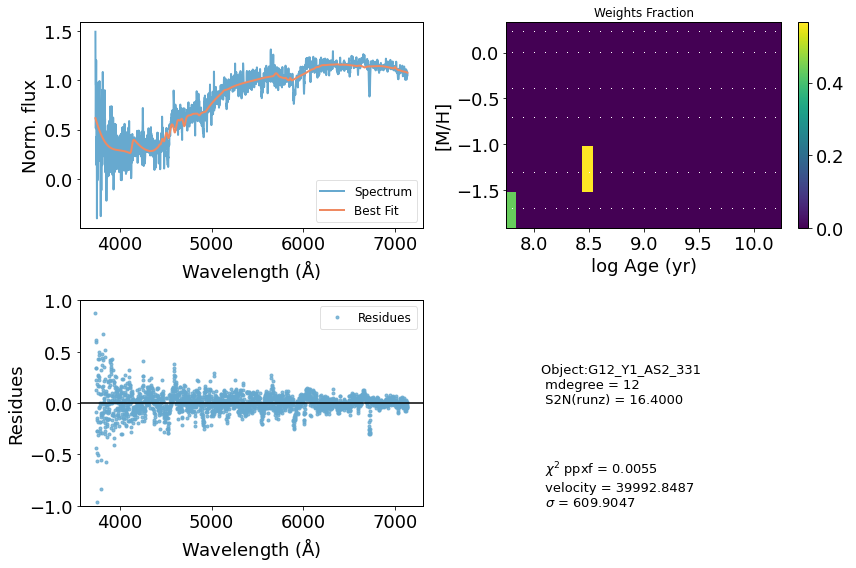

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     49556       514    -0.004     0.002
 comp.  1:     49574       474
 comp.  2:     49544       307
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006473
method = capfit; Jac calls: 16; Func calls: 361; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       2.46       7.6   49574   474
Comp:  2       Unknown      0.723       9.6   49544   307
Comp:  2       Unknown          0       9.5   49544   307
Comp:  2       Unknown     0.4352         4   49544   307
---------------------------------------------------------
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 9.9
Weighted <[M/H]>: 0.22
M/L_r: 2.329
Current $\chi^2$: 0.0065
Elapsed time in PPXF: 1.28 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


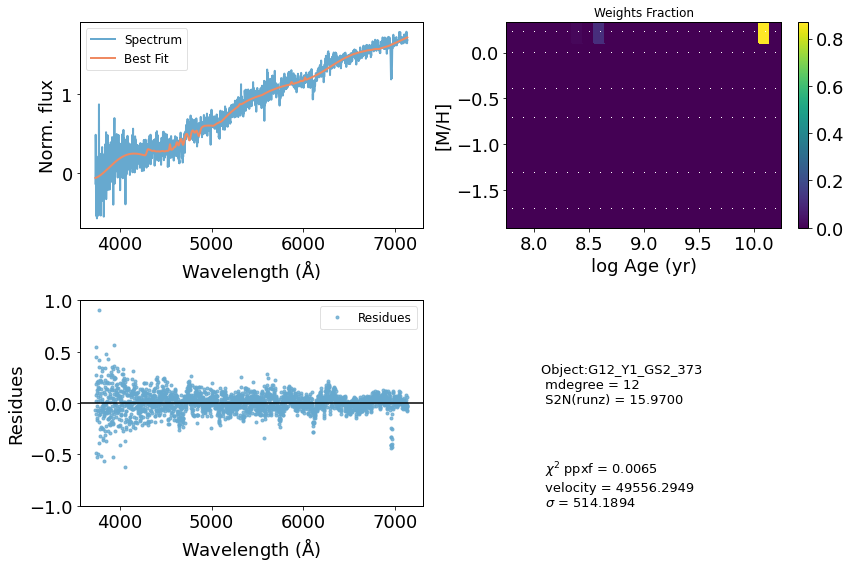

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53284       692     0.010     0.056
 comp.  1:     53468      1000
 comp.  2:     54258       160
Gas Reddening E(B-V): 0.330
chi2/DOF: 0.01185
method = capfit; Jac calls: 12; Func calls: 276; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      13.64        10   53468  1000
Comp:  2       Unknown    0.09709       4.7   54258   160
Comp:  2       Unknown     0.3535       4.7   54258   160
Comp:  2       Unknown     0.4773       2.4   54258   160
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.167
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.167
M/L_r: 3.621
Current $\chi^2$: 0.0119
Elapsed time in PPXF: 0.95 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


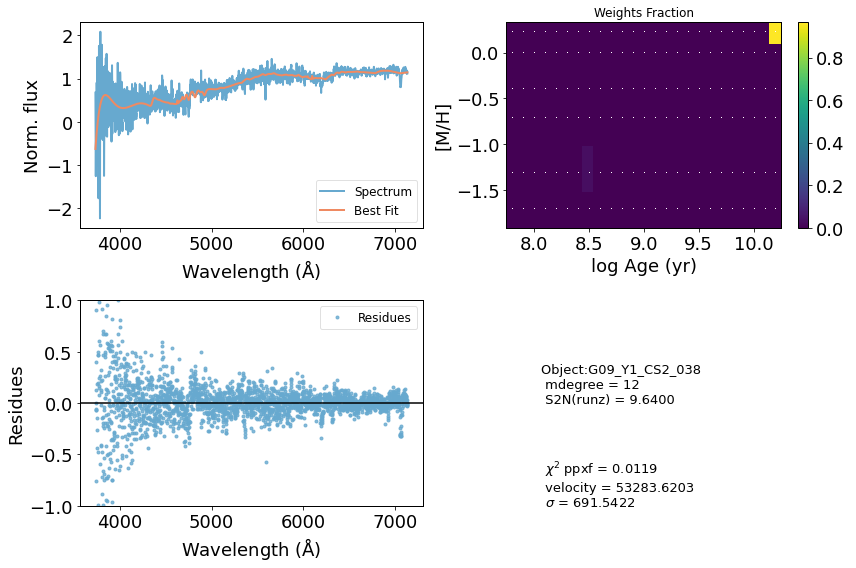

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47361       441     0.015     0.010
 comp.  1:     47202      1000
 comp.  2:     47459       241
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006924
method = capfit; Jac calls: 12; Func calls: 270; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      11.44        11   47202  1000
Comp:  2       Unknown     0.3654         7   47459   241
Comp:  2       Unknown          0         7   47459   241
Comp:  2       Unknown          0       3.8   47459   241
Comp:  2       Unknown          0         3   47459   241
---------------------------------------------------------
Weighted <logAge> [yr]: 8.15
Weighted <[M/H]>: -1.48
Weighted <logAge> [yr]: 8.15
Weighted <[M/H]>: -1.48
M/L_r: 0.1857
Current $\chi^2$: 0.0069
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


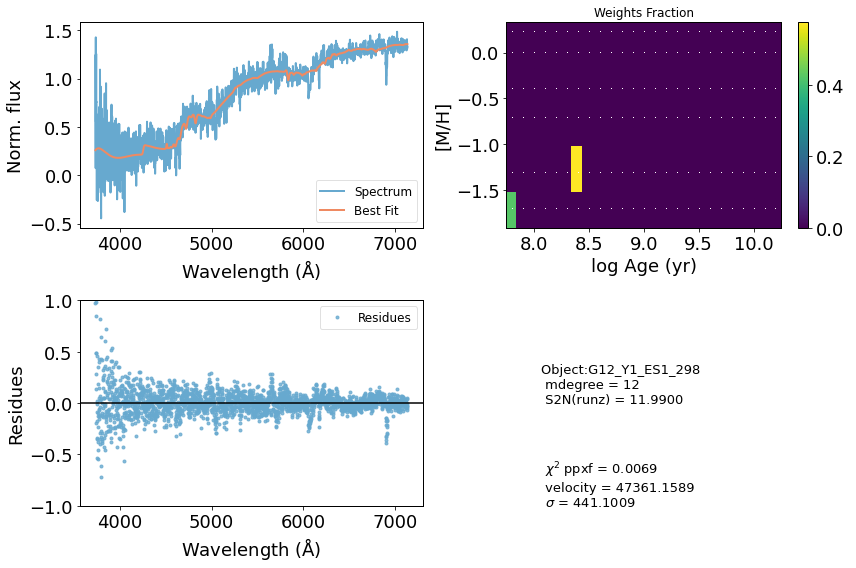

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46829      1000     0.050     0.048
 comp.  1:     46777       217
 comp.  2:     46472       135
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01763
method = capfit; Jac calls: 13; Func calls: 295; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.534       4.9   46777   217
Comp:  2       Unknown          0       4.7   46472   135
Comp:  2       Unknown     0.4243       4.7   46472   135
Comp:  2       Unknown          0       2.4   46472   135
Comp:  2       Unknown     0.1027       1.8   46472   135
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.183
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.183
M/L_r: 3.792
Current $\chi^2$: 0.0176
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


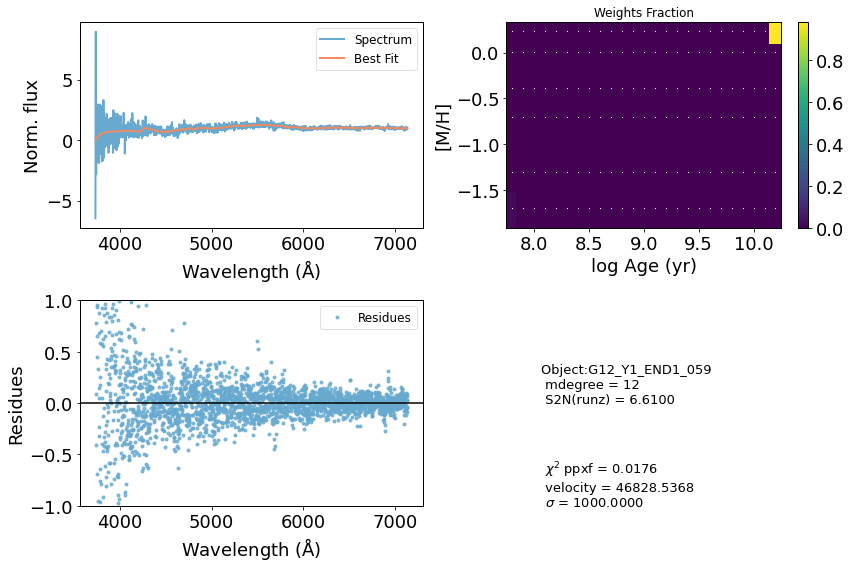

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     43011      1000     0.198     0.199
 comp.  1:     42844      1000
 comp.  2:     42382        53
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005073
method = capfit; Jac calls: 14; Func calls: 315; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.737       9.1   42844  1000
Comp:  2       Unknown          0         3   42382    53
Comp:  2       Unknown     0.3359       3.1   42382    53
Comp:  2       Unknown          0       2.4   42382    53
Comp:  2       Unknown     0.1709       1.3   42382    53
---------------------------------------------------------
Weighted <logAge> [yr]: 7.8
Weighted <[M/H]>: -1.71
Weighted <logAge> [yr]: 7.8
Weighted <[M/H]>: -1.71
M/L_r: 0.1627
Current $\chi^2$: 0.0051
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


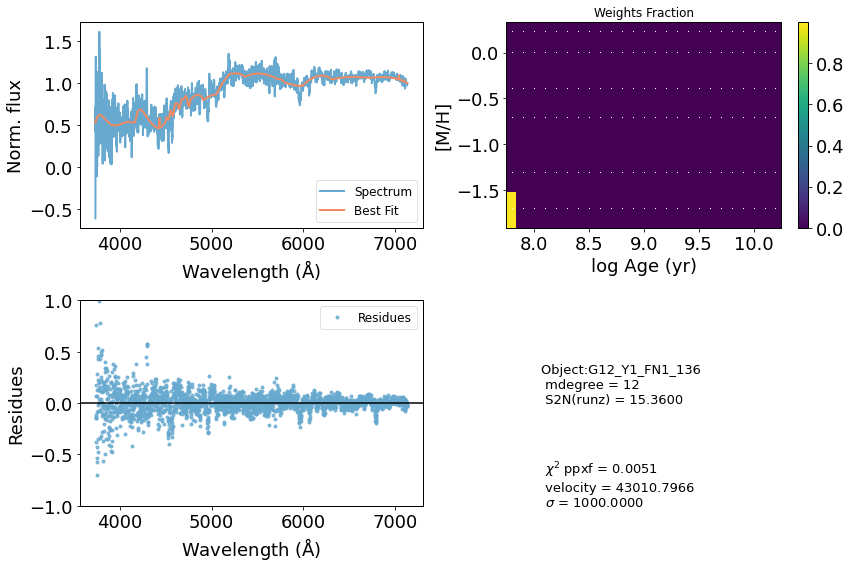

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     35913       484     0.015     0.001
 comp.  1:     36108       676
 comp.  2:     34129       167
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005066
method = capfit; Jac calls: 14; Func calls: 319; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.969       6.3   36108   676
Comp:  2       Unknown          0       6.6   34129   167
Comp:  2       Unknown          0       6.5   34129   167
Comp:  2       Unknown          0       3.5   34129   167
Comp:  2       Unknown          0       2.1   34129   167
Comp:  2       Unknown          0       1.9   34129   167
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.111
Weighted <logAge> [yr]: 10.1
Weighted <

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


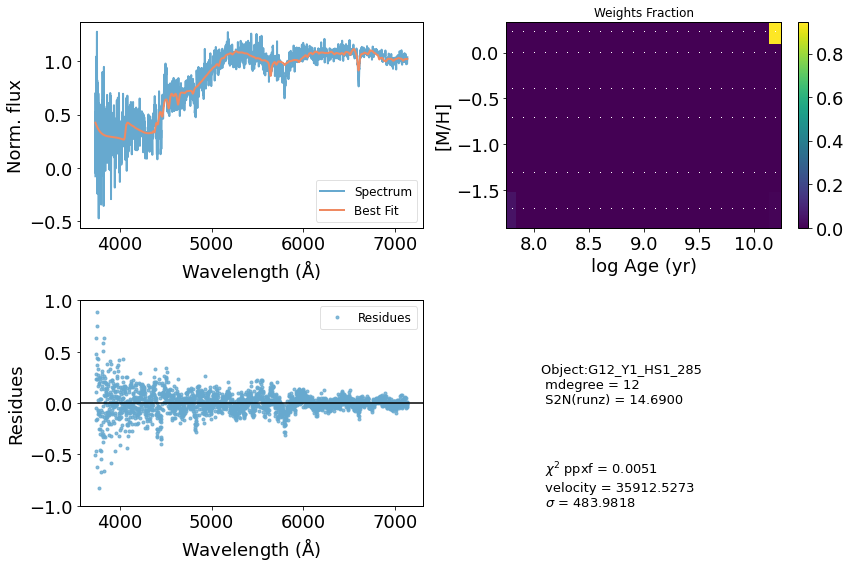

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39186      1000    -0.001    -0.013
 comp.  1:     37478       209
 comp.  2:     37437       237
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.03577
method = capfit; Jac calls: 12; Func calls: 271; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.242       2.7   37478   209
Comp:  2       Unknown          0        12   37437   237
Comp:  2       Unknown          0        12   37437   237
Comp:  2       Unknown     0.6277       3.7   37437   237
Comp:  2       Unknown     0.6827       1.8   37437   237
---------------------------------------------------------
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: -1.66
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: -1.66
M/L_r: 1.797
Current $\chi^2$: 0.0358
Elapsed time

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


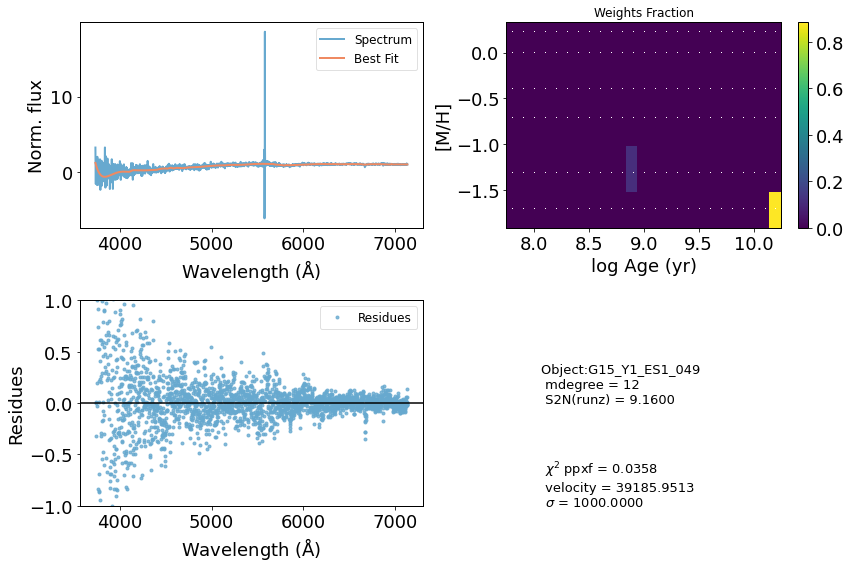

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     70143       906    -0.136     0.001
 comp.  1:     70313      1000
 comp.  2:     71010       898
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.005324
method = capfit; Jac calls: 45; Func calls: 999; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      28.53        12   70313  1000
Comp:  2       Unknown          0        36   71010   898
Comp:  2       Unknown      1.832        36   71010   898
Comp:  2       Unknown      4.595       6.8   71010   898
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: -1.32
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: -1.32
M/L_r: 2.257
Current $\chi^2$: 0.0053
Elapsed time in PPXF: 3.52 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


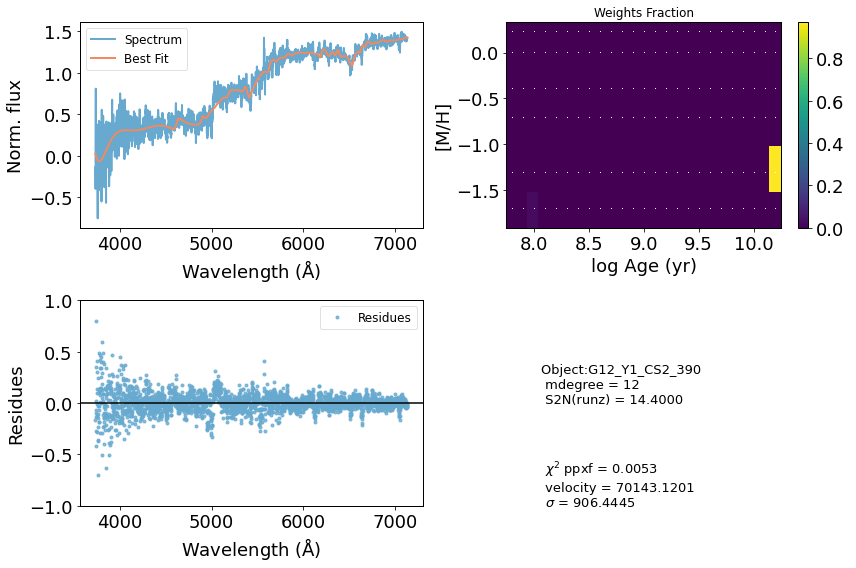

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     65574       940    -0.013     0.037
 comp.  1:     65886       153
 comp.  2:     67000       351
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.008393
method = capfit; Jac calls: 13; Func calls: 296; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.321       4.3   65886   153
Comp:  2       Unknown          0        11   67000   351
Comp:  2       Unknown       0.35        11   67000   351
Comp:  2       Unknown      1.134       3.9   67000   351
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
M/L_r: 7.345
Current $\chi^2$: 0.0084
Elapsed time in PPXF: 0.95 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


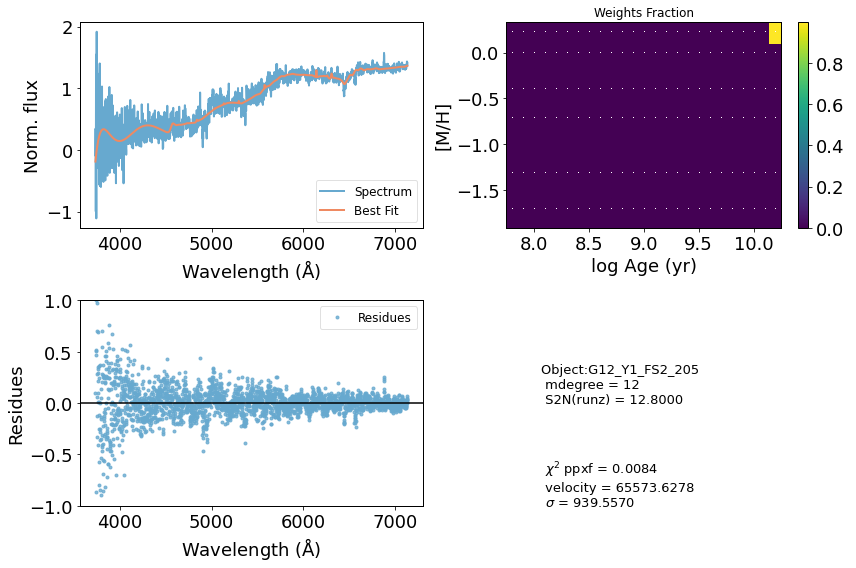

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64592       973    -0.002    -0.002
 comp.  1:     65328      1000
 comp.  2:     64561       227
Gas Reddening E(B-V): 0.203
chi2/DOF: 0.00748
method = capfit; Jac calls: 18; Func calls: 405; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      9.619        11   65328  1000
Comp:  2       Unknown          0       5.7   64561   227
Comp:  2       Unknown     0.6211       5.8   64561   227
Comp:  2       Unknown      1.083       3.4   64561   227
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
M/L_r: 6.026
Current $\chi^2$: 0.0075
Elapsed time in PPXF: 1.48 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


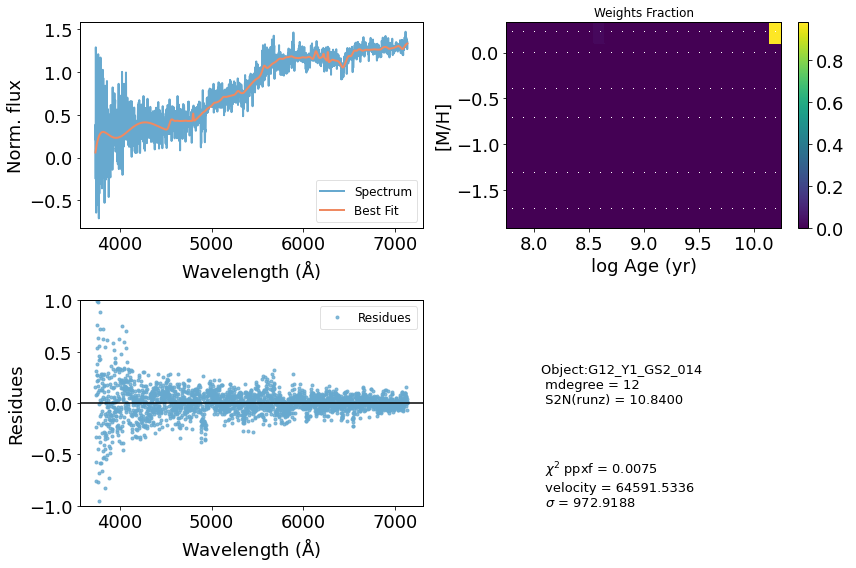

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47927       344     0.000    -0.003
 comp.  1:     47922       588
 comp.  2:     47778        71
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.009012
method = capfit; Jac calls: 11; Func calls: 250; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.325       6.4   47922   588
Comp:  2       Unknown          0       3.1   47778    71
Comp:  2       Unknown          0         3   47778    71
Comp:  2       Unknown          0       1.9   47778    71
Comp:  2       Unknown     0.2844       1.3   47778    71
---------------------------------------------------------
Weighted <logAge> [yr]: 9.59
Weighted <[M/H]>: 0.124
Weighted <logAge> [yr]: 9.59
Weighted <[M/H]>: 0.124
M/L_r: 0.9419
Current $\chi^2$: 0.0090
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


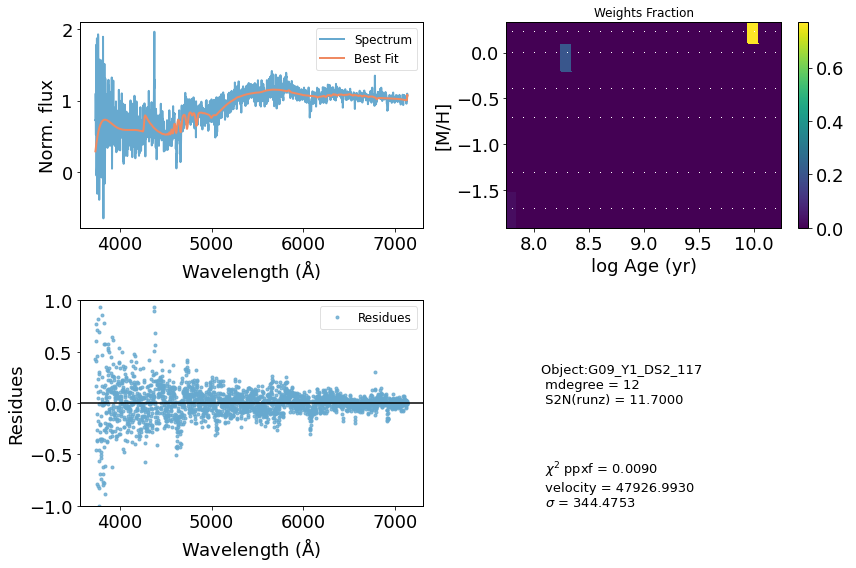

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50130       454     0.008     0.004
 comp.  1:     50136       979
 comp.  2:     50172       488
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006381
method = capfit; Jac calls: 12; Func calls: 269; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      5.307       9.8   50136   979
Comp:  2       Unknown     0.2503        16   50172   488
Comp:  2       Unknown          0        16   50172   488
Comp:  2       Unknown      1.592       5.1   50172   488
---------------------------------------------------------
Weighted <logAge> [yr]: 7.8
Weighted <[M/H]>: -1.71
Weighted <logAge> [yr]: 7.8
Weighted <[M/H]>: -1.71
M/L_r: 0.1626
Current $\chi^2$: 0.0064
Elapsed time in PPXF: 0.71 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


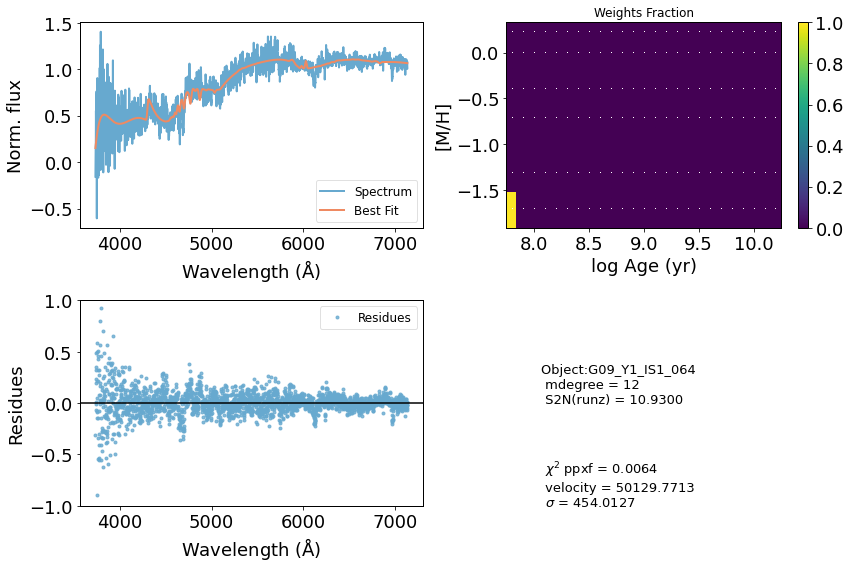

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     63441       565     0.073    -0.050
 comp.  1:     63632       544
 comp.  2:     64567      1000
Gas Reddening E(B-V): 0.540
chi2/DOF: 0.007697
method = capfit; Jac calls: 10; Func calls: 230; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      8.426       7.6   63632   544
Comp:  2       Unknown          0        42   64567  1000
Comp:  2       Unknown      4.003        42   64567  1000
Comp:  2       Unknown        1.9       7.1   64567  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: -0.464
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: -0.464
M/L_r: 1.87
Current $\chi^2$: 0.0077
Elapsed time in PPXF: 0.84 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


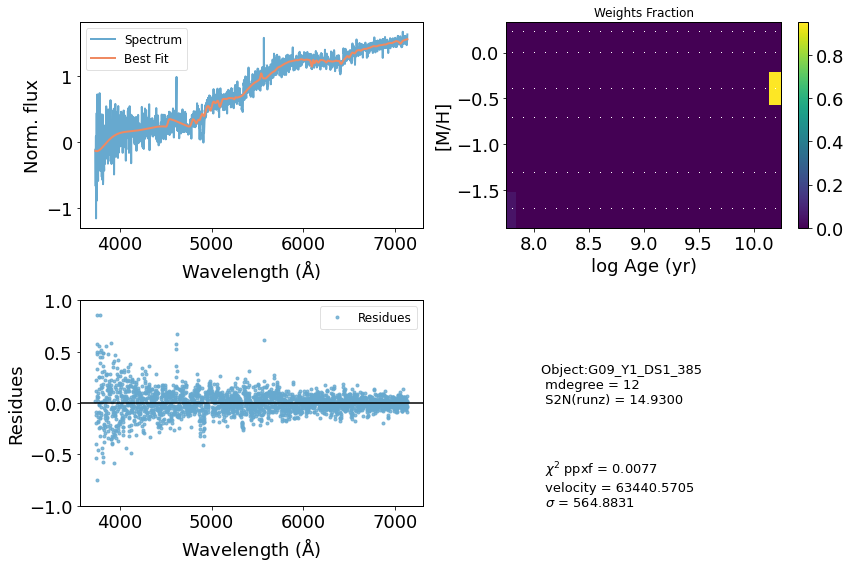

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59981       380    -0.001    -0.002
 comp.  1:     60055       161
 comp.  2:     60204       159
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.02227
method = capfit; Jac calls: 8; Func calls: 183; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.002       4.6   60055   161
Comp:  2       Unknown       0.23         4   60204   159
Comp:  2       Unknown          0         4   60204   159
Comp:  2       Unknown       1.07       2.7   60204   159
---------------------------------------------------------
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: 0.219
Weighted <logAge> [yr]: 9.73
Weighted <[M/H]>: 0.219
M/L_r: 2.623
Current $\chi^2$: 0.0223
Elapsed time in PPXF: 0.60 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


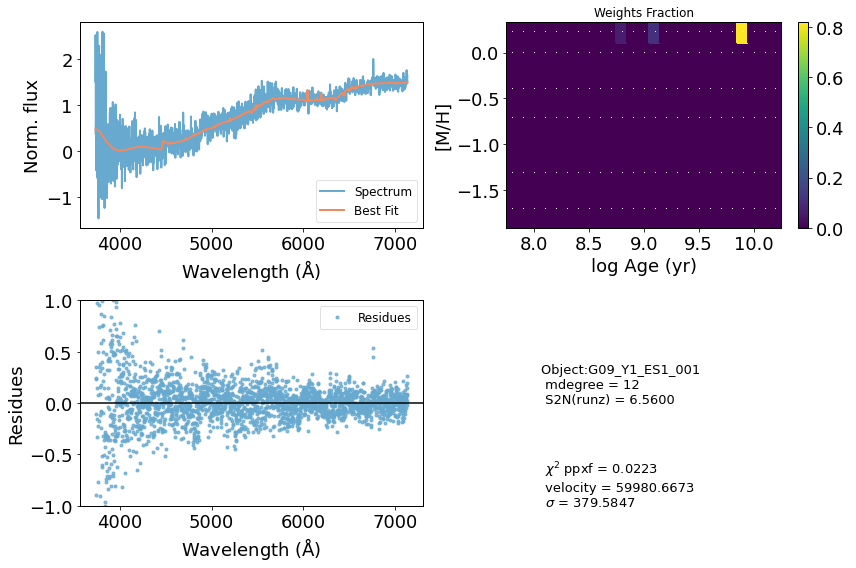

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37981      1000    -0.113    -0.069
 comp.  1:     35970       118
 comp.  2:     36238        17
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.0171
method = capfit; Jac calls: 14; Func calls: 314; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.8782       2.8   35970   118
Comp:  2       Unknown          0       2.9   36238    17
Comp:  2       Unknown    0.06515         3   36238    17
Comp:  2       Unknown     0.4802         2   36238    17
Comp:  2       Unknown     0.2829       1.2   36238    17
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.15
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.15
M/L_r: 2.589
Current $\chi^2$: 0.0171
Elapsed tim

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


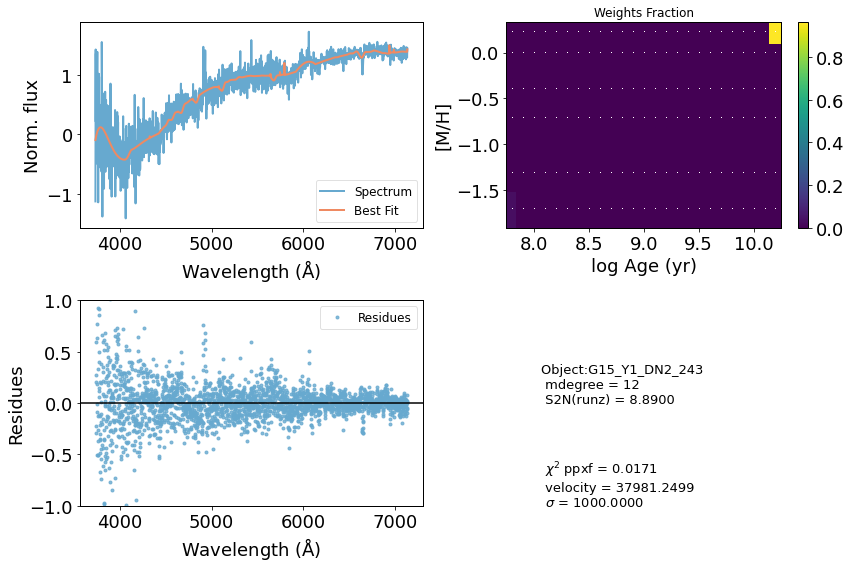

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     33647      1000     0.048     0.066
 comp.  1:     33181       585
 comp.  2:     33816        43
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005362
method = capfit; Jac calls: 17; Func calls: 382; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  7 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       2.38       6.5   33181   585
Comp:  2       Unknown          0       3.2   33816    43
Comp:  2       Unknown    0.05282       3.1   33816    43
Comp:  2       Unknown     0.2064       2.2   33816    43
Comp:  2       Unknown     0.1285       1.5   33816    43
Comp:  2       Unknown        0.1       1.3   33816    43
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 9.87
Weighted <[

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


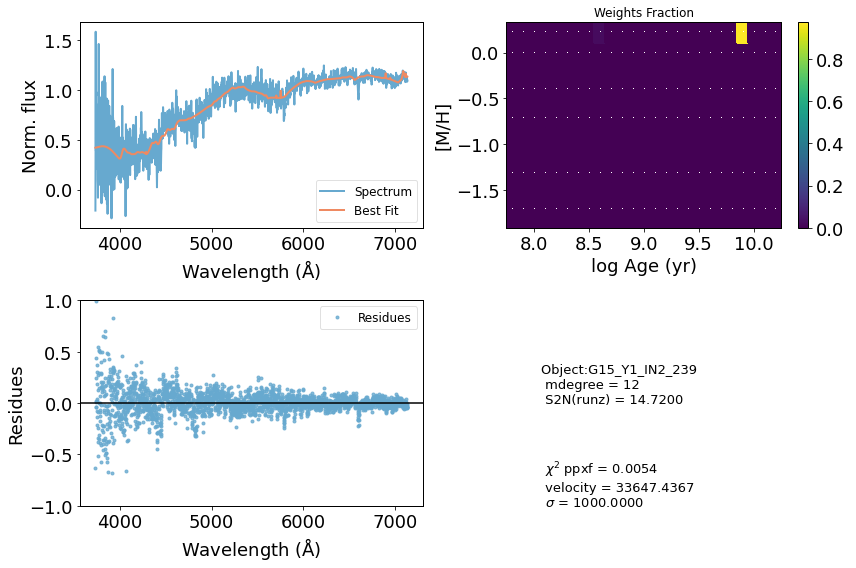

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     38939       180     0.000     0.000
 comp.  1:     38939       180
 comp.  2:     38939       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.08226
method = capfit; Jac calls: 1; Func calls: 29; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.3534       2.9   38939   180
Comp:  2       Unknown          0       6.7   38939   180
Comp:  2       Unknown          0       6.7   38939   180
Comp:  2       Unknown          0       3.6   38939   180
Comp:  2       Unknown          0       1.7   38939   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.71
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.71
M/L_r: 0.1817
Current $\chi^2$: 0.0823
Elapsed tim

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


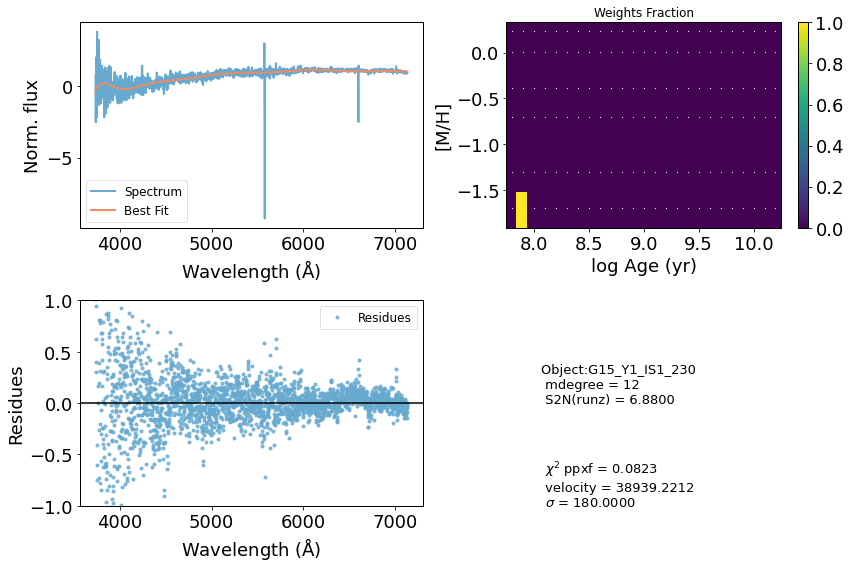

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     45683       694    -0.001     0.078
 comp.  1:     45712      1000
 comp.  2:     46043       195
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004528
method = capfit; Jac calls: 17; Func calls: 387; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.715        11   45712  1000
Comp:  2       Unknown     0.7281       5.5   46043   195
Comp:  2       Unknown          0       5.4   46043   195
Comp:  2       Unknown     0.8096       3.6   46043   195
Comp:  2       Unknown          0       2.5   46043   195
---------------------------------------------------------
Weighted <logAge> [yr]: 8.77
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 8.77
Weighted <[M/H]>: 0.22
M/L_r: 0.6549
Current $\chi^2$: 0.0045
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


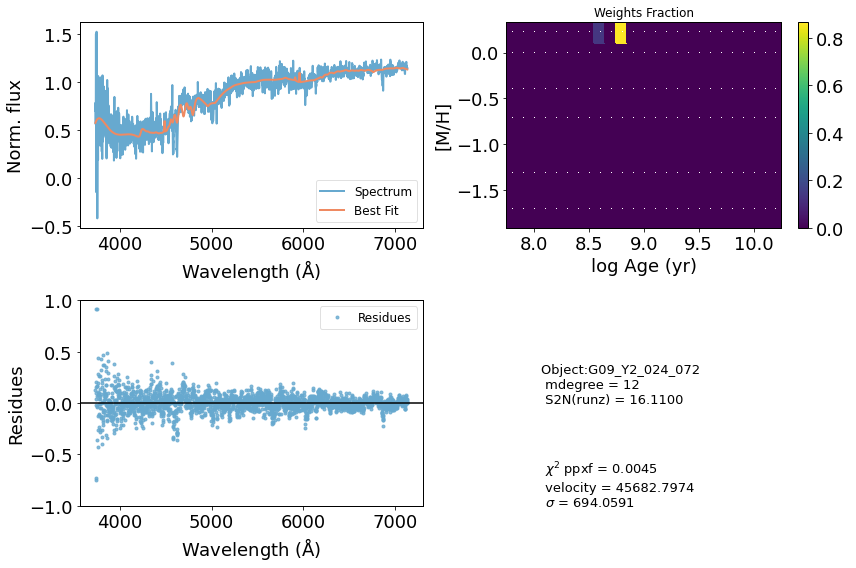

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47378       311     0.000     0.001
 comp.  1:     47299       316
 comp.  2:     47043       323
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01621
method = capfit; Jac calls: 11; Func calls: 250; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2144       3.8   47299   316
Comp:  2       Unknown          0        13   47043   323
Comp:  2       Unknown          0        13   47043   323
Comp:  2       Unknown    0.01399       3.4   47043   323
Comp:  2       Unknown     0.5436       2.2   47043   323
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
M/L_r: 7.823
Current $\chi^2$: 0.0162
Elapsed t

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


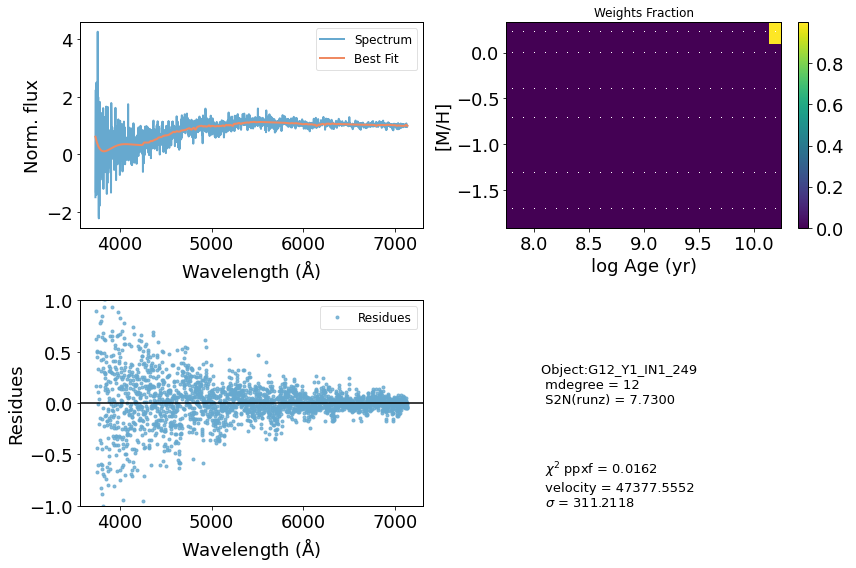

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44202       552     0.001    -0.001
 comp.  1:     44545       851
 comp.  2:     43913       161
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.007266
method = capfit; Jac calls: 13; Func calls: 295; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.142       9.5   44545   851
Comp:  2       Unknown   0.009757       4.3   43913   161
Comp:  2       Unknown    0.01326       4.2   43913   161
Comp:  2       Unknown      0.208       3.1   43913   161
Comp:  2       Unknown     0.1799       2.2   43913   161
---------------------------------------------------------
Weighted <logAge> [yr]: 7.8
Weighted <[M/H]>: -1.71
Weighted <logAge> [yr]: 7.8
Weighted <[M/H]>: -1.71
M/L_r: 0.1626
Current $\chi^2$: 0.0073
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


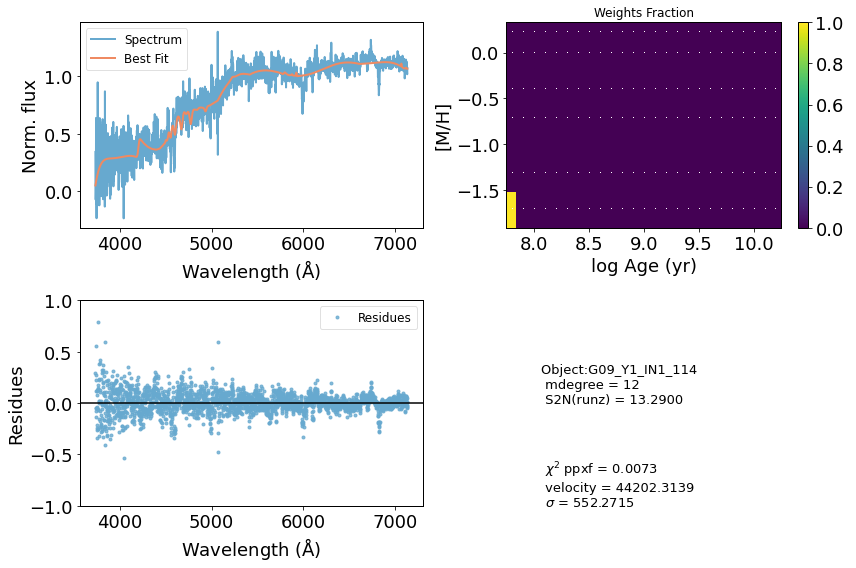

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51561       603    -0.048     0.047
 comp.  1:     51913      1000
 comp.  2:     52353       732
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006352
method = capfit; Jac calls: 18; Func calls: 403; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      7.451       9.4   51913  1000
Comp:  2       Unknown          0        31   52353   732
Comp:  2       Unknown      2.913        31   52353   732
Comp:  2       Unknown     0.9592       5.4   52353   732
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
M/L_r: 5.028
Current $\chi^2$: 0.0064
Elapsed time in PPXF: 1.39 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


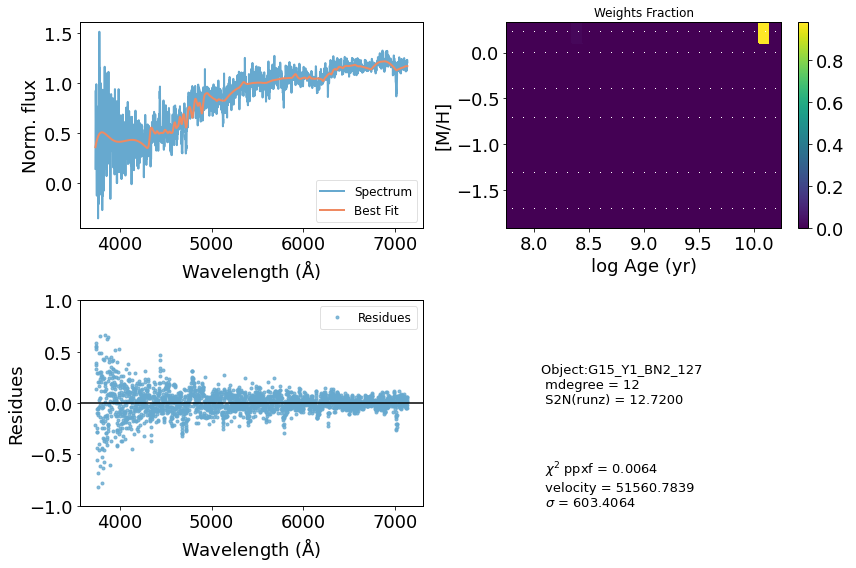

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36120       358     0.039     0.013
 comp.  1:     35655       215
 comp.  2:     35335       115
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01548
method = capfit; Jac calls: 13; Func calls: 296; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.321       3.4   35655   215
Comp:  2       Unknown          0       5.2   35335   115
Comp:  2       Unknown          0       5.2   35335   115
Comp:  2       Unknown      1.045       3.1   35335   115
Comp:  2       Unknown          0       2.2   35335   115
---------------------------------------------------------
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: 0.115
Weighted <logAge> [yr]: 9.87
Weighted <[M/H]>: 0.115
M/L_r: 1.197
Current $\chi^2$: 0.0155
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


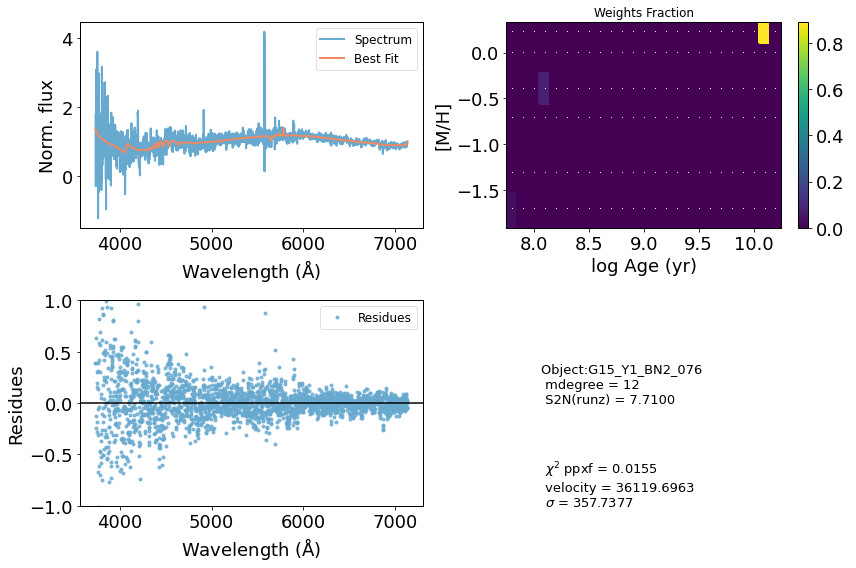

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46905       150     0.000     0.000
 comp.  1:     46830       672
 comp.  2:     46977        64
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01103
method = capfit; Jac calls: 13; Func calls: 292; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       4.77       8.5   46830   672
Comp:  2       Unknown          0       2.5   46977    64
Comp:  2       Unknown   0.005973       2.5   46977    64
Comp:  2       Unknown          0       2.4   46977    64
Comp:  2       Unknown     0.3862       1.5   46977    64
---------------------------------------------------------
Weighted <logAge> [yr]: 8.05
Weighted <[M/H]>: -1.54
Weighted <logAge> [yr]: 8.05
Weighted <[M/H]>: -1.54
M/L_r: 0.1785
Current $\chi^2$: 0.0110
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


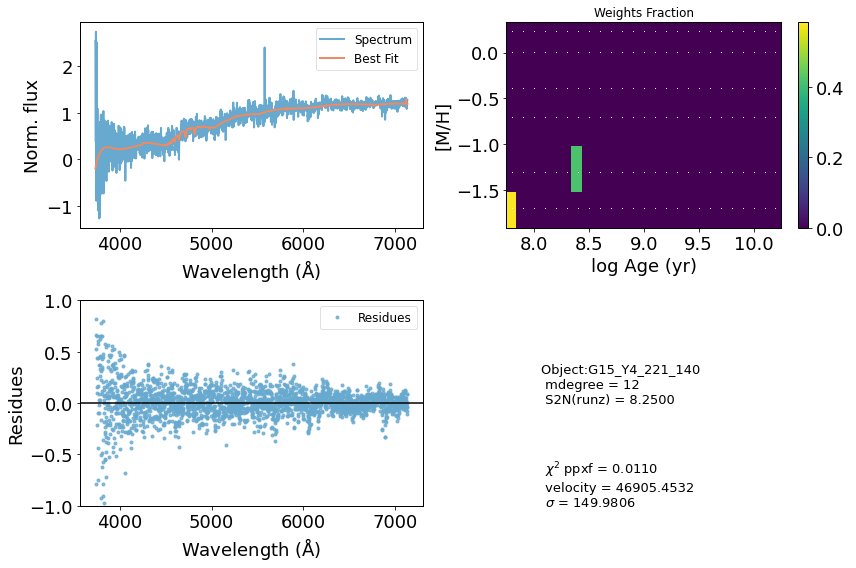

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[SII]6716' '[SII]6731' '[OIII]5007_d'
 '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     24503       218    -0.008     0.003
 comp.  1:     24647       196
 comp.  2:     24357       200
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01031
method = capfit; Jac calls: 15; Func calls: 338; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 158
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.442       3.3   24647   196
Comp:  2       Unknown          0        17   24357   200
Comp:  2       Unknown          0        17   24357   200
Comp:  2       Unknown     0.3697       1.3   24357   200
Comp:  2       Unknown     0.3554       1.4   24357   200
Comp:  2       Unknown          0         4   24357   200
Comp:  2       Unknown          0       1.8   24357   200
Comp:  2       Unknown          0       1.7   24357   200
------------------------------------

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


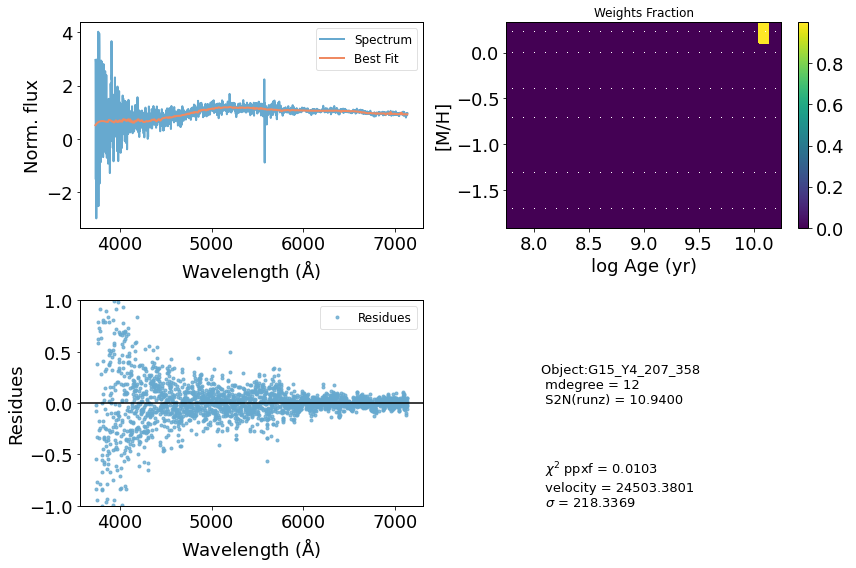

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46038        72    -0.002    -0.000
 comp.  1:     45944        61
 comp.  2:     46248       116
Gas Reddening E(B-V): 3.719
chi2/DOF: 0.007586
method = capfit; Jac calls: 10; Func calls: 226; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2516       1.4   45944    61
Comp:  2       Unknown          0       3.7   46248   116
Comp:  2       Unknown     0.7683       3.8   46248   116
Comp:  2       Unknown     0.3187       2.5   46248   116
Comp:  2       Unknown          0       1.9   46248   116
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.192
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.192
M/L_r: 3.635
Current $\chi^2$: 0.0076
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


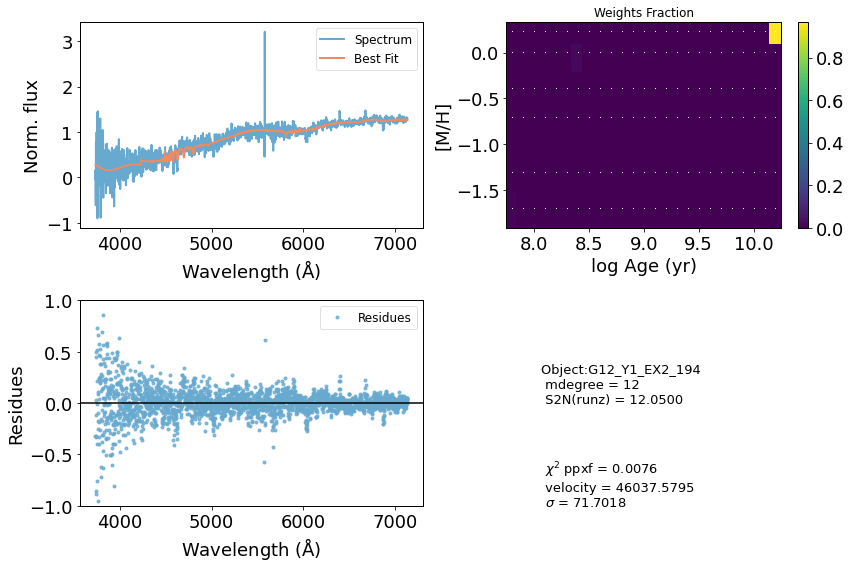

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53765       516    -0.097    -0.054
 comp.  1:     53942       439
 comp.  2:     54549       646
Gas Reddening E(B-V): 1.130
chi2/DOF: 0.008396
method = capfit; Jac calls: 8; Func calls: 187; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      7.765       6.3   53942   439
Comp:  2       Unknown      4.426        28   54549   646
Comp:  2       Unknown     0.9324        28   54549   646
Comp:  2       Unknown          0       4.8   54549   646
---------------------------------------------------------
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.22
M/L_r: 4.228
Current $\chi^2$: 0.0084
Elapsed time in PPXF: 0.64 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


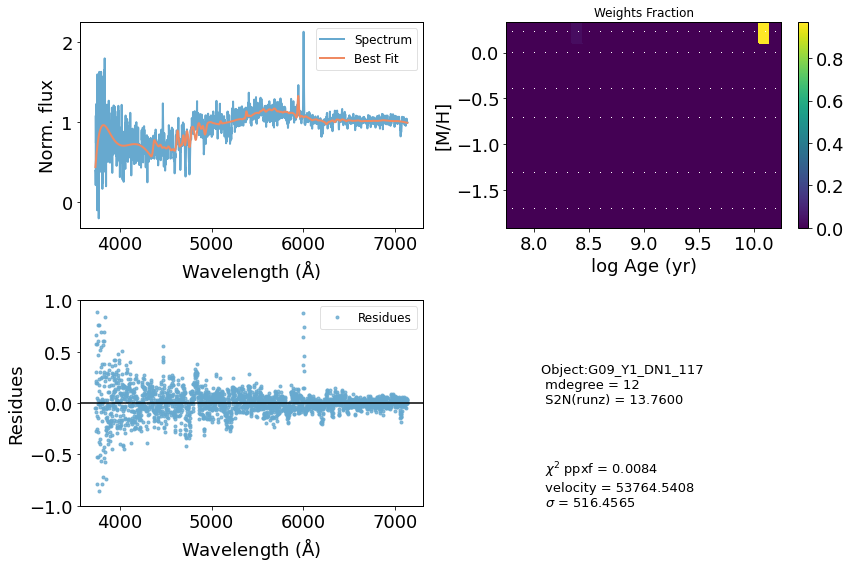

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40619       371    -0.012     0.007
 comp.  1:     41100       563
 comp.  2:     41158         1
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01048
method = capfit; Jac calls: 14; Func calls: 316; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.878       4.9   41100   563
Comp:  2       Unknown     0.1384       3.5   41158     1
Comp:  2       Unknown     0.7669       3.6   41158     1
Comp:  2       Unknown          0       1.6   41158     1
Comp:  2       Unknown  0.0008103      0.85   41158     1
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: -0.78
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: -0.78
M/L_r: 4.465
Current $\chi^2$: 0.0105
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


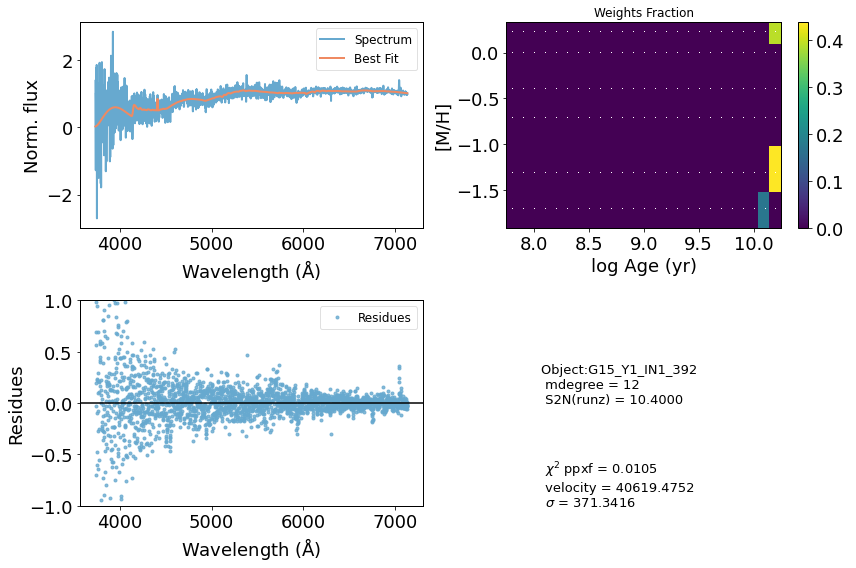

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53722       398    -0.002     0.002
 comp.  1:     53677       883
 comp.  2:     53968       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005321
method = capfit; Jac calls: 10; Func calls: 227; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      12.84        11   53677   883
Comp:  2       Unknown          0       4.9   53968   180
Comp:  2       Unknown          0       4.9   53968   180
Comp:  2       Unknown          0       2.9   53968   180
---------------------------------------------------------
Weighted <logAge> [yr]: 8.34
Weighted <[M/H]>: -0.474
Weighted <logAge> [yr]: 8.34
Weighted <[M/H]>: -0.474
M/L_r: 0.2669
Current $\chi^2$: 0.0053
Elapsed time in PPXF: 0.62 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


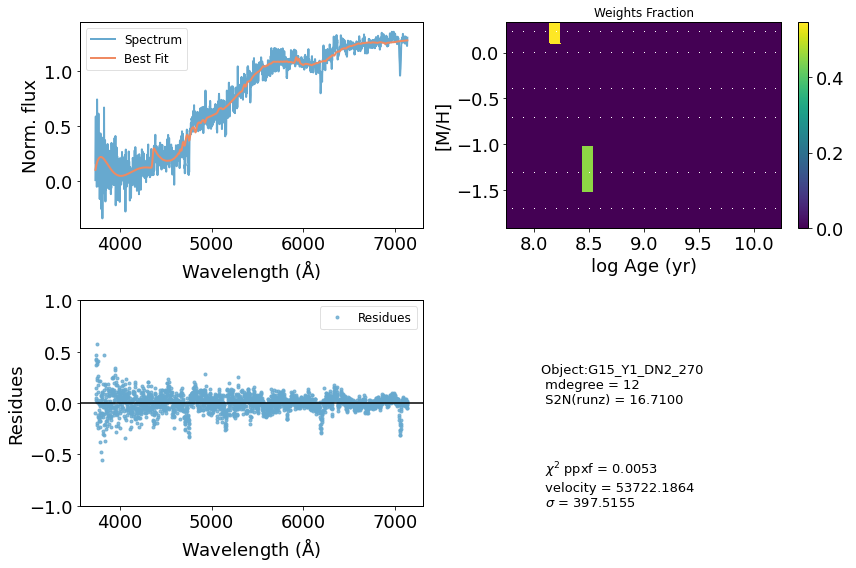

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     53962       731    -0.034    -0.019
 comp.  1:     54065      1000
 comp.  2:     54739       162
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.007929
method = capfit; Jac calls: 27; Func calls: 604; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      21.52        12   54065  1000
Comp:  2       Unknown          0       5.1   54739   162
Comp:  2       Unknown          0         5   54739   162
Comp:  2       Unknown          0       2.7   54739   162
---------------------------------------------------------
Weighted <logAge> [yr]: 8.4
Weighted <[M/H]>: -1.31
Weighted <logAge> [yr]: 8.4
Weighted <[M/H]>: -1.31
M/L_r: 0.209
Current $\chi^2$: 0.0079
Elapsed time in PPXF: 1.99 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


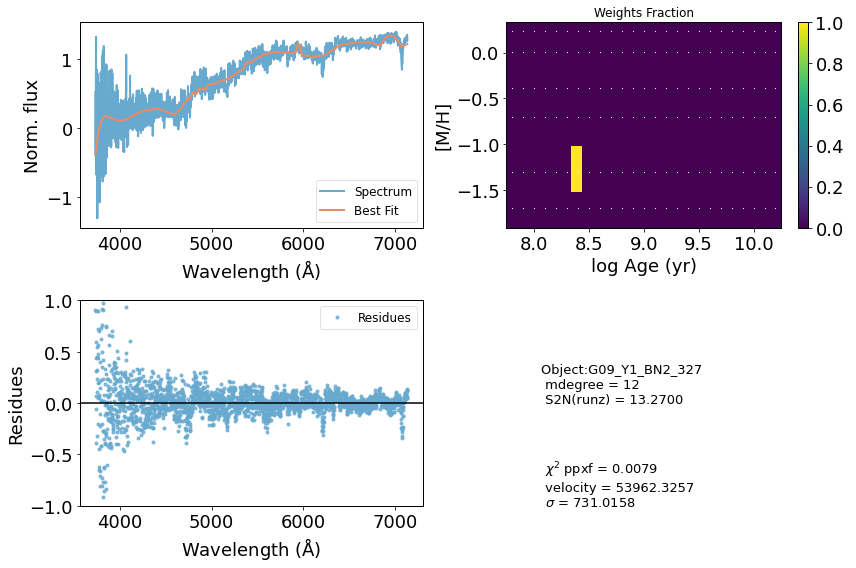

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51770       161    -0.000     0.000
 comp.  1:     52035         9
 comp.  2:     51785       218
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01342
method = capfit; Jac calls: 14; Func calls: 316; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.4484       1.9   52035     9
Comp:  2       Unknown      1.709       8.9   51785   218
Comp:  2       Unknown          0       8.7   51785   218
Comp:  2       Unknown     0.9355       2.9   51785   218
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.188
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.188
M/L_r: 4.1
Current $\chi^2$: 0.0134
Elapsed time in PPXF: 0.96 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


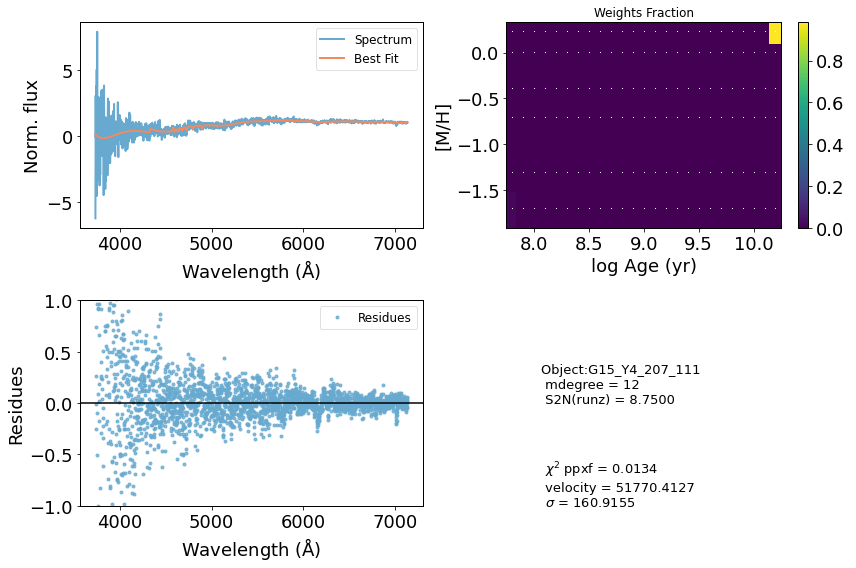

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[SII]6716' '[SII]6731' '[OIII]5007_d'
 '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     25838       314     0.019     0.011
 comp.  1:     25722       644
 comp.  2:     26516        45
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.004594
method = capfit; Jac calls: 17; Func calls: 384; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  7 / 158
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.338       7.1   25722   644
Comp:  2       Unknown     0.4774       3.6   26516    45
Comp:  2       Unknown     0.5984       3.6   26516    45
Comp:  2       Unknown          0       1.1   26516    45
Comp:  2       Unknown          0       1.1   26516    45
Comp:  2       Unknown     0.3504       2.4   26516    45
Comp:  2       Unknown    0.03469       1.4   26516    45
Comp:  2       Unknown     0.1344       1.4   26516    45
----------------------------------

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


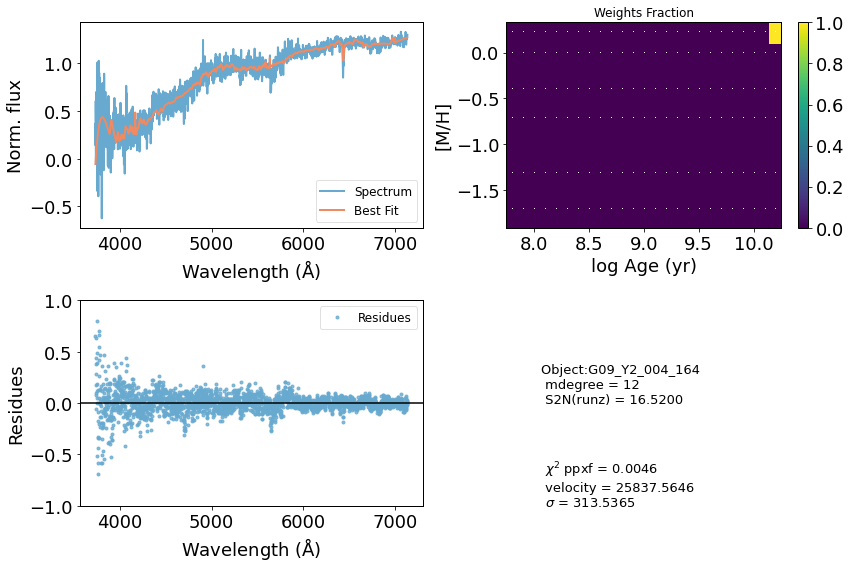

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     60060      1000    -0.002     0.002
 comp.  1:     60622       728
 comp.  2:     60734      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.03929
method = capfit; Jac calls: 13; Func calls: 297; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      8.316       8.8   60622   728
Comp:  2       Unknown          0        51   60734  1000
Comp:  2       Unknown      8.481        52   60734  1000
Comp:  2       Unknown          0       5.7   60734  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.219
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.219
M/L_r: 7.489
Current $\chi^2$: 0.0393
Elapsed time in PPXF: 1.05 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


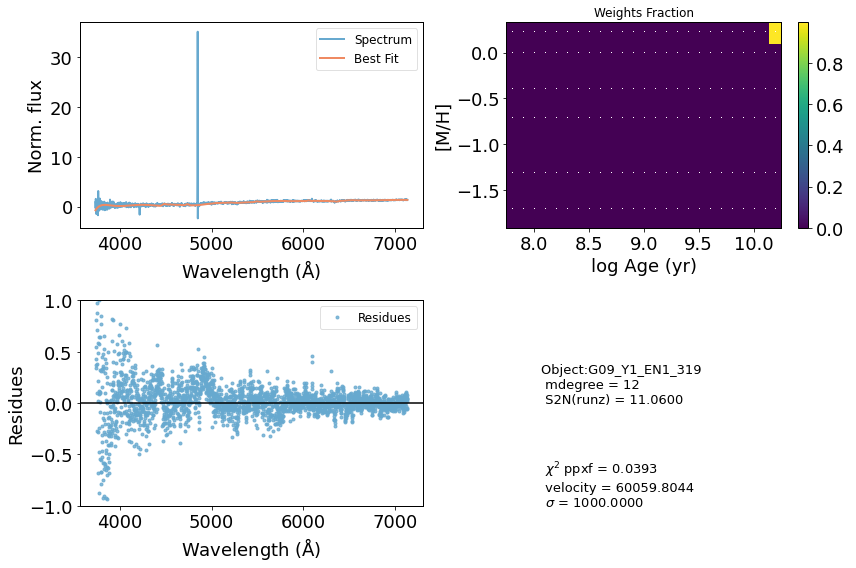

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44499       372     0.018    -0.012
 comp.  1:     44662       445
 comp.  2:     44426       623
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.003455
method = capfit; Jac calls: 7; Func calls: 163; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.098       8.6   44662   445
Comp:  2       Unknown          0        20   44426   623
Comp:  2       Unknown     0.4015        20   44426   623
Comp:  2       Unknown      2.076       6.6   44426   623
Comp:  2       Unknown     0.5818       5.7   44426   623
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
M/L_r: 4.532
Current $\chi^2$: 0.0035
Elapsed t

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


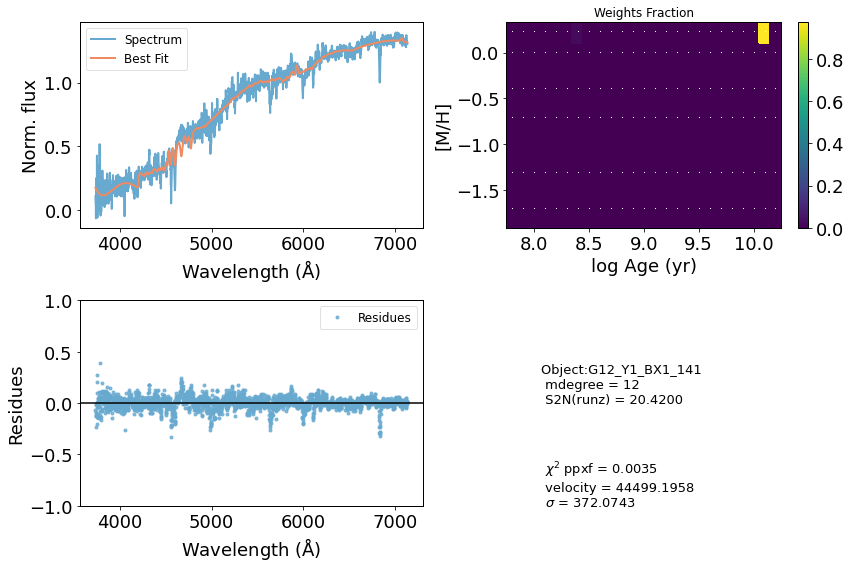

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     62200         9     0.014    -0.216
 comp.  1:     62191       319
 comp.  2:     62743        86
Gas Reddening E(B-V): -0.000
chi2/DOF: 19.62
method = capfit; Jac calls: 19; Func calls: 432; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       1598       7.2   62191   319
Comp:  2       Unknown      12.49       2.5   62743    86
Comp:  2       Unknown      12.17       2.2   62743    86
Comp:  2       Unknown      27.92       2.6   62743    86
---------------------------------------------------------
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.71
Weighted <logAge> [yr]: 7.9
Weighted <[M/H]>: -1.71
M/L_r: 0.1817
Current $\chi^2$: 19.6238
Elapsed time in PPXF: 1.32 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


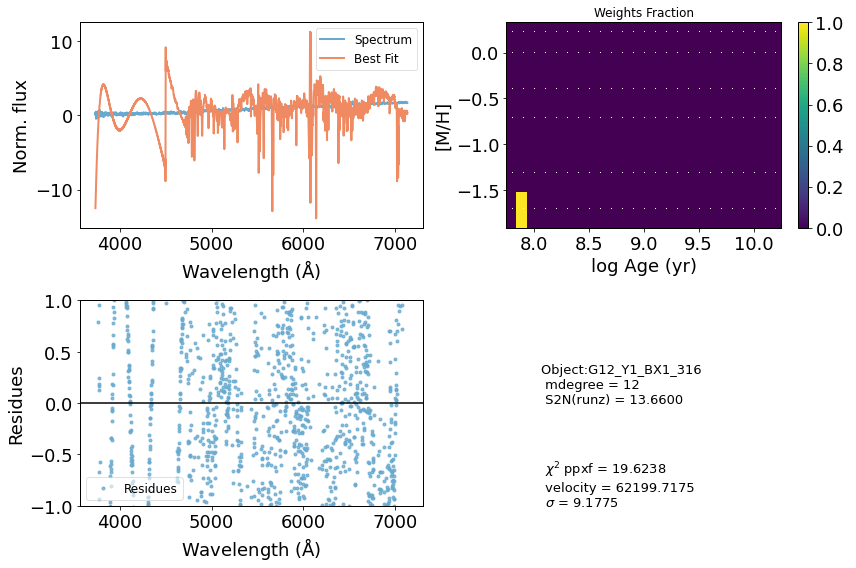

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     41153       649     0.002     0.021
 comp.  1:     40912       737
 comp.  2:     40957       187
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.00664
method = capfit; Jac calls: 11; Func calls: 250; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.646       6.8   40912   737
Comp:  2       Unknown          0       7.4   40957   187
Comp:  2       Unknown     0.5286       7.5   40957   187
Comp:  2       Unknown          0       3.4   40957   187
Comp:  2       Unknown          0         2   40957   187
---------------------------------------------------------
Weighted <logAge> [yr]: 7.97
Weighted <[M/H]>: -1.59
Weighted <logAge> [yr]: 7.97
Weighted <[M/H]>: -1.59
M/L_r: 0.1732
Current $\chi^2$: 0.0066
Elapse

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


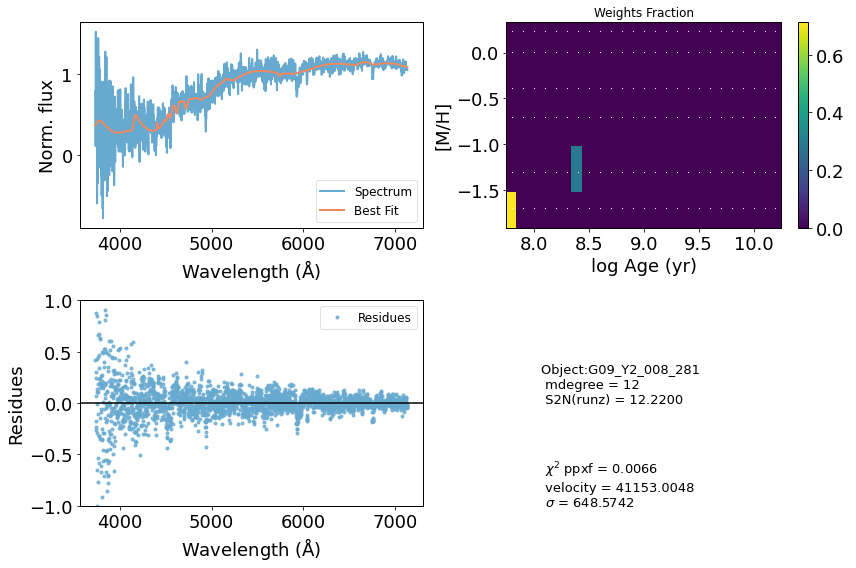

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[SII]6716' '[SII]6731' '[OIII]5007_d'
 '[OI]6300_d' '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     29331       374    -0.184    -0.092
 comp.  1:     29025       556
 comp.  2:     28228       577
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.00603
method = capfit; Jac calls: 15; Func calls: 339; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 158
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.767        14   29025   556
Comp:  2       Unknown          0        47   28228   577
Comp:  2       Unknown          0        47   28228   577
Comp:  2       Unknown     0.9412       4.9   28228   577
Comp:  2       Unknown          0         5   28228   577
Comp:  2       Unknown          0       7.8   28228   577
Comp:  2       Unknown          0       4.1   28228   577
Comp:  2       Unknown          0         9   28228   577
------------------------------------

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


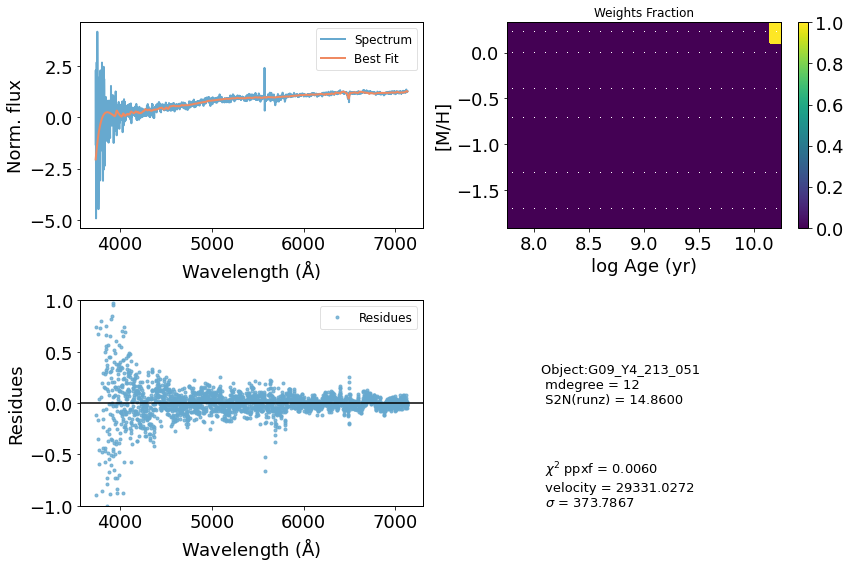

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     54317       635    -0.063     0.005
 comp.  1:     54558       965
 comp.  2:     54861       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.009905
method = capfit; Jac calls: 11; Func calls: 251; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      10.98        12   54558   965
Comp:  2       Unknown          0       4.6   54861   180
Comp:  2       Unknown     0.1117       4.6   54861   180
Comp:  2       Unknown          0       2.7   54861   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.211
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.211
M/L_r: 4.291
Current $\chi^2$: 0.0099
Elapsed time in PPXF: 0.83 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


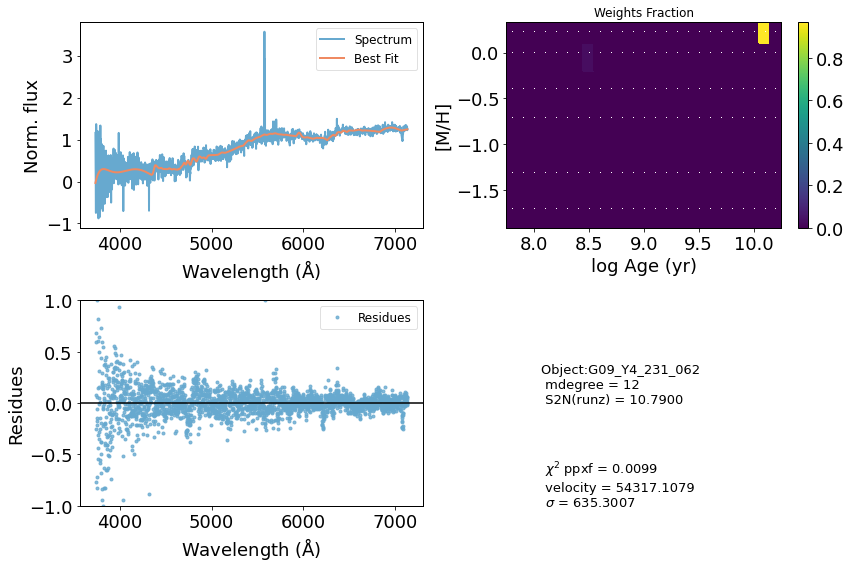

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     32516       439    -0.042     0.010
 comp.  1:     33141       213
 comp.  2:     33343       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004388
method = capfit; Jac calls: 11; Func calls: 251; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.9754       4.2   33141   213
Comp:  2       Unknown          0         6   33343   180
Comp:  2       Unknown          0       5.9   33343   180
Comp:  2       Unknown          0       3.7   33343   180
Comp:  2       Unknown          0       2.8   33343   180
Comp:  2       Unknown          0       2.4   33343   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10
Weighted <[M/H]>

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


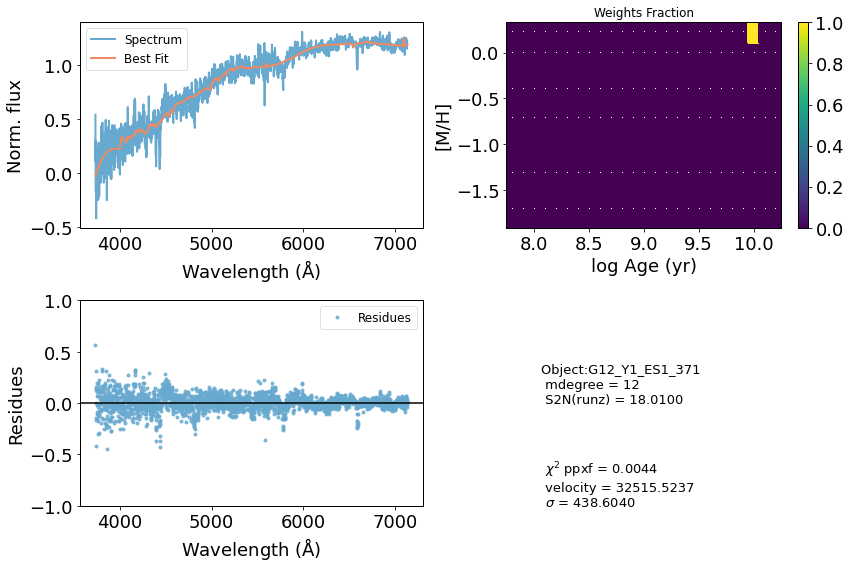

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     59709       604    -0.065     0.012
 comp.  1:     59999      1000
 comp.  2:     59632       571
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01052
method = capfit; Jac calls: 12; Func calls: 270; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      8.644        10   59999  1000
Comp:  2       Unknown          0        22   59632   571
Comp:  2       Unknown          0        22   59632   571
Comp:  2       Unknown      2.023       4.7   59632   571
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
M/L_r: 7.392
Current $\chi^2$: 0.0105
Elapsed time in PPXF: 0.97 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


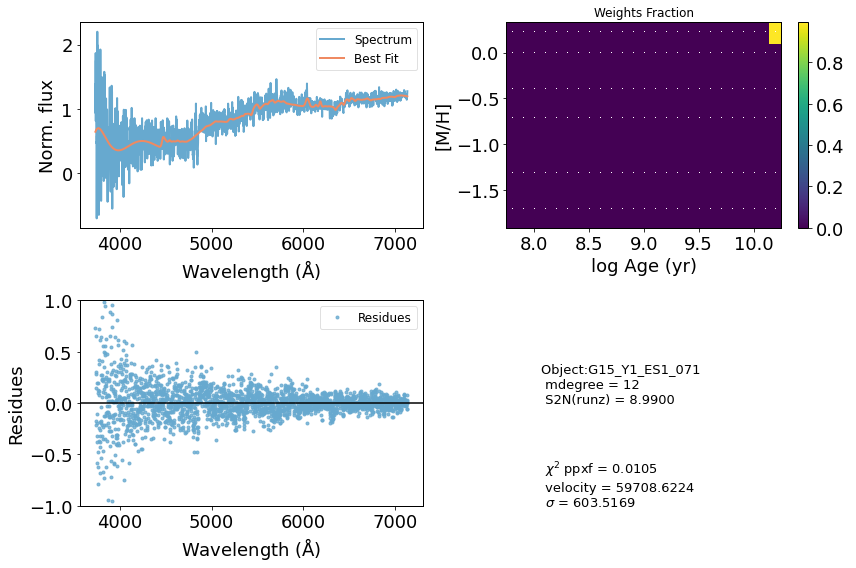

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     30363       212    -0.022    -0.033
 comp.  1:     30516       180
 comp.  2:     30526       171
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01042
method = capfit; Jac calls: 13; Func calls: 294; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       3.2   30516   180
Comp:  2       Unknown          0       6.7   30526   171
Comp:  2       Unknown      0.574       6.8   30526   171
Comp:  2       Unknown          0       4.1   30526   171
Comp:  2       Unknown     0.4267       2.1   30526   171
Comp:  2       Unknown     0.4268         2   30526   171
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M/

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


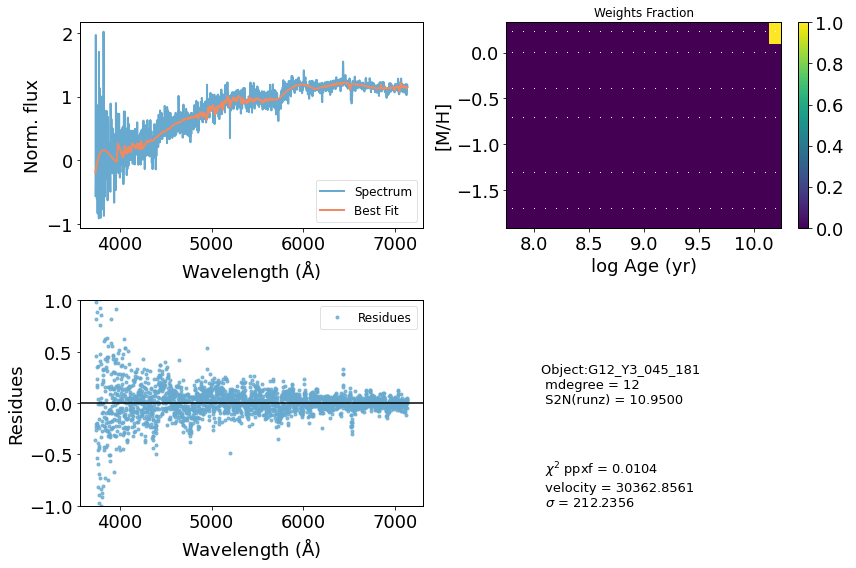

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     66287       180     0.000     0.000
 comp.  1:     66287       180
 comp.  2:     66287       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.03296
method = capfit; Jac calls: 1; Func calls: 29; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0         5   66287   180
Comp:  2       Unknown          0       5.2   66287   180
Comp:  2       Unknown     0.2232       5.4   66287   180
Comp:  2       Unknown          0       3.7   66287   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
M/L_r: 8.088
Current $\chi^2$: 0.0330
Elapsed time in PPXF: 0.08 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


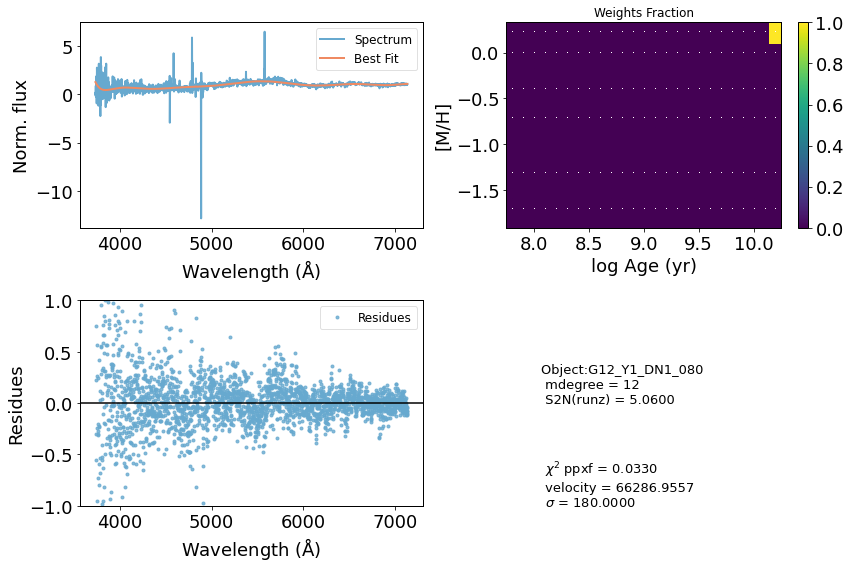

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     47962        79    -0.002    -0.002
 comp.  1:     48052       263
 comp.  2:     47983       104
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.007492
method = capfit; Jac calls: 11; Func calls: 248; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.631       5.2   48052   263
Comp:  2       Unknown   0.003419       3.1   47983   104
Comp:  2       Unknown     0.2356       3.1   47983   104
Comp:  2       Unknown          0       2.6   47983   104
Comp:  2       Unknown      0.255       1.7   47983   104
---------------------------------------------------------
Weighted <logAge> [yr]: 8.48
Weighted <[M/H]>: -1.32
Weighted <logAge> [yr]: 8.48
Weighted <[M/H]>: -1.32
M/L_r: 0.2414
Current $\chi^2$: 0.0075
Elaps

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


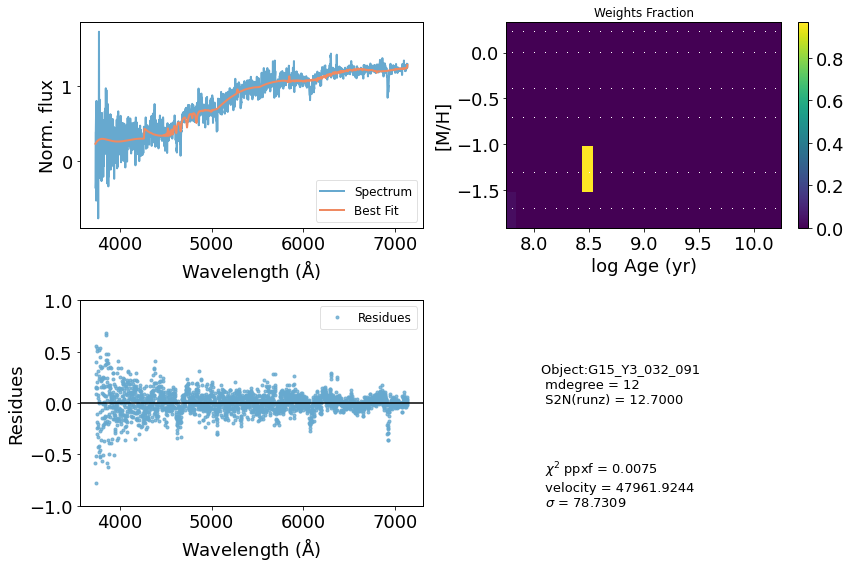

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     74674      1000     0.011     0.009
 comp.  1:     74878       352
 comp.  2:     74354         1
Gas Reddening E(B-V): 7.259
chi2/DOF: 0.02435
method = capfit; Jac calls: 11; Func calls: 250; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown        3.5       3.7   74878   352
Comp:  2       Unknown          0       1.5   74354     1
Comp:  2       Unknown          0       0.4   74354     1
Comp:  2       Unknown     0.3779       1.4   74354     1
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: -0.058
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: -0.058
M/L_r: 3.141
Current $\chi^2$: 0.0244
Elapsed time in PPXF: 1.04 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


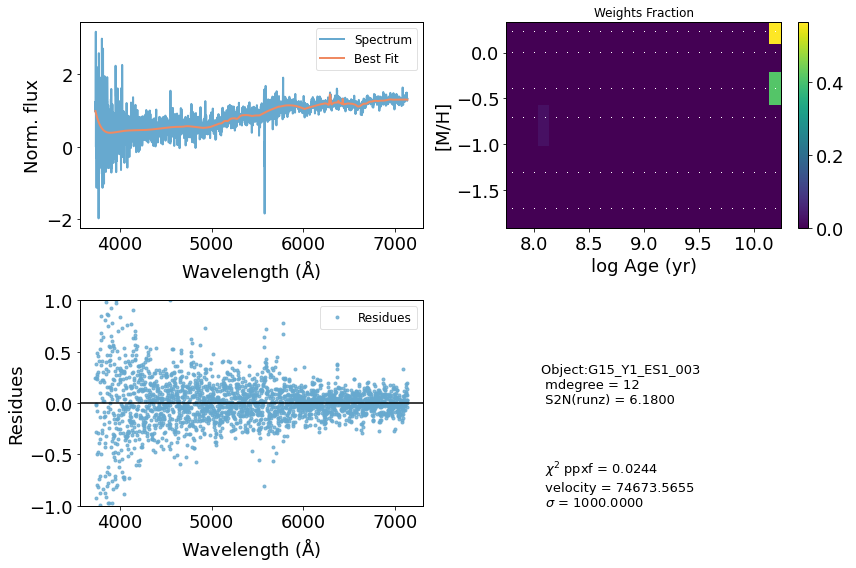

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     34854       180     0.000     0.000
 comp.  1:     34854       180
 comp.  2:     34854       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.007965
method = capfit; Jac calls: 1; Func calls: 26; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.7   34854   180
Comp:  2       Unknown          0         8   34854   180
Comp:  2       Unknown          0       7.9   34854   180
Comp:  2       Unknown          0       3.4   34854   180
Comp:  2       Unknown          0         2   34854   180
Comp:  2       Unknown    0.08096       1.7   34854   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.1
Weighted <[M/H

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


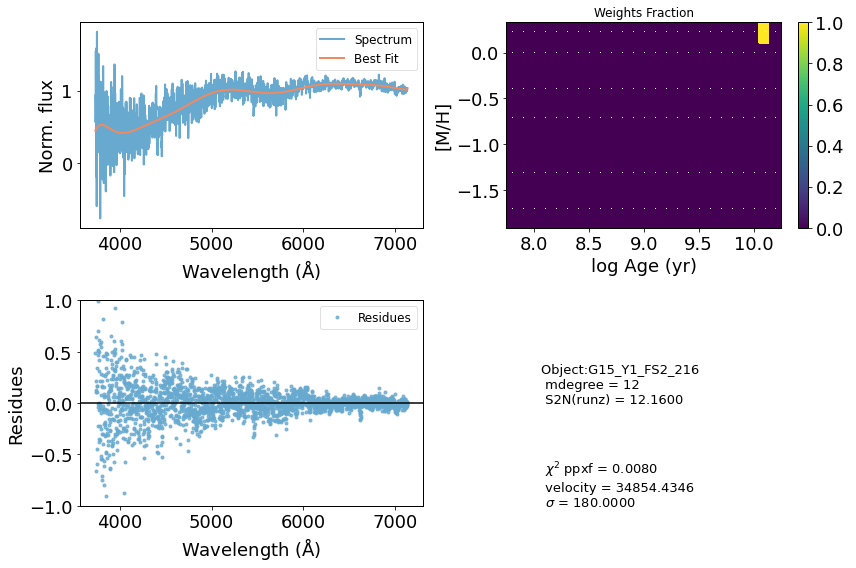

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     64425      1000    -0.031     0.011
 comp.  1:     64860       273
 comp.  2:     65205      1000
Gas Reddening E(B-V): 1.277
chi2/DOF: 0.01036
method = capfit; Jac calls: 30; Func calls: 671; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.026       4.2   64860   273
Comp:  2       Unknown          0        51   65205  1000
Comp:  2       Unknown          0        51   65205  1000
Comp:  2       Unknown      3.413         6   65205  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: -0.158
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: -0.158
M/L_r: 5.415
Current $\chi^2$: 0.0104
Elapsed time in PPXF: 2.38 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


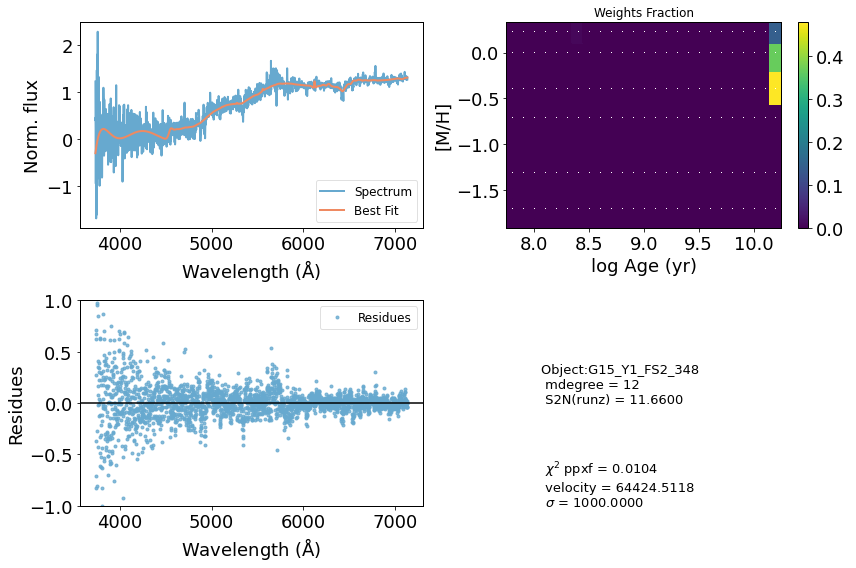

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     30080       600    -0.044     0.021
 comp.  1:     29487       496
 comp.  2:     29910        66
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.009973
method = capfit; Jac calls: 10; Func calls: 229; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       4.4   29487   496
Comp:  2       Unknown      1.111       5.7   29910    66
Comp:  2       Unknown          0       5.5   29910    66
Comp:  2       Unknown          0         3   29910    66
Comp:  2       Unknown     0.2238       1.4   29910    66
Comp:  2       Unknown    0.06975       1.2   29910    66
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


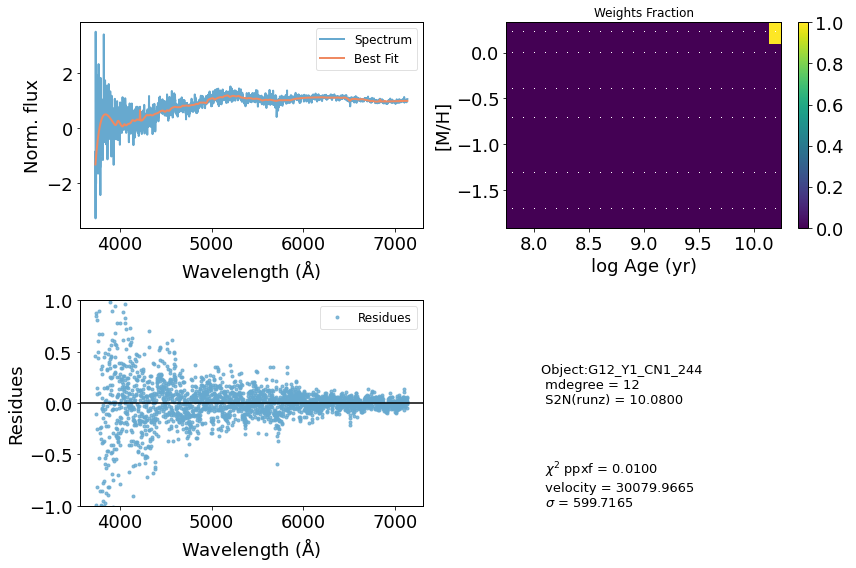

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     73048      1000     0.010    -0.017
 comp.  1:     72706       496
 comp.  2:     72577       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01664
method = capfit; Jac calls: 12; Func calls: 273; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.168       8.5   72706   496
Comp:  2       Unknown      1.134       4.2   72577   180
Comp:  2       Unknown          0       4.1   72577   180
Comp:  2       Unknown          0       2.7   72577   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: -0.0363
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: -0.0363
M/L_r: 2.329
Current $\chi^2$: 0.0166
Elapsed time in PPXF: 0.82 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


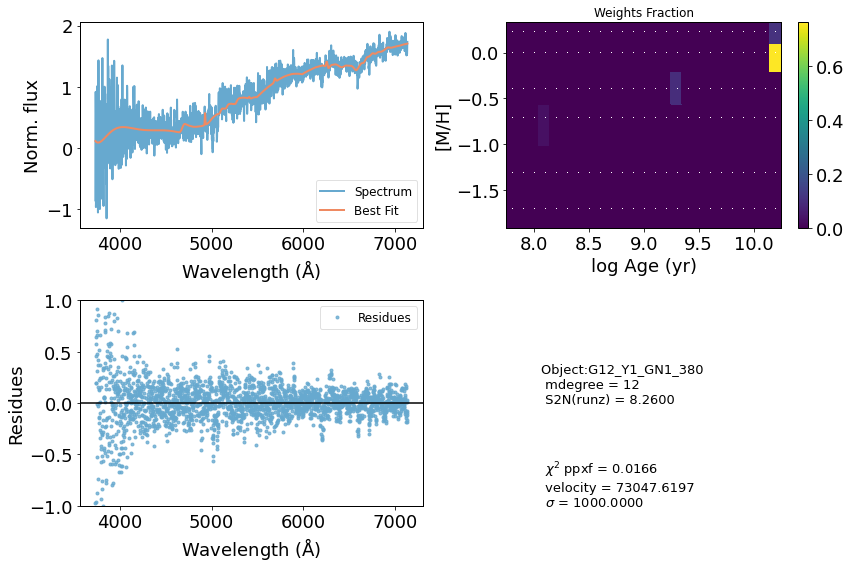

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39227      1000    -0.009     0.003
 comp.  1:     41031       291
 comp.  2:     41078       216
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01316
method = capfit; Jac calls: 7; Func calls: 161; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.945       3.8   41031   291
Comp:  2       Unknown     0.4902       9.7   41078   216
Comp:  2       Unknown          0       9.7   41078   216
Comp:  2       Unknown          0       3.4   41078   216
Comp:  2       Unknown          0         2   41078   216
---------------------------------------------------------
Weighted <logAge> [yr]: 8.6
Weighted <[M/H]>: -0.157
Weighted <logAge> [yr]: 8.6
Weighted <[M/H]>: -0.157
M/L_r: 0.4112
Current $\chi^2$: 0.0132
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


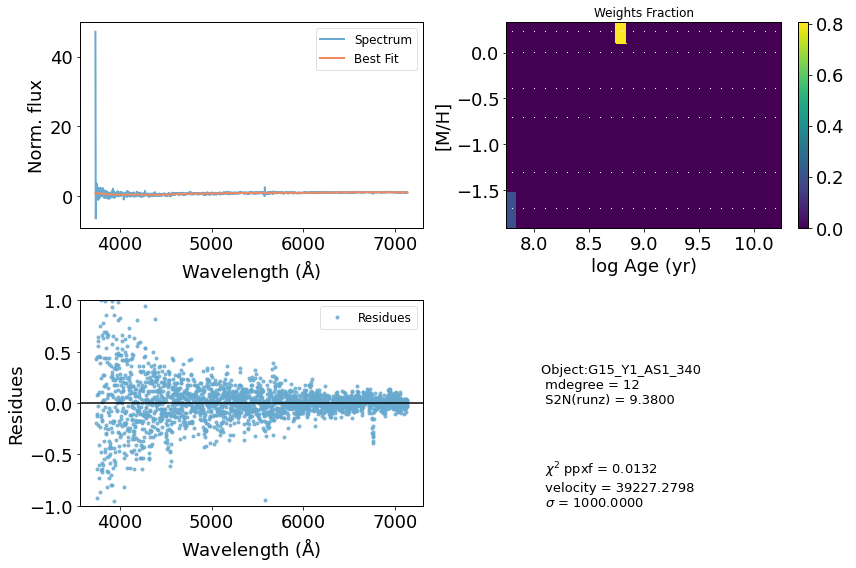

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     65012      1000     0.033     0.154
 comp.  1:     65606       540
 comp.  2:     65513       120
Gas Reddening E(B-V): 0.441
chi2/DOF: 0.0108
method = capfit; Jac calls: 11; Func calls: 251; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  7 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.204       7.9   65606   540
Comp:  2       Unknown     0.5978       2.9   65513   120
Comp:  2       Unknown          0       2.9   65513   120
Comp:  2       Unknown     0.5582       2.6   65513   120
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.056
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.056
M/L_r: 4.372
Current $\chi^2$: 0.0108
Elapsed time in PPXF: 0.87 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


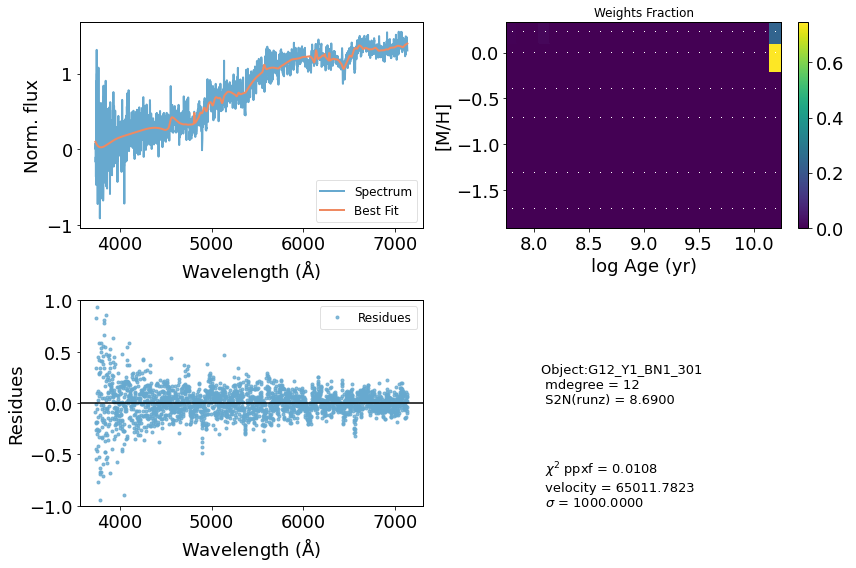

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     44832       527     0.003     0.002
 comp.  1:     44890        95
 comp.  2:     44952         1
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.02596
method = capfit; Jac calls: 14; Func calls: 313; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      2.061       3.6   44890    95
Comp:  2       Unknown          0       2.4   44952     1
Comp:  2       Unknown     0.8879       2.5   44952     1
Comp:  2       Unknown          0       1.9   44952     1
Comp:  2       Unknown          0       1.2   44952     1
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.196
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.196
M/L_r: 5.046
Current $\chi^2$: 0.0260
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


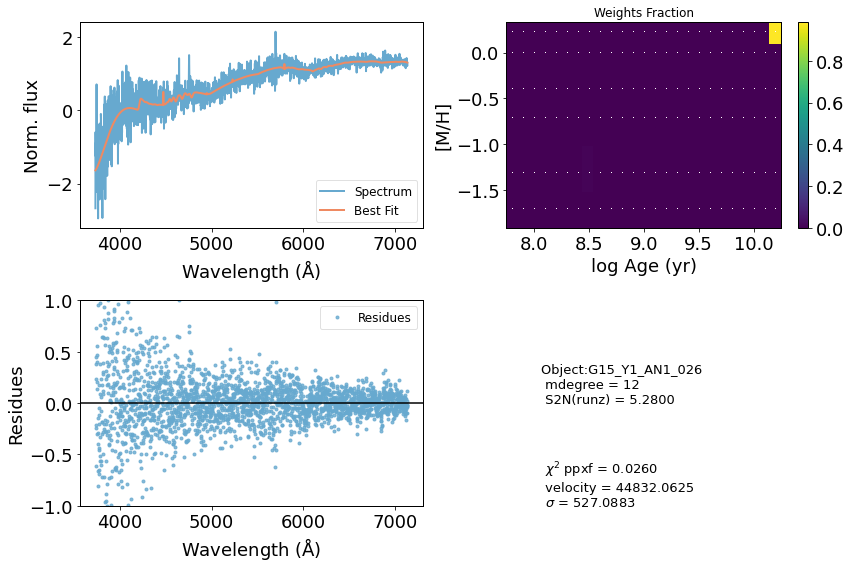

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46999       539    -0.014     0.009
 comp.  1:     47932      1000
 comp.  2:     47654       715
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.003788
method = capfit; Jac calls: 16; Func calls: 363; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.422       9.3   47932  1000
Comp:  2       Unknown          0        31   47654   715
Comp:  2       Unknown      2.742        31   47654   715
Comp:  2       Unknown     0.1767         6   47654   715
Comp:  2       Unknown          0       4.6   47654   715
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
M/L_r: 4.552
Current $\chi^2$: 0.0038
Elapsed t

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


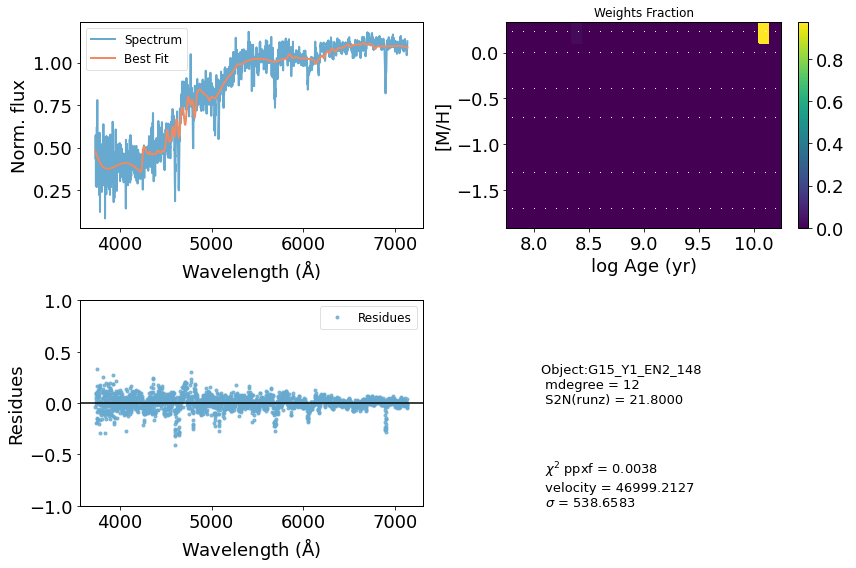

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     34586       839    -0.066    -0.020
 comp.  1:     36776       618
 comp.  2:     34134      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006714
method = capfit; Jac calls: 14; Func calls: 317; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.213         5   36776   618
Comp:  2       Unknown     0.8928        91   34134  1000
Comp:  2       Unknown          0        90   34134  1000
Comp:  2       Unknown      5.017       7.9   34134  1000
Comp:  2       Unknown     0.3691         5   34134  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
M/L_r: 6.799
Current $\chi^2$: 0.0067
Elapsed t

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


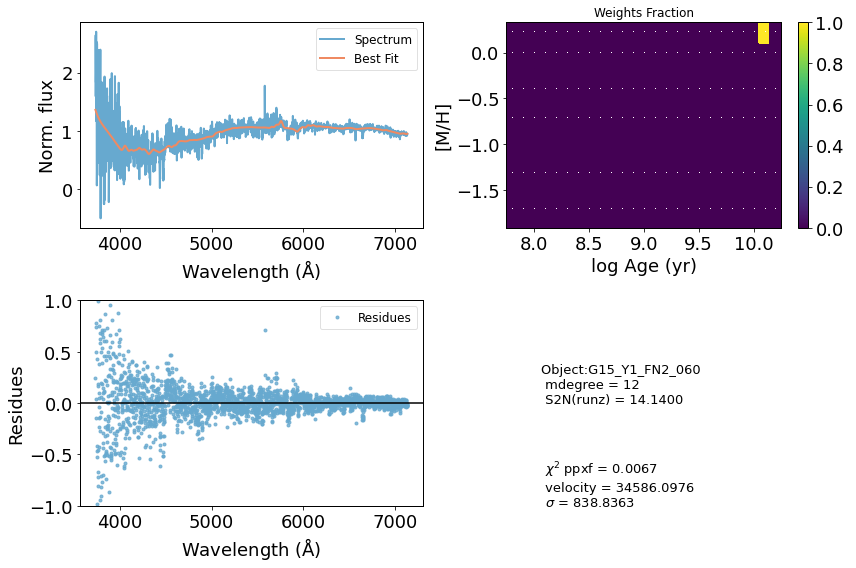

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36935       183    -0.005    -0.005
 comp.  1:     37018       151
 comp.  2:     36932       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.007189
method = capfit; Jac calls: 2; Func calls: 49; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5925       3.2   37018   151
Comp:  2       Unknown          0       6.9   36932   180
Comp:  2       Unknown          0       6.8   36932   180
Comp:  2       Unknown          0       3.5   36932   180
Comp:  2       Unknown          0       2.5   36932   180
---------------------------------------------------------
Weighted <logAge> [yr]: 7.8
Weighted <[M/H]>: -1.71
Weighted <logAge> [yr]: 7.8
Weighted <[M/H]>: -1.71
M/L_r: 0.1626
Current $\chi^2$: 0.0072
Elapsed t

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


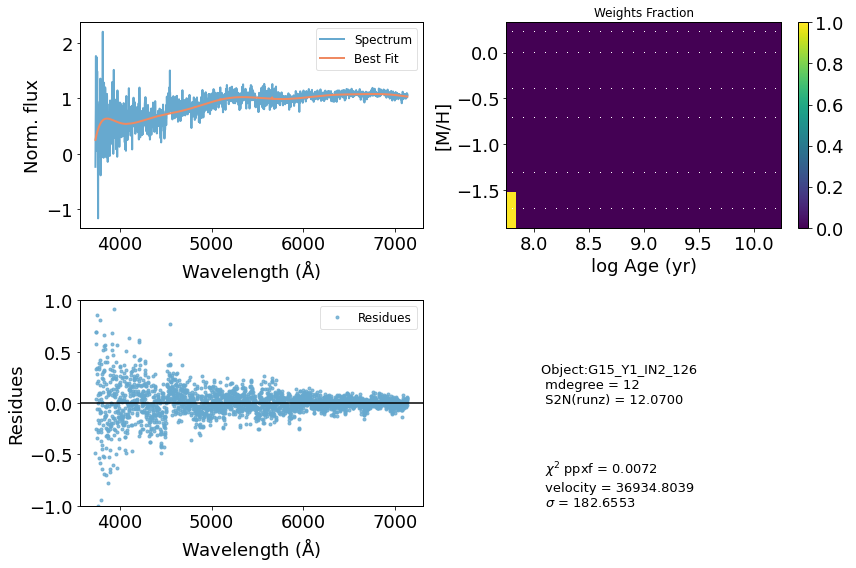

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     42433       224     0.001     0.004
 comp.  1:     42574       261
 comp.  2:     42364       251
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.02247
method = capfit; Jac calls: 12; Func calls: 273; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.901       5.2   42574   261
Comp:  2       Unknown          0       9.3   42364   251
Comp:  2       Unknown          0       9.2   42364   251
Comp:  2       Unknown          0       4.2   42364   251
Comp:  2       Unknown     0.1021       2.4   42364   251
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
M/L_r: 8.088
Current $\chi^2$: 0.0225
Elapsed ti

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


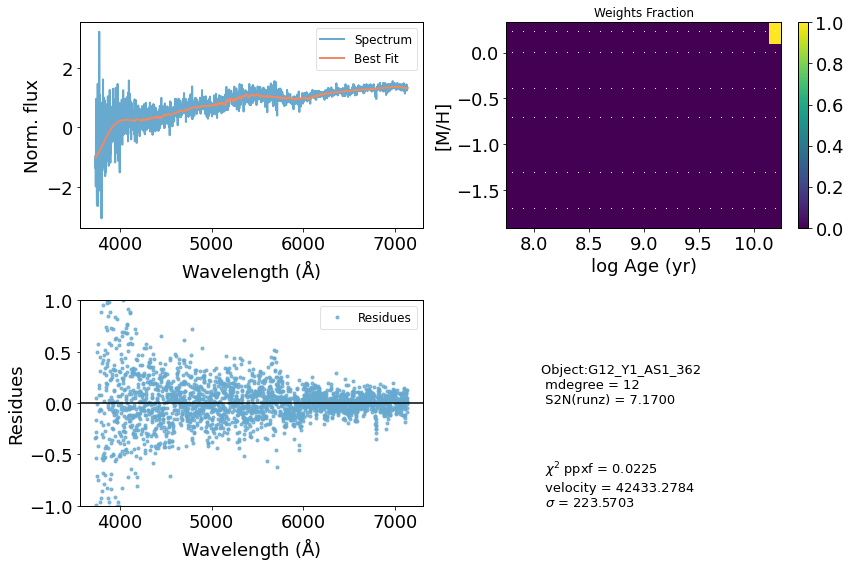

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37430       661    -0.003     0.005
 comp.  1:     38072       608
 comp.  2:     38944       904
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.03566
method = capfit; Jac calls: 11; Func calls: 249; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.184       5.3   38072   608
Comp:  2       Unknown          0        75   38944   904
Comp:  2       Unknown          0        74   38944   904
Comp:  2       Unknown          0       6.8   38944   904
Comp:  2       Unknown       2.94       3.9   38944   904
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.217
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.217
M/L_r: 6.481
Current $\chi^2$: 0.0357
Elapsed 

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


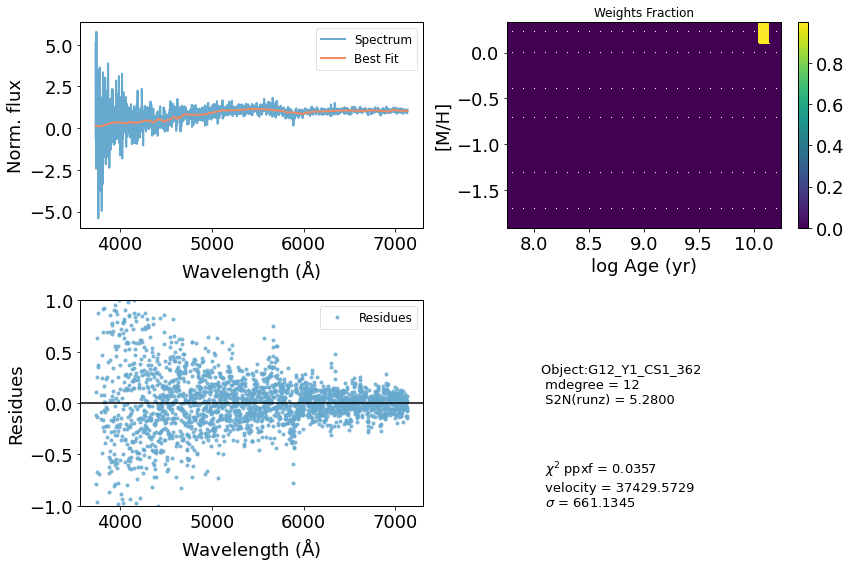

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     33851       146    -0.007     0.009
 comp.  1:     33522       422
 comp.  2:     33833       180
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.01136
method = capfit; Jac calls: 10; Func calls: 225; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.551       4.9   33522   422
Comp:  2       Unknown          0       7.5   33833   180
Comp:  2       Unknown          0       7.2   33833   180
Comp:  2       Unknown          0       3.6   33833   180
Comp:  2       Unknown          0       2.3   33833   180
Comp:  2       Unknown          0         2   33833   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.1
Weighted <[M

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


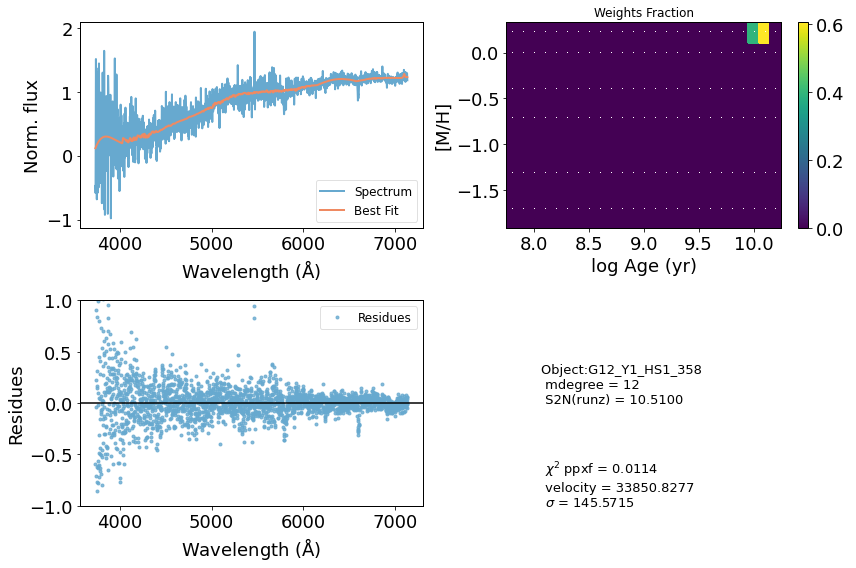

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     46927       415     0.027     0.081
 comp.  1:     46960       797
 comp.  2:     46976       191
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.005196
method = capfit; Jac calls: 11; Func calls: 251; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      3.785       6.2   46960   797
Comp:  2       Unknown     0.6425       7.3   46976   191
Comp:  2       Unknown          0       7.3   46976   191
Comp:  2       Unknown          0       2.7   46976   191
Comp:  2       Unknown          0       1.8   46976   191
---------------------------------------------------------
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.22
M/L_r: 2.771
Current $\chi^2$: 0.0052
Elapsed time

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


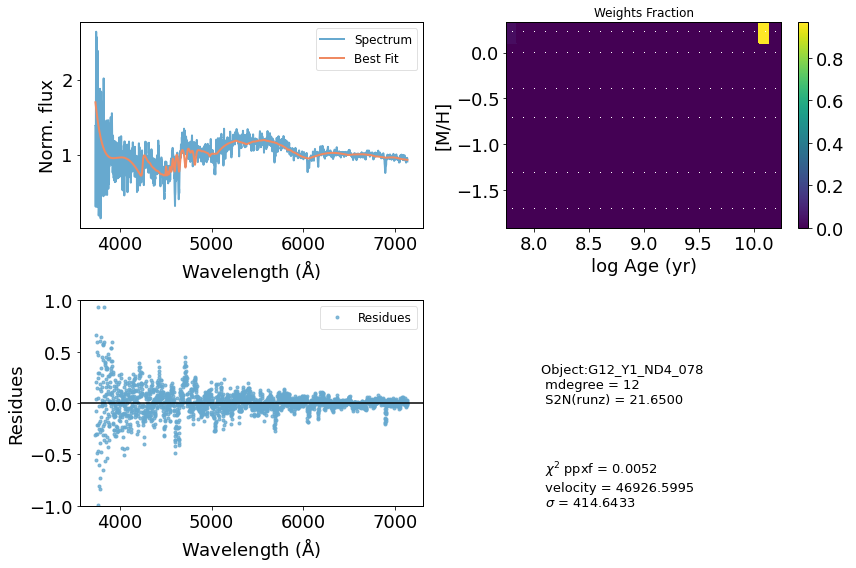

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     56923       889    -0.096     0.021
 comp.  1:     57112      1000
 comp.  2:     57862       203
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.02334
method = capfit; Jac calls: 13; Func calls: 294; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  6 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      21.52       9.7   57112  1000
Comp:  2       Unknown      0.226       8.3   57862   203
Comp:  2       Unknown          0       8.2   57862   203
Comp:  2       Unknown     0.3256       2.2   57862   203
---------------------------------------------------------
Weighted <logAge> [yr]: 9.94
Weighted <[M/H]>: 0.202
Weighted <logAge> [yr]: 9.94
Weighted <[M/H]>: 0.202
M/L_r: 3.407
Current $\chi^2$: 0.0233
Elapsed time in PPXF: 1.00 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


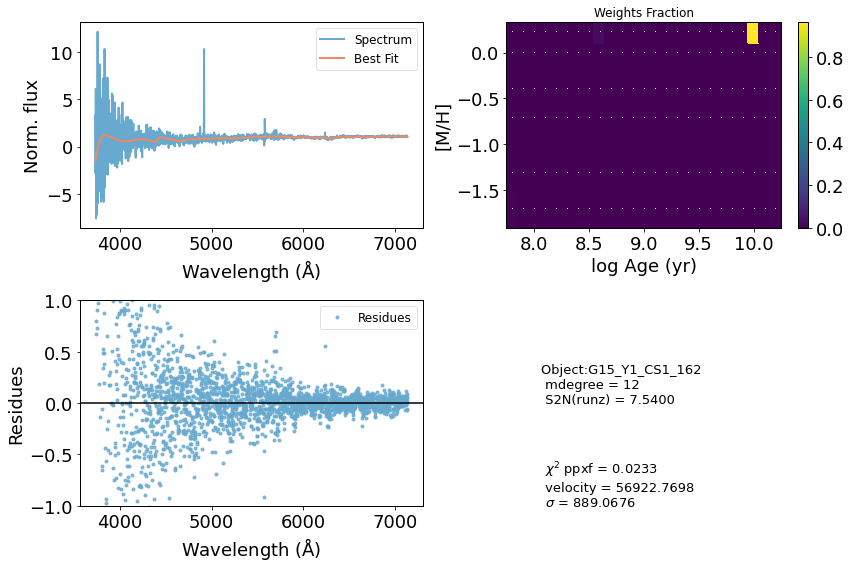

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     40941      1000     0.056     0.196
 comp.  1:     40334      1000
 comp.  2:     38473      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.008097
method = capfit; Jac calls: 30; Func calls: 669; Status: 4
linear_method = nnls; Nonzero Templates (>0.1%):  7 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown       5.82       7.5   40334  1000
Comp:  2       Unknown       2.88        69   38473  1000
Comp:  2       Unknown          0        68   38473  1000
Comp:  2       Unknown     0.6689       7.6   38473  1000
Comp:  2       Unknown       1.75       4.4   38473  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 9.91
Weighted <[M/H]>: 0.123
Weighted <logAge> [yr]: 9.91
Weighted <[M/H]>: 0.123
M/L_r: 1.249
Current $\chi^2$: 0.0081
Elapsed

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


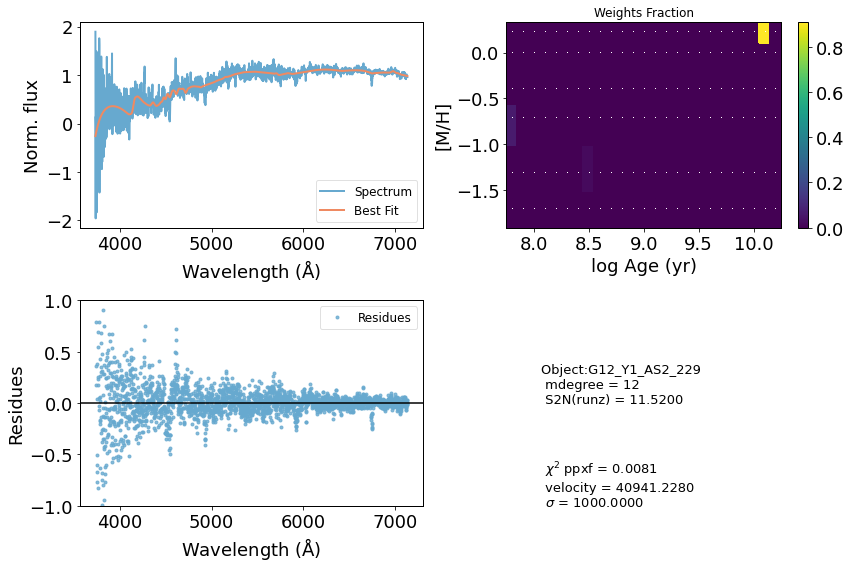

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     71041       323    -0.021     0.004
 comp.  1:     71282       180
 comp.  2:     71527       258
Gas Reddening E(B-V): 4.713
chi2/DOF: 0.008677
method = capfit; Jac calls: 12; Func calls: 271; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown          0       2.6   71282   180
Comp:  2       Unknown    0.09491       6.4   71527   258
Comp:  2       Unknown          0       6.3   71527   258
Comp:  2       Unknown      1.122       3.2   71527   258
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.22
M/L_r: 5.957
Current $\chi^2$: 0.0087
Elapsed time in PPXF: 1.03 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


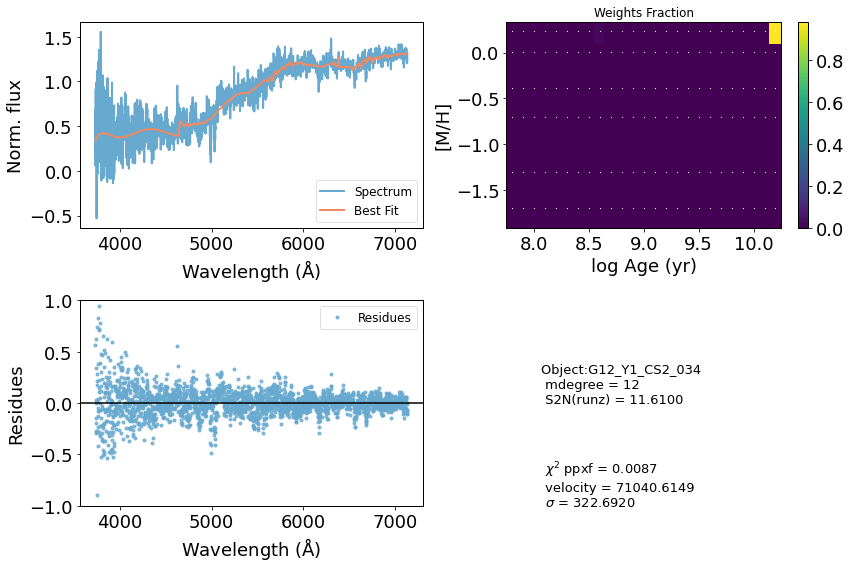

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     37048       848    -0.029     0.022
 comp.  1:     38027       105
 comp.  2:     38128         1
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.006304
method = capfit; Jac calls: 13; Func calls: 299; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.7096       3.4   38027   105
Comp:  2       Unknown          0       2.5   38128     1
Comp:  2       Unknown          0       2.6   38128     1
Comp:  2       Unknown          0         2   38128     1
Comp:  2       Unknown     0.1919       1.4   38128     1
---------------------------------------------------------
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10
Weighted <[M/H]>: 0.22
M/L_r: 5.802
Current $\chi^2$: 0.0063
Elapsed time

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


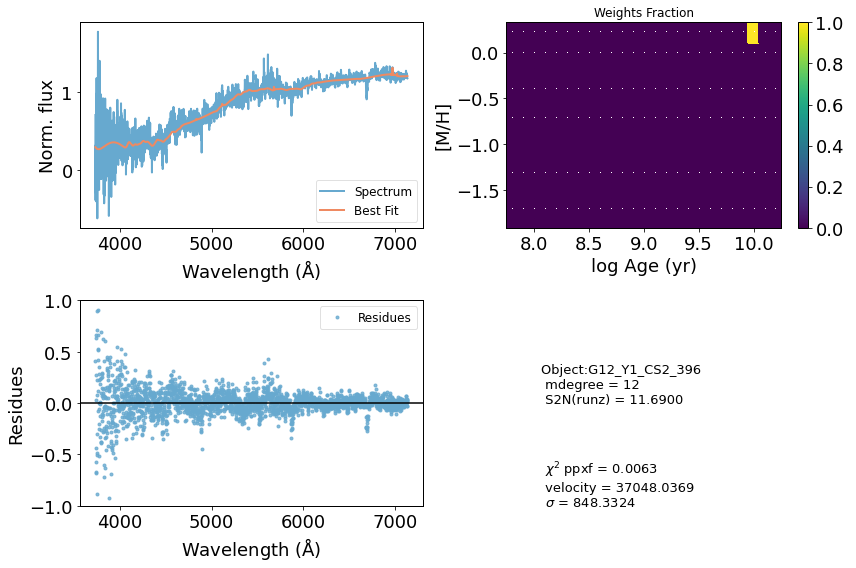

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     48192       581    -0.005     0.008
 comp.  1:     47994       172
 comp.  2:     48123       183
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.0122
method = capfit; Jac calls: 8; Func calls: 183; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  3 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.5061       4.2   47994   172
Comp:  2       Unknown          0       5.8   48123   183
Comp:  2       Unknown     0.2242       5.7   48123   183
Comp:  2       Unknown          0         3   48123   183
Comp:  2       Unknown          0       2.7   48123   183
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.219
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.219
M/L_r: 7.867
Current $\chi^2$: 0.0122
Elapsed ti

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


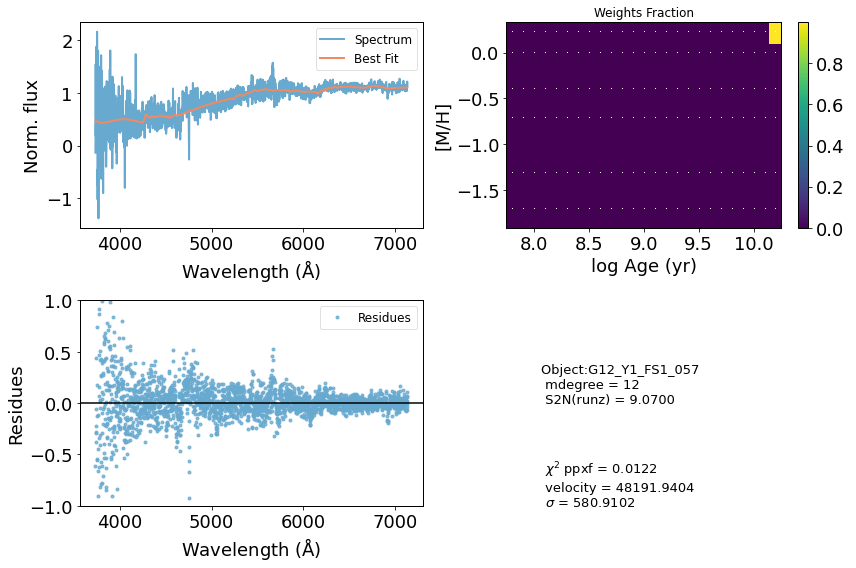

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d'
 '[NII]6583_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     36702       949     0.034    -0.004
 comp.  1:     34886        75
 comp.  2:     34941        44
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.004743
method = capfit; Jac calls: 44; Func calls: 981; Status: 2
linear_method = nnls; Nonzero Templates (>0.1%):  7 / 156
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown     0.2995       2.2   34886    75
Comp:  2       Unknown          0       3.3   34941    44
Comp:  2       Unknown    0.09927       3.3   34941    44
Comp:  2       Unknown          0       2.1   34941    44
Comp:  2       Unknown    0.02692       1.2   34941    44
Comp:  2       Unknown     0.0714       1.2   34941    44
---------------------------------------------------------
Weighted <logAge> [yr]: 10.2
Weighted <[M/H]>: 0.213
Weighted <logAge> [yr]: 10.2
Weighted <[

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


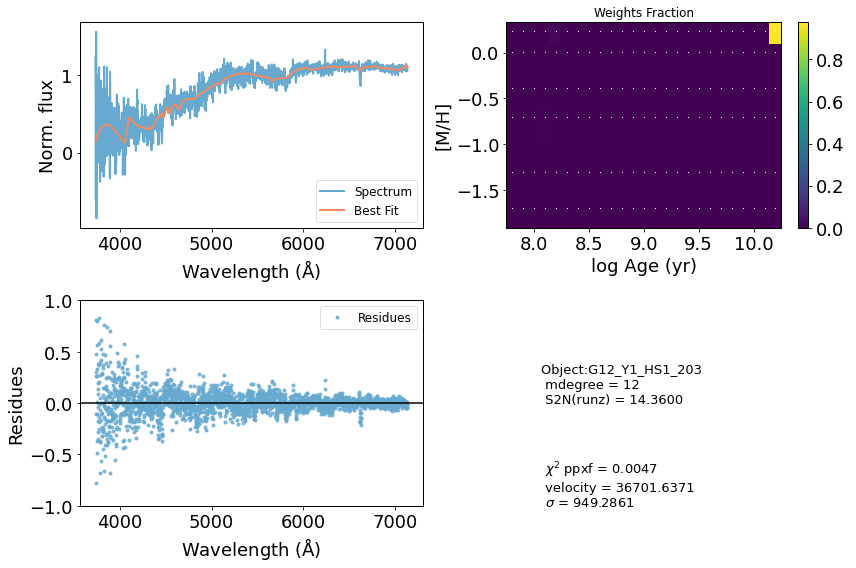

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     50987       258    -0.006    -0.002
 comp.  1:     51839      1000
 comp.  2:     51192       268
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.009259
method = capfit; Jac calls: 19; Func calls: 427; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  7 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      6.589       7.5   51839  1000
Comp:  2       Unknown     0.4477       8.9   51192   268
Comp:  2       Unknown      0.137       8.9   51192   268
Comp:  2       Unknown      1.071       3.2   51192   268
---------------------------------------------------------
Weighted <logAge> [yr]: 9.67
Weighted <[M/H]>: 0.143
Weighted <logAge> [yr]: 9.67
Weighted <[M/H]>: 0.143
M/L_r: 1.259
Current $\chi^2$: 0.0093
Elapsed time in PPXF: 1.46 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


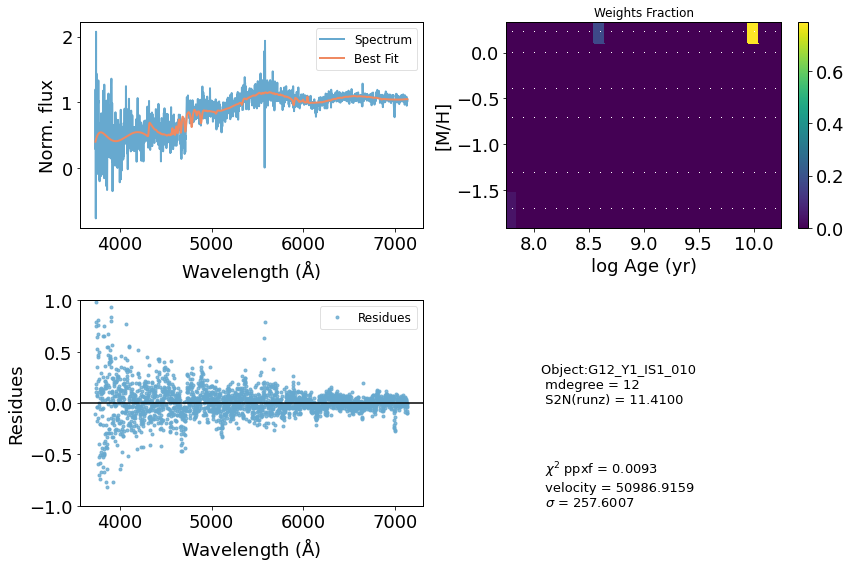

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d' '[OI]6300_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     39311      1000    -0.078     0.266
 comp.  1:     38556       572
 comp.  2:     37941      1000
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.006796
method = capfit; Jac calls: 17; Func calls: 383; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  4 / 155
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      1.694       7.5   38556   572
Comp:  2       Unknown          0        57   37941  1000
Comp:  2       Unknown          0        57   37941  1000
Comp:  2       Unknown          0       8.1   37941  1000
Comp:  2       Unknown      1.494       6.2   37941  1000
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
M/L_r: 5.807
Current $\chi^2$: 0.0068
Elapsed t

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


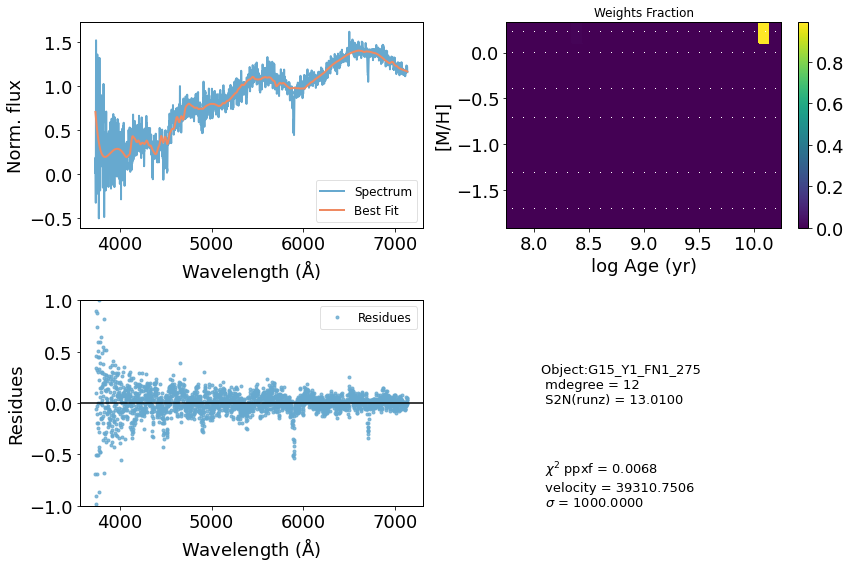

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     75178       326    -0.022     0.032
 comp.  1:     77565       557
 comp.  2:     77178       180
Gas Reddening E(B-V): 0.000
chi2/DOF: 0.01016
method = capfit; Jac calls: 9; Func calls: 205; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  2 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      4.392       7.9   77565   557
Comp:  2       Unknown          0       4.3   77178   180
Comp:  2       Unknown          0       4.3   77178   180
Comp:  2       Unknown          0       2.5   77178   180
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.22
M/L_r: 6.799
Current $\chi^2$: 0.0102
Elapsed time in PPXF: 0.64 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


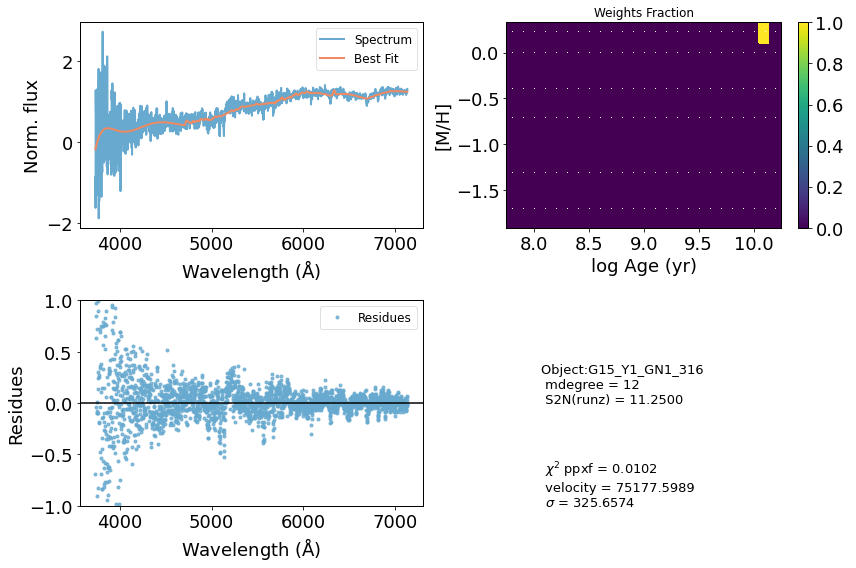

/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: invalid value encountered in greater
/home/mlldantas/anaconda3/lib/python3.7/site-packages/ppxf/miles_util.py:169: RuntimeWarning: invalid value encountered in sqrt
  FWHM_dif = np.sqrt(FWHM_gal**2 - FWHM_tem**2)


Emission lines included in gas templates:
['Balmer' '[OII]3726' '[OII]3729' '[OIII]5007_d']


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:96: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


 Best Fit:       Vel     sigma        h3        h4
 comp.  0:     51321       690     0.010     0.014
 comp.  1:     51052      1000
 comp.  2:     51782       154
Gas Reddening E(B-V): -0.000
chi2/DOF: 0.009535
method = capfit; Jac calls: 14; Func calls: 314; Status: 3
linear_method = nnls; Nonzero Templates (>0.1%):  5 / 154
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
gas_component   name       flux       err      V     sig
+++++++++++++++++++++++++++++++++++++++++++++++++++++++++
Comp:  1       Unknown      14.29        10   51052  1000
Comp:  2       Unknown          0       4.3   51782   154
Comp:  2       Unknown     0.8207       4.7   51782   154
Comp:  2       Unknown      0.396       2.8   51782   154
---------------------------------------------------------
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.186
Weighted <logAge> [yr]: 10.1
Weighted <[M/H]>: 0.186
M/L_r: 3.641
Current $\chi^2$: 0.0095
Elapsed time in PPXF: 1.13 [min]


/home/mlldantas/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:104: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


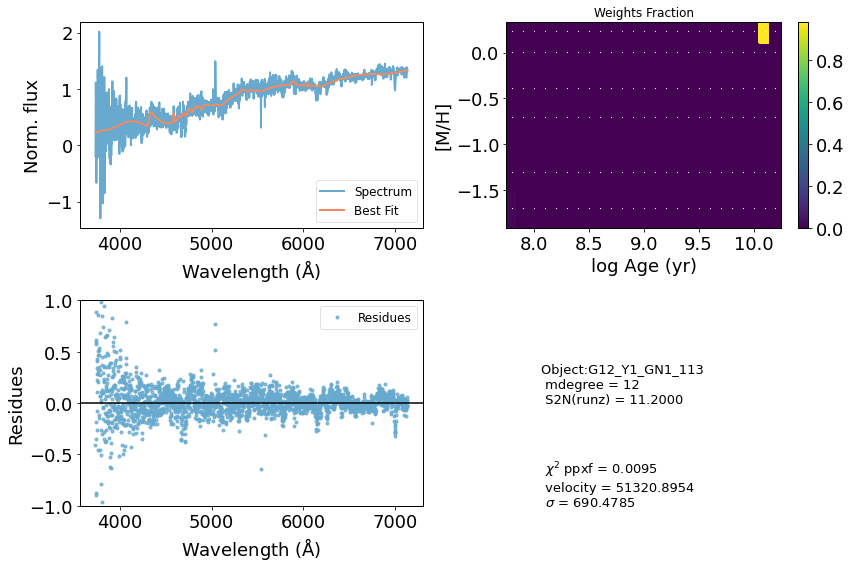

--------------------------------------------------
CPU process time: 26547409.00 [min]
--------------------------------------------------


In [21]:
start_time_all = time.time()
ids_vel = ['CATAID']
for each_sed in range(len(seds_list)):
# for each_sed in range(2):
    
    # settings for the progress bar widget above: does not influence in ppxf -------------------------------------
    bar.value += each_sed/2.                                          # signal to increment the progress bar
    if each_sed<len(seds_list): 
        bar.bar_style = ""                                            # blue when in progress
    else: 
        bar.bar_style = "success"                                     # green when it finishes        
        
    # flux -------------------------------------------------------------------------------------------------------
    sed_file  = os.path.join(seds_path, seds_list[each_sed])          # link between path and files
    sed_flux  = pf.getdata(sed_file)[0]                               # opening each spectra
    sed_err   = pf.getdata(sed_file)[1]                               # opening each spectra error
    
    # wavelength -------------------------------------------------------------------------------------------------
    sed_header = pf.open(sed_file)[0].header
    sed_wl_ini = sed_header['WMIN'] 
    sed_wl_stp = sed_header['CD1_1']
    sed_wl     = np.arange(sed_flux.size)*(sed_wl_stp)+sed_wl_ini     # sed wavelength    
#     plot_sed(sed_wl, sed_flux, sed_err)
    
    # cleaning flux and wavelength trash -------------------------------------------------------------------------
    idx_clean       = np.where((np.logical_not(np.isnan(sed_flux)))*(sed_err>0)) # indices where NAN is present
    flux_temp       = sed_flux[idx_clean]                                   # removing NAN values from spectra
    flux_temp_err   = sed_err[idx_clean]
    wavelength_temp = sed_wl[idx_clean]    
#     plot_sed(wavelength_temp, flux_temp, flux_temp_err)
    
    # limiting the spectrum regarding the wavelength range of the library ----------------------------------------
    wl_lib_idx = (wavelength_temp>wl_min) & (wavelength_temp<wl_max)       # MILES wavelength range
    flux       = flux_temp[wl_lib_idx]
    flux_err   = flux_temp_err[wl_lib_idx]
    wavelength = wavelength_temp[wl_lib_idx]    
#     plot_sed(wavelength, flux, flux_err)    
    
    # other important parameters ---------------------------------------------------------------------------------
    redshift  = sed_header['Z']
    cataid    = sed_header['CATAID']
#     fwhm_gama = wavelength*gama_resol
    fwhm_gama = 2.
    
    # ppxf -------------------------------------------------------------------------------------------------------
    vel_scale          = light_speed*np.log(wavelength[1]/wavelength[0])      # velocity scale - 
                                                                              # Eq.8 Capellari 2017
    
    ### setup templates ------------------------------------------------------------------------------------------
    #### stellar pops --------------------------------------------------------------------------------------------
    miles              = lib.miles(miles_lib, vel_scale, fwhm_gama)
    stellar_templates  = miles.templates.reshape(miles.templates.shape[0], -1)
    reg_dim            = miles.templates.shape[1:]
    dv                 = light_speed*(miles.log_lam_temp[0] - np.log(wavelength[0])) # eq.(8) of Cappellari (2017)
    vel                = light_speed*np.log(1 + redshift)                            # eq.(8) of Cappellari (2017)
    start              = [vel, 180.]
    
    #### gas templates -------------------------------------------------------------------------------------------
    wl_range_galaxy = np.array([np.min(wavelength), np.max(wavelength)])/(1 + redshift)
    gas_templates, gas_names, line_wave = util.emission_lines(miles.log_lam_temp, wl_range_galaxy, fwhm_gama, 
                                                              tie_balmer=tied_balmer, 
                                                              limit_doublets=limit_doublets)
    number_of_templates = stellar_templates.shape[1]
    number_of_forbidden = np.sum(["[" in a for a in gas_names])                 # forbidden lines contain "[*]"
    number_of_balmer    = len(gas_names) - number_of_forbidden
        
    component = (stellar_comp_w*number_of_templates)+(balmer_comp_w*number_of_balmer)+(forbid_comp_w
                                                                                       *number_of_forbidden)
        
    gas_component = np.array(component) > 0       # gas_component=True for gas templates
    start3        = [start, start, start]         # adopt the same starting value for the 3 components
    gas_reddening = 0 if tied_balmer else None  # If the Balmer lines are tied one should allow for gas reddening.
    
    
    #### all templates -------------------------------------------------------------------------------------------
    all_templates = np.column_stack([stellar_templates, gas_templates])
    
    ### rebinning the spectrum so it is at the same size as the templates (or smaller) ---------------------------
    new_shape          = stellar_templates[:,0].shape
    rebinning_function = sci.interp1d(wavelength, flux)   # for the flux
    wavelength_rebin   = np.linspace(start=wavelength.min(), stop=wavelength.max(), num=int(new_shape[0]))
    flux_rebin         = rebinning_function(wavelength_rebin)
    
    ### rebinning the error --------------------------------------------------------------------------------------
    rebin_func_error   = sci.interp1d(wavelength, flux_err)
    wl_rebin_error     = np.linspace(start=wavelength.min(), stop=wavelength.max(), num=int(new_shape[0]))
    flux_err_rebin     = rebin_func_error(wavelength_rebin)
    
    ### final galaxy spectrum and its error to be analysed -------------------------------------------------------
    galaxy             = flux_rebin/np.median(flux_rebin)           # Normalize spectrum to avoid numerical issues
    noise              = flux_err_rebin/np.median(flux_err_rebin)       # idem
    
#     plot_sed(wavelength_rebin, galaxy, noise)    
    
    ### SED FITTING WITH PPXF ------------------------------------------------------------------------------------
    start_time = time.clock()
    sed_fit = ppxf(templates=all_templates, galaxy=galaxy, noise=noise, velscale=vel_scale, start=start3, 
                   plot=False, lam=wavelength_rebin, moments=moments, degree=degree, mdegree=mdegree, 
#                    regul=1./regul_err, 
                   reg_dim=reg_dim, vsyst=dv, clean=False, component=component, 
                   gas_component=gas_component, gas_reddening=gas_reddening, 
#                    bounds=bounds_gas
                  )
    end_time = time.clock()
    
    ## output parameters -- most of them will become a dataframe at the end of the script  
    residues = (galaxy-sed_fit.bestfit)
    
    stellar_weights = sed_fit.weights[~gas_component]                       # Exclude weights of the gas templates
    stellar_weights = stellar_weights.reshape(reg_dim)/stellar_weights.sum()  # Normalized
    
    velocity = sed_fit.sol[0][0]
    sigma    = sed_fit.sol[0][1]
    
    mean_age.append(miles.mean_age_metal(stellar_weights)[0])
    mean_metal.append(miles.mean_age_metal(stellar_weights)[1])
    mass2light.append(miles.mass_to_light(stellar_weights, band="r"))
    ids.append(cataid)
    redshifts.append(redshift)
    
    ###################### SAVING DATAFRAME WITH FIT OUTPUTS ###################
    outputs_line = [cataid, sigma, sed_fit.chi2, velocity, mean_age, mean_metal, mass2light]
    if each_sed==0:
        outputs_physical = np.array(outputs_line)
    else:
        outputs_physical = np.vstack((outputs_physical, np.array(outputs_line)))
    #############################################################################
    
       
    print(r"Current $\chi^2$: %.4f" % (sed_fit.chi2))
    print('Elapsed time in PPXF: %.2f [min]' % ((end_time-start_time)/60))
    
    
    ### Saving fit results ---------------------------------------------------------------------------------------
    output = {}
    output['wavelength'] = wavelength_rebin
    output['flux']       = sed_fit.galaxy
    output['best_fit']   = sed_fit.bestfit
    
    output_df = pd.DataFrame(output)
    output_df.to_csv(os.path.join(results_path, 'fit_'+str(cataid)+'_d'+ str(degree)+'_'+str(mdegree)+
                                  '_'+str(wl_min) +'.csv'), index=False)
    vel_disp.append(sigma)
    ids_vel.append(cataid)

    ### Saving plots ---------------------------------------------------------------------------------------------
    plt.subplots(figsize=(12,8))
    
    #### plot01 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,1)
    plt.plot(wavelength_rebin[:-200], sed_fit.galaxy[:-200], '-', color=palette[-1], linewidth=lw, 
             label="Spectrum")
    plt.plot(wavelength_rebin[:-200], sed_fit.bestfit[:-200], '-', color=palette[0], linewidth=lw, 
             label="Best Fit")
#     plt.title("Object %s: S/N=%.4f" % (cataid, s2n_top10[each_sed]))
    plt.legend(loc='best')
    plt.xlabel("Wavelength ($\mathrm{\AA}$)")
    plt.ylabel("Norm. flux")
    
    #### plot02 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,2)
    miles.plot(stellar_weights)
    
    #### plot03 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,3)
    plt.plot(wavelength_rebin[:-200], residues[:-200], '.', color=palette[-1], linewidth=lw, label="Residues", 
             alpha=transparency)
    plt.axhline(y=0, c='black')
    plt.legend(loc='best')
    plt.xlabel("Wavelength ($\mathrm{\AA}$)")
    plt.ylabel("Residues")
    plt.ylim([-1,1])
    
    #### plot04 --------------------------------------------------------------------------------------------------
    plt.subplot(2,2,4)
    plt.text(0.1, 0.5, "Object:{:s} \n mdegree = {:d} \n S2N(runz) = {:.4f}".format(sed_header['SPECID'], mdegree,
                    sed_header['SN']), fontsize=13)
             
             
    plt.text(0.1, 0.0, " \n $\chi^2$ ppxf = {:.4f} \n velocity = {:.4f} \n $\sigma$ = {:.4f}".
             format(sed_fit.chi2, velocity, sigma), fontsize=13)
    plt.axis('off') 
    figname = 'gal_'+str(cataid)+'_d'+str(degree)+'_m'+str(mdegree)+'_'+str(wl_min)
    plt.tight_layout()
    plt.savefig(os.path.join(results_path, figname +'.png'))
    plt.savefig(os.path.join(results_path, figname +'.pdf'))
    plt.show()

outputs_physical = pd.DataFrame(outputs_physical)
outputs_physical.columns = outputs_physical_header

# sigma_data = np.column_stack([ids_vel, vel_disp])
# sigma_data = pd.DataFrame(sigma_data)
outputs_physical.to_csv(results_path +'parameters_d'+str(degree)+ '_m'+str(mdegree)+'.csv', index=False)
end_time_all = time.time()
print_time(start_time_all, end_time_all)